In [2]:
from google.colab import drive
drive.mount('/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
4/4AFl1KXO6oA2Z0Ydx-n9l_HONKY4_hb7kpTxDYwm5ifhIEdJZpCSJbk
Mounted at /gdrive


In [3]:
### for go up directory
%cd ..
### to go to directory
%cd ./gdrive/My Drive/Colab Notebooks/RoadSign_Classifier
%ls

/
/gdrive/My Drive/Colab Notebooks/RoadSign_Classifier
 classBarChart.png      signnames.csv
 data/                  Traffic_Sign_Classifier_AugmentedSet.ipynb
 image-processing.png   X_train_augmented.npy
 models/                y_train_augmented.npy
'models (1)'/


In [1]:
# Find out your current working directory
import os
print(os.getcwd())
# Display all of the files found in your current working directory
print(os.listdir(os.getcwd()))

# change your current working directory to the directory where the files reside using `os.chdir()`

C:\Users\lveys\Downloads
['.ipynb_checkpoints', 'architecture.png', 'cudnn-11.0-windows-x64-v8.0.3.33.zip', 'data', 'desktop.ini', 'images', 'jitsi-2-10-5550.exe', 'losscurves.png', 'models', 'results-augmented.png', 'signnames.csv', 'Traffic_Sign_Classifier_AugmentedSet (1).ipynb', 'Traffic_Sign_Classifier_AugmentedSet.ipynb', 'Traffic_Sign_Classifier_AugmentedSet_gray.ipynb', 'X_train_augmented.npy', 'y_train_augmented.npy']


# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages, which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission if necessary. 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the iPython Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission. 

In addition to implementing code, there is a writeup to complete. The writeup should be completed in a separate file, which can be either a markdown file or a pdf document. There is a [write up template](https://github.com/udacity/CarND-Traffic-Sign-Classifier-Project/blob/master/writeup_template.md) that can be used to guide the writing process. Completing the code template and writeup template will cover all of the [rubric points](https://review.udacity.com/#!/rubrics/481/view) for this project.

The [rubric](https://review.udacity.com/#!/rubrics/481/view) contains "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. The stand out suggestions are optional. If you decide to pursue the "stand out suggestions", you can include the code in this Ipython notebook and also discuss the results in the writeup file.


>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

## Step 0: Load The Data

In [2]:
# Load pickled data
import pickle
import numpy as np
import matplotlib.pyplot as plt

# TODO: Fill this in based on where you saved the training and testing data

training_file = './data/train.p'
validation_file= './data/valid.p'
testing_file = './data/test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(validation_file, mode='rb') as f:
    valid = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_valid, y_valid = valid['features'], valid['labels']
X_test, y_test = test['features'], test['labels']

In [3]:
print(X_train.shape, y_train.shape)
print(y_train[0])
print(X_train[0].shape)
print(X_train.min(), X_train.max())

(34799, 32, 32, 3) (34799,)
41
(32, 32, 3)
0 255


In [4]:
np.unique(y_train)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42], dtype=uint8)

In [5]:
count=np.zeros((len(np.unique(y_train))))
for c in np.unique(y_train):
    count[c]=sum(p==c for p in y_train)

In [6]:
for i in range(len(count)):
    print('Class n°{} \ttotal number of samples = {}\t percentage dataset: {:.1f} %'.format(i, int(count[i]), (100*int(count[i])/len(y_train))))

Class n°0 	total number of samples = 180	 percentage dataset: 0.5 %
Class n°1 	total number of samples = 1980	 percentage dataset: 5.7 %
Class n°2 	total number of samples = 2010	 percentage dataset: 5.8 %
Class n°3 	total number of samples = 1260	 percentage dataset: 3.6 %
Class n°4 	total number of samples = 1770	 percentage dataset: 5.1 %
Class n°5 	total number of samples = 1650	 percentage dataset: 4.7 %
Class n°6 	total number of samples = 360	 percentage dataset: 1.0 %
Class n°7 	total number of samples = 1290	 percentage dataset: 3.7 %
Class n°8 	total number of samples = 1260	 percentage dataset: 3.6 %
Class n°9 	total number of samples = 1320	 percentage dataset: 3.8 %
Class n°10 	total number of samples = 1800	 percentage dataset: 5.2 %
Class n°11 	total number of samples = 1170	 percentage dataset: 3.4 %
Class n°12 	total number of samples = 1890	 percentage dataset: 5.4 %
Class n°13 	total number of samples = 1920	 percentage dataset: 5.5 %
Class n°14 	total number of samp

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 1D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below. Use python, numpy and/or pandas methods to calculate the data summary rather than hard coding the results. For example, the [pandas shape method](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.shape.html) might be useful for calculating some of the summary results. 

### Provide a Basic Summary of the Data Set Using Python, Numpy and/or Pandas

In [7]:
### Replace each question mark with the appropriate value. 
### Use python, pandas or numpy methods rather than hard coding the results

# TODO: Number of training examples
n_train = len(X_train)
assert len(X_train) == len(y_train), 'Error in the training data'

# TODO: Number of validation examples
n_validation = len(X_valid)
assert len(X_valid) == len(y_valid), 'Error in the validation data'

# TODO: Number of testing examples.
n_test = len(X_test)
assert len(X_test) == len(y_test), 'Error in the testing data'


# TODO: What's the shape of an traffic sign image?
image_shape = X_train[0].shape

# TODO: How many unique classes/labels there are in the dataset.
n_classes = len(np.unique(y_train))

print("Number of training examples =", n_train)
print("Number of validation examples =", n_validation)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 34799
Number of validation examples = 4410
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


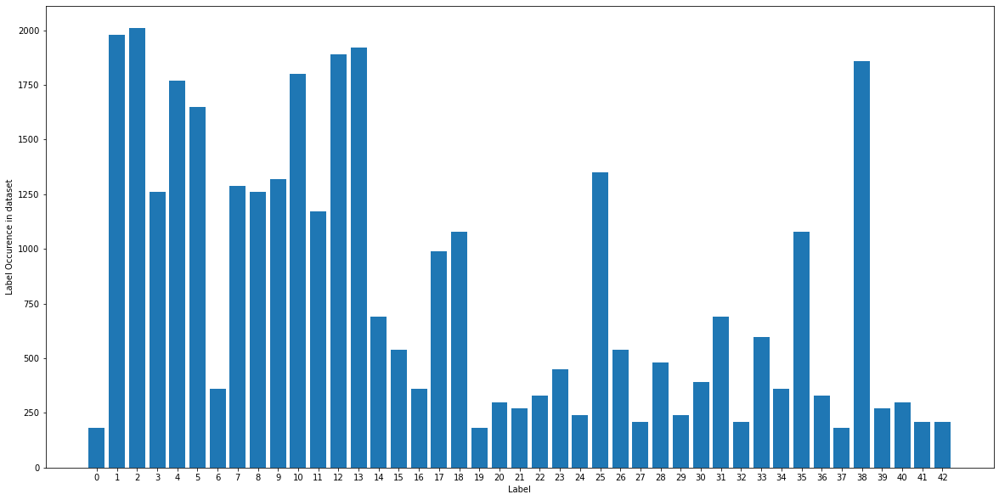

In [8]:
plt.figure(figsize=(20,10))
plt.bar(x=range(n_classes), height=count, align='center', tick_label = range(n_classes))
plt.xticks(range(n_classes))
plt.xlabel('Label')
plt.ylabel('Label Occurence in dataset')
plt.savefig('classBarChart.png')
plt.show()

## The dataset is very unbalanced with classes way under-represented. This will require data augmentation.

### Include an exploratory visualization of the dataset

Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc. 

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections. It can be interesting to look at the distribution of classes in the training, validation and test set. Is the distribution the same? Are there more examples of some classes than others?

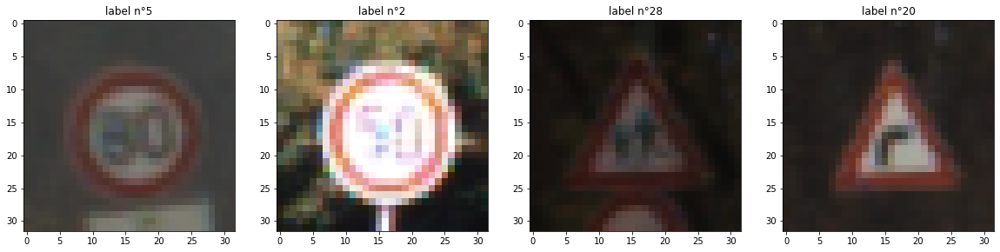

In [9]:
### Data exploration visualization code goes here.
### Feel free to use as many code cells as needed.
import matplotlib.pyplot as plt
import random
# Visualizations will be shown in the notebook.
%matplotlib inline
sample = 4

plt.figure(figsize=(20,20))
for index in range(sample):
    plt.subplot(1, sample, index+1)
    n = random.randrange(0, n_train)
    title = 'label n°' + str(y_train[n])
    plt.title(title)
    plt.imshow(X_train[n])
plt.show()

## Explore the class labels

In [10]:
import pandas as pd 
# Read data from file 'filename.csv' (in the same directory that your python process is based)
# Control delimiters, rows, column names with read_csv (see later) 
sign_names = pd.read_csv("signnames.csv") 
print(len(sign_names))
sign_names.head()

43


,ClassId,SignName
0,0,Speed limit (20km/h)
1,1,Speed limit (30km/h)
2,2,Speed limit (50km/h)
3,3,Speed limit (60km/h)
4,4,Speed limit (70km/h)


In [11]:
labels = np.unique(y_train)
list_of_images_per_label = []
for label in sorted(labels):
    list_of_images_per_label.append([x for x in range(0, n_train) if y_train[x] == label])
    
print(len(list_of_images_per_label))
list_of_images_per_label[0][10]

43


9970

## show samples of each class

In [12]:
def plot_samples(max_sample, label, samples):
    plt.figure(figsize=(10,5))
    count = 1
    title = sign_names.iloc[label,1]
    print('label n°: ', label,'\t', title)
    for sample in samples:
        plt.subplot(1, max_sample, count)
        plt.imshow(X_train[sample])
        count +=1
    plt.show()

label n°:  0 	 Speed limit (20km/h)


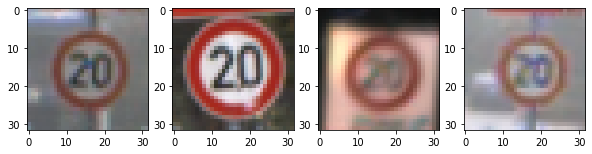

label n°:  1 	 Speed limit (30km/h)


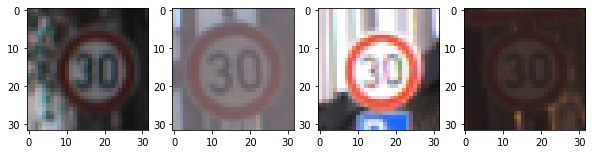

label n°:  2 	 Speed limit (50km/h)


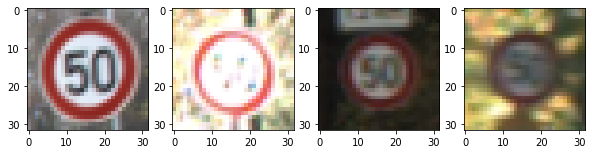

label n°:  3 	 Speed limit (60km/h)


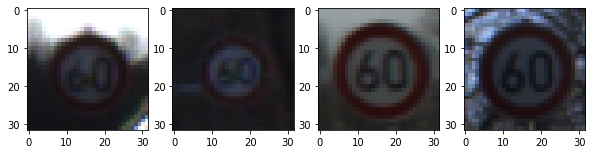

label n°:  4 	 Speed limit (70km/h)


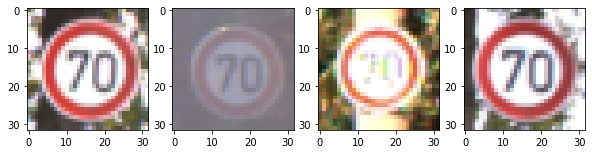

label n°:  5 	 Speed limit (80km/h)


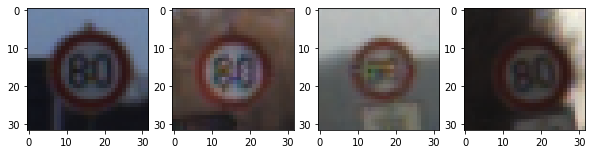

label n°:  6 	 End of speed limit (80km/h)


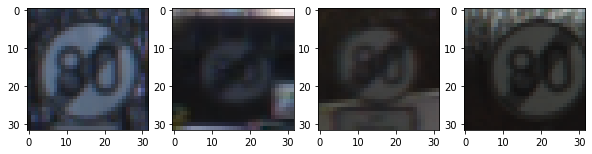

label n°:  7 	 Speed limit (100km/h)


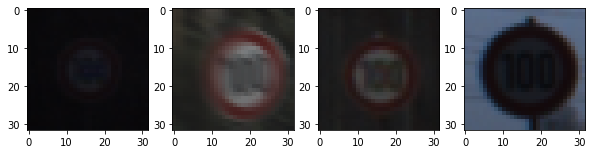

label n°:  8 	 Speed limit (120km/h)


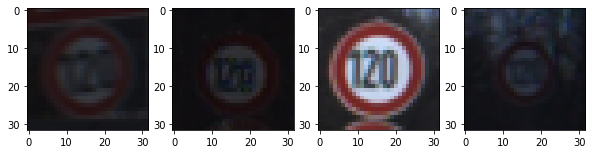

label n°:  9 	 No passing


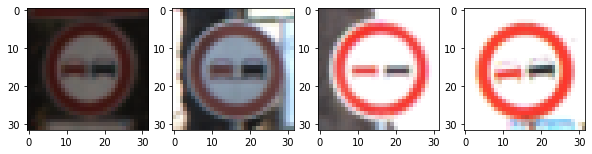

label n°:  10 	 No passing for vehicles over 3.5 metric tons


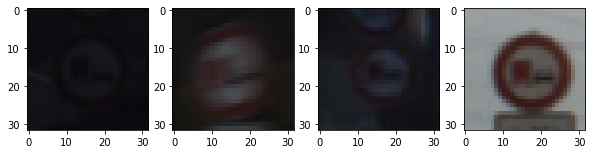

label n°:  11 	 Right-of-way at the next intersection


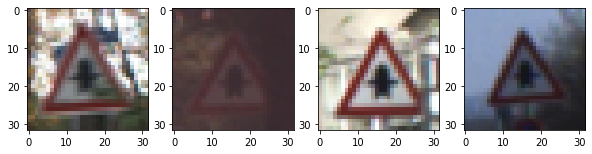

label n°:  12 	 Priority road


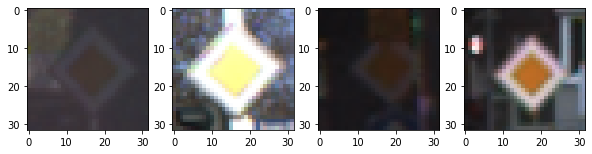

label n°:  13 	 Yield


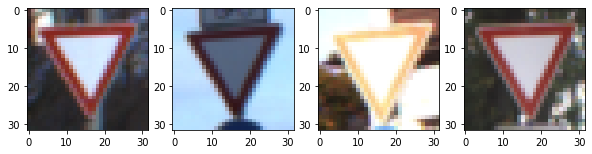

label n°:  14 	 Stop


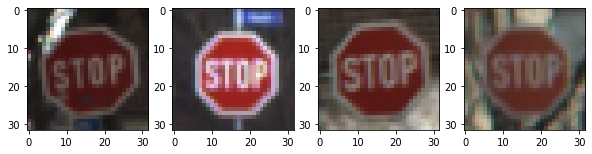

label n°:  15 	 No vehicles


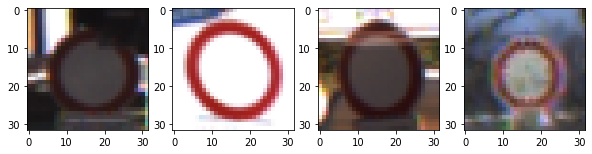

label n°:  16 	 Vehicles over 3.5 metric tons prohibited


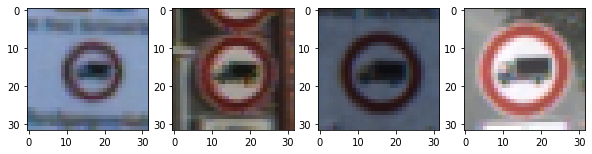

label n°:  17 	 No entry


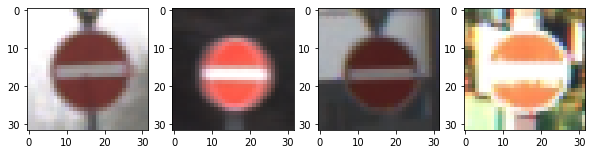

label n°:  18 	 General caution


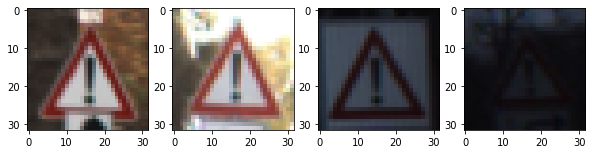

label n°:  19 	 Dangerous curve to the left


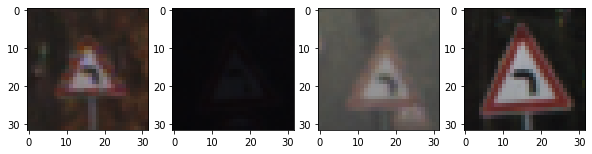

label n°:  20 	 Dangerous curve to the right


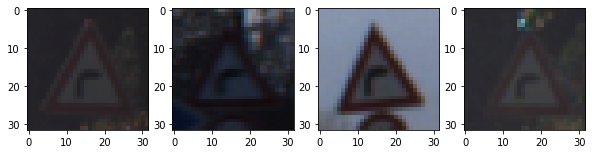

label n°:  21 	 Double curve


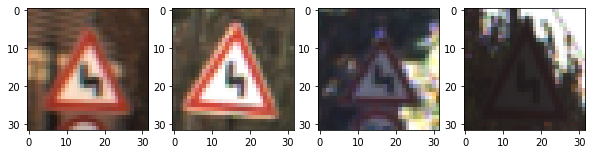

label n°:  22 	 Bumpy road


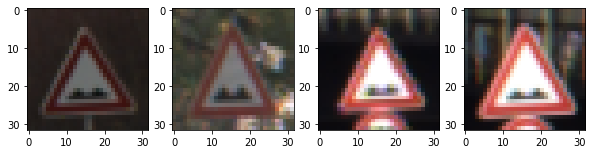

label n°:  23 	 Slippery road


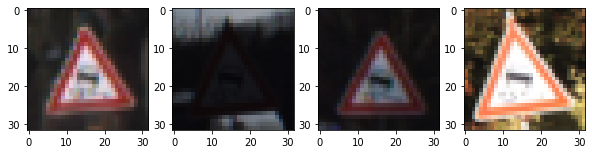

label n°:  24 	 Road narrows on the right


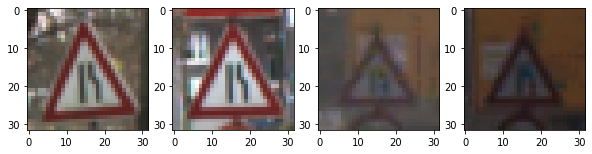

label n°:  25 	 Road work


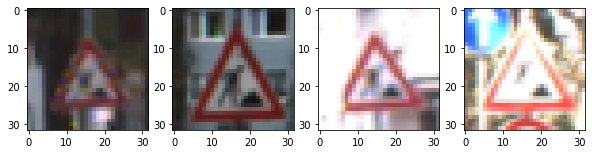

label n°:  26 	 Traffic signals


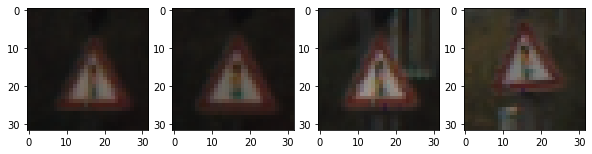

label n°:  27 	 Pedestrians


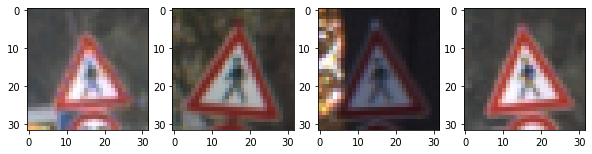

label n°:  28 	 Children crossing


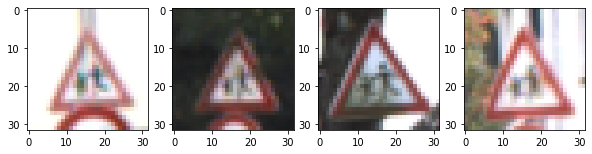

label n°:  29 	 Bicycles crossing


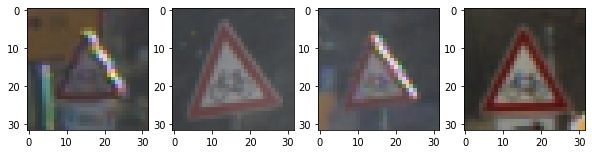

label n°:  30 	 Beware of ice/snow


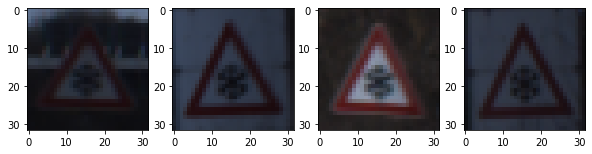

label n°:  31 	 Wild animals crossing


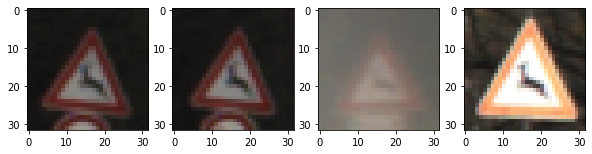

label n°:  32 	 End of all speed and passing limits


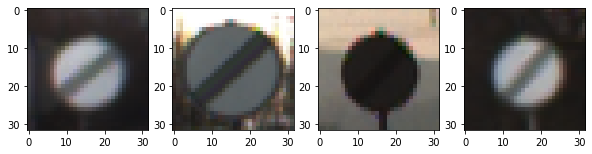

label n°:  33 	 Turn right ahead


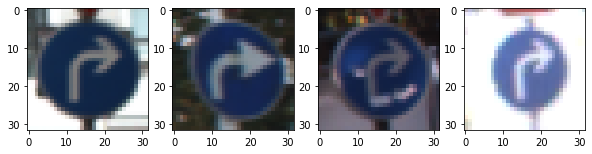

label n°:  34 	 Turn left ahead


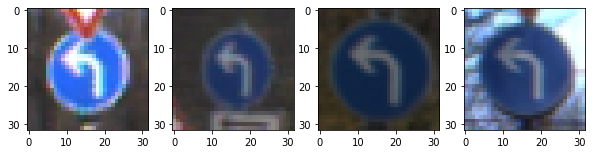

label n°:  35 	 Ahead only


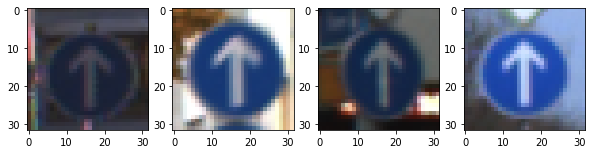

label n°:  36 	 Go straight or right


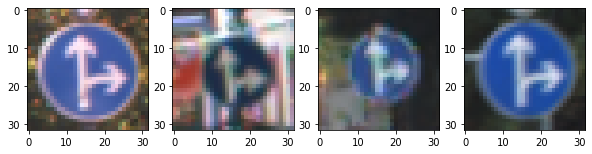

label n°:  37 	 Go straight or left


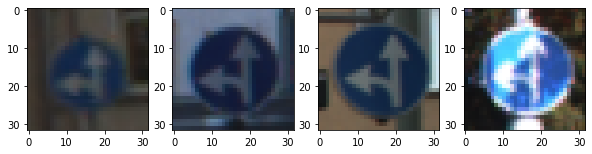

label n°:  38 	 Keep right


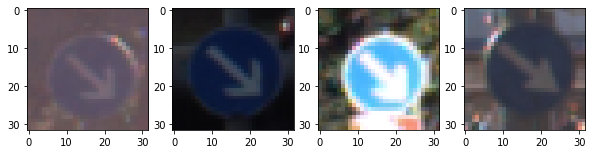

label n°:  39 	 Keep left


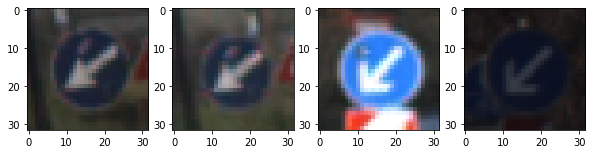

label n°:  40 	 Roundabout mandatory


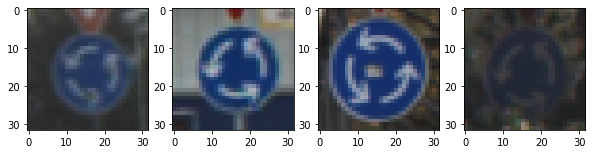

label n°:  41 	 End of no passing


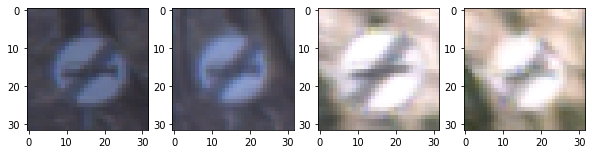

label n°:  42 	 End of no passing by vehicles over 3.5 metric tons


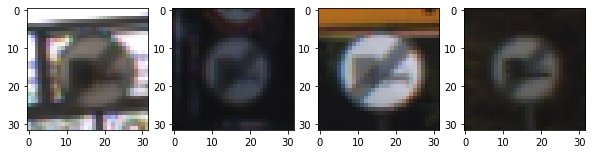

In [16]:
max_sample = 4
for label in range(len(labels)):
    pick_samples = 0
    list_sample = []
    while pick_samples < max_sample:
        n = random.choice(list_of_images_per_label[label])
        if n not in list_sample:
            list_sample.append(n)
            pick_samples += 1
    plot_samples(max_sample, label, list_sample)        

### The images are very inconsistent with very dark and some lighter samples. This will require normalization

## Look at a serie of 10 images for each class

label n°:  0 	 Speed limit (20km/h)


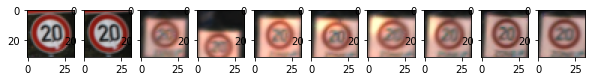

label n°:  1 	 Speed limit (30km/h)


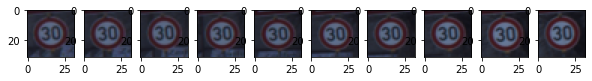

label n°:  2 	 Speed limit (50km/h)


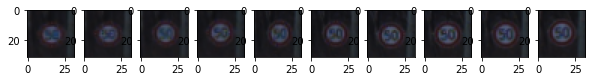

label n°:  3 	 Speed limit (60km/h)


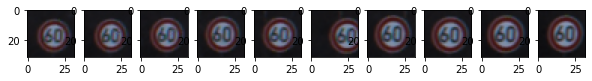

label n°:  4 	 Speed limit (70km/h)


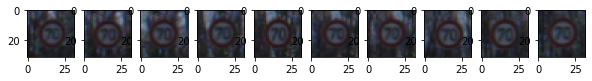

label n°:  5 	 Speed limit (80km/h)


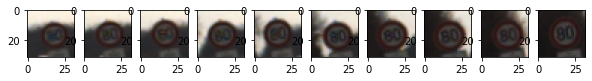

label n°:  6 	 End of speed limit (80km/h)


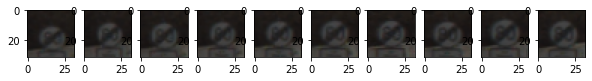

label n°:  7 	 Speed limit (100km/h)


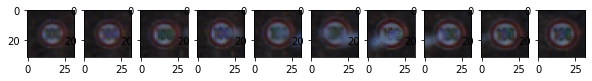

label n°:  8 	 Speed limit (120km/h)


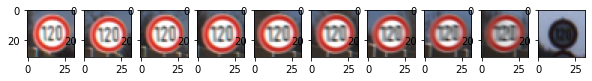

label n°:  9 	 No passing


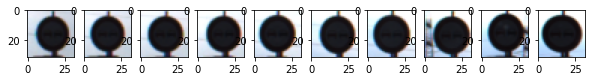

label n°:  10 	 No passing for vehicles over 3.5 metric tons


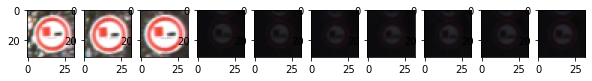

label n°:  11 	 Right-of-way at the next intersection


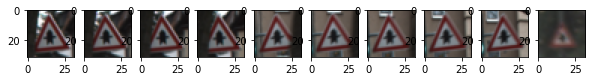

label n°:  12 	 Priority road


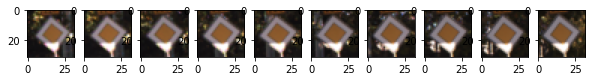

label n°:  13 	 Yield


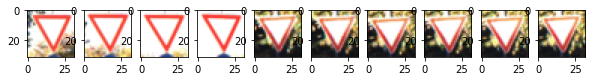

label n°:  14 	 Stop


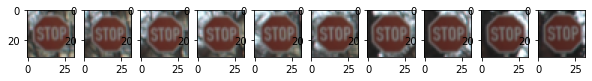

label n°:  15 	 No vehicles


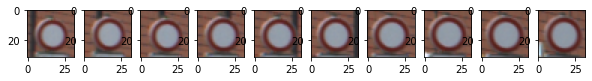

label n°:  16 	 Vehicles over 3.5 metric tons prohibited


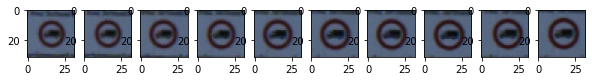

label n°:  17 	 No entry


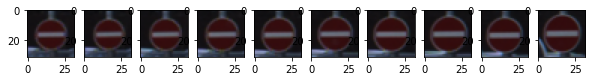

label n°:  18 	 General caution


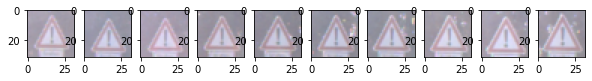

label n°:  19 	 Dangerous curve to the left


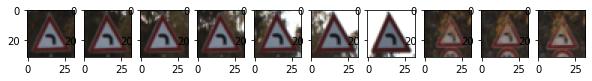

label n°:  20 	 Dangerous curve to the right


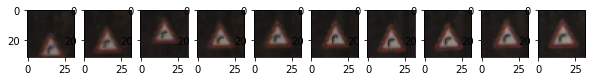

label n°:  21 	 Double curve


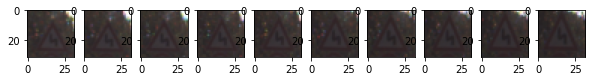

label n°:  22 	 Bumpy road


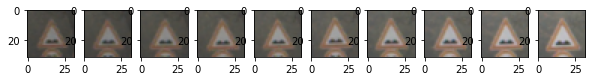

label n°:  23 	 Slippery road


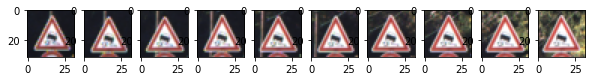

label n°:  24 	 Road narrows on the right


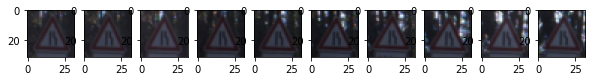

label n°:  25 	 Road work


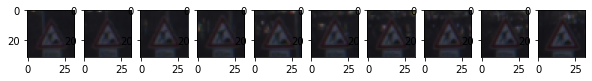

label n°:  26 	 Traffic signals


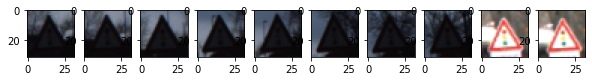

label n°:  27 	 Pedestrians


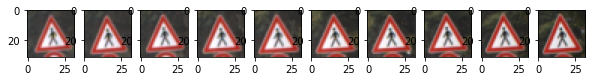

label n°:  28 	 Children crossing


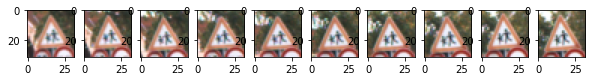

label n°:  29 	 Bicycles crossing


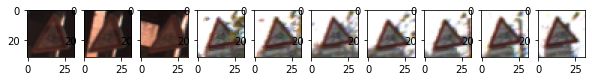

label n°:  30 	 Beware of ice/snow


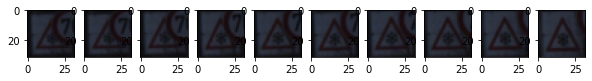

label n°:  31 	 Wild animals crossing


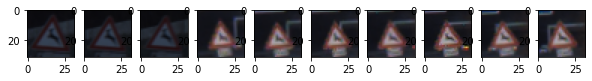

label n°:  32 	 End of all speed and passing limits


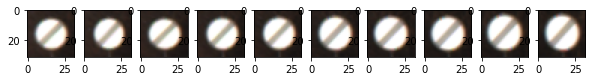

label n°:  33 	 Turn right ahead


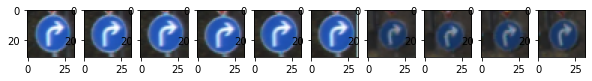

label n°:  34 	 Turn left ahead


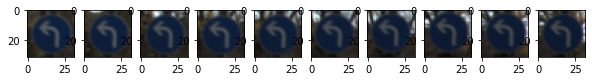

label n°:  35 	 Ahead only


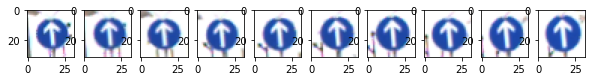

label n°:  36 	 Go straight or right


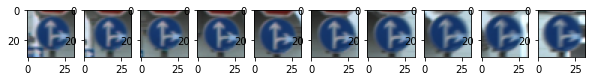

label n°:  37 	 Go straight or left


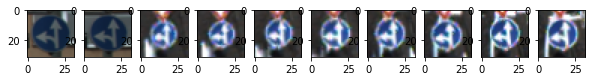

label n°:  38 	 Keep right


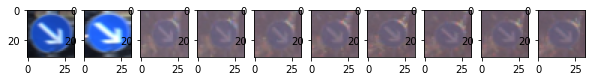

label n°:  39 	 Keep left


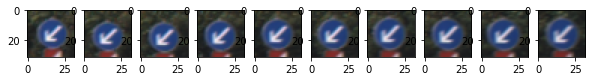

label n°:  40 	 Roundabout mandatory


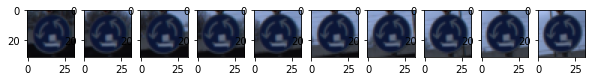

label n°:  41 	 End of no passing


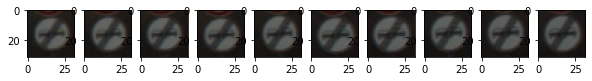

label n°:  42 	 End of no passing by vehicles over 3.5 metric tons


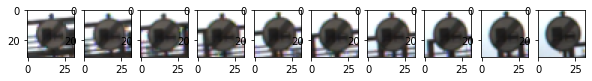

In [13]:
for label in range(n_classes):
    window = 10
    n = random.randint(0,len(list_of_images_per_label[label])-window)
    plot_samples(window, label, list_of_images_per_label[label][n:n+window])

## Dataset made of frames taken from video. This implies poor quality images (dark, bright, shaky, blurred) will also be repeated many times. This will require caution during data augmentation

# DATA AUGMENTATION

total number of images to be generated:  32581


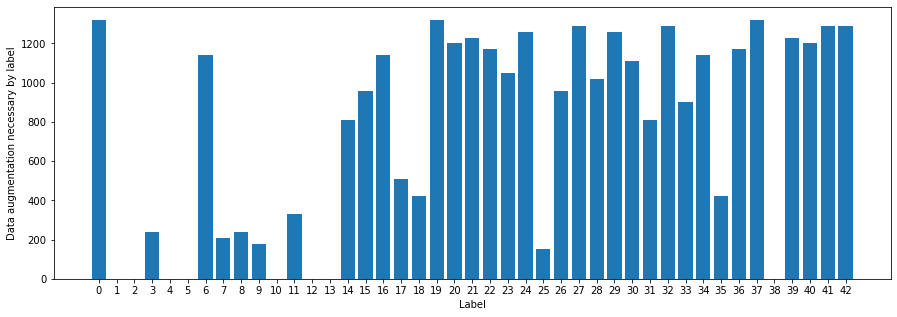

In [14]:
# Data augmentation requiered to fill gap to threshold to rebalance dataset
threshold = 1500  # max number of images per class
gaps = np.zeros(n_classes)
for indice in range(n_classes):
    if threshold - len(list_of_images_per_label[indice]) > 0:
        gaps[indice] = threshold - len(list_of_images_per_label[indice])

print("total number of images to be generated: ", int(sum(gaps)))
        
plt.figure(figsize=(15,5))
plt.bar(x=range(n_classes), height=gaps, align='center', tick_label = range(n_classes))
plt.xticks(range(n_classes))
plt.xlabel('Label')
plt.ylabel('Data augmentation necessary by label')
plt.show()

## Suggested transformation

In [15]:
FlipV = [15,17,40] # invariant to vertical flip

In [16]:
def flip_Vertically(image):
    img = np.flipud(image)
    return img

In [17]:
flipH = [11,12,13,15, 17,18,19, 20, 22, 26,30,33,34,35,36,37,38,39] # invariant to Horizontal flip (or becomes opposite label)
flipH_to = {'11': 11,'12':12,'13':13,'15':15, '17':17,'18':18,'19':20, '20':19, '22':22, '26':26,
                 '30':30,'33':34,'34':33,'35':35,'36':37,'37':36,'38':39,'39':38}   # corresponding label after H flip

In [18]:
def flip_Horizontally(image):
    img = np.fliplr(image)
    return img

In [19]:
rotate = [15,40]  # invariant to rotations

In [20]:
# random crop to reduce black areas on the borders
def crop_image(img):
    rows, cols, _ = img.shape
    min_pixels = 1  # crop by 1 pixel minimum on each border
    max_pixels = 2   # crop by 2 pixels maximum on each border
    pixels = random.randint(0, max_pixels-min_pixels)
    cropped_img = img[min_pixels+pixels : rows-(min_pixels+pixels), min_pixels+pixels : cols-(min_pixels+pixels)]
    img = cv2.resize(cropped_img, (rows, cols))  # resize to 32x32
    return img

In [21]:
# source: https://github.com/vxy10/ImageAugmentation

def transform_image(img, ang_range, trans_range, brightness=0):   # excluded from function : shear_range,
    '''
    This function transforms images to generate new images.
    The function takes in following arguments,
    1- Image
    2- ang_range: Range of angles for rotation
    3- shear_range: Range of values to apply affine transform to (déformation latérale)
    4- trans_range: Range of values to apply translations over.

    A Random uniform distribution is used to generate different parameters for transformation
    
    call using : "img = transform_image(image, 20, 5, brightness=0)"    # shear parameter excluded: 10, 

    '''
    # Rotation
    ang_rot = np.random.uniform(ang_range)-ang_range/2
    rows,cols,ch = img.shape    
    Rot_M = cv2.getRotationMatrix2D((cols/2,rows/2),ang_rot,1)

    # Translation
    tr_x = trans_range*np.random.uniform()-trans_range/2
    tr_y = trans_range*np.random.uniform()-trans_range/2
    Trans_M = np.float32([[1,0,tr_x],[0,1,tr_y]])

    # Shear
    #pts1 = np.float32([[5,5],[20,5],[5,20]])
    #pt1 = 5+shear_range*np.random.uniform()-shear_range/2
    #pt2 = 20+shear_range*np.random.uniform()-shear_range/2
    #pts2 = np.float32([[pt1,5],[pt2,pt1],[5,pt2]])
    #shear_M = cv2.getAffineTransform(pts1,pts2)

    # Apply transformations
    img = cv2.warpAffine(img,Rot_M,(cols,rows))
    img = cv2.warpAffine(img,Trans_M,(cols,rows))
    #img = cv2.warpAffine(img,shear_M,(cols,rows))
    
    # random crop to reduce black areas generated by rotation on all sides
    img = crop_image(img)
    
    # Brightness                                             # keep brightness to 0
    if brightness == 1:
        img = augment_brightness_camera_images(img)

    return img

## Start Data Augmentation to rebalance dataset
- perform horizontal flip on classes invariant or flip to the opposite sign (ie turn left to turn right!)
- perform vertical flip for the few classes invariant
- perform rotation up to 90° on the few classes fully invariant to rotation
- complement augmentation to reach threshold of 1500 par class by combining small rotation & translation

In [22]:
X_train_augmented = X_train
y_train_augmented = y_train

100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:03<00:00,  4.52it/s]


 total HFlip augmentation generated:  6644


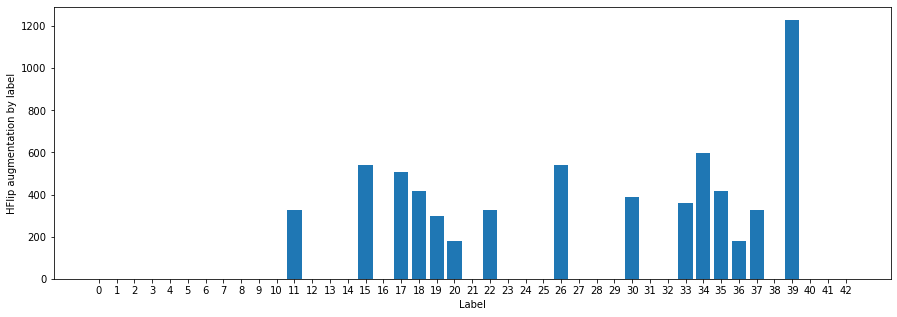

In [23]:
from tqdm import tqdm

# Horizontal flip Augmentation
 
for label_to_flip in tqdm(flipH):
    
    X_current = X_train_augmented
    y_current = y_train_augmented
    
    target_label = flipH_to[str(label_to_flip)]
    
    if len(list_of_images_per_label[target_label]) < threshold:
    
        max_to_close = threshold - len(list_of_images_per_label[target_label])
        
        max_augmentation = min(max_to_close, len(list_of_images_per_label[label_to_flip]))
        
        indices = random.choices(list_of_images_per_label[label_to_flip], k=max_augmentation)
        
        new_imgs = np.zeros((max_augmentation, 32,32,3), dtype='uint8')
        
        new_labels = np.zeros(max_augmentation, dtype='uint8')
        
        for index, indice in enumerate(indices):
                        
            new_image = flip_Horizontally(X_train[indice])
            new_imgs[index] = new_image
            new_labels[index] = target_label
        
        
        # Update tracking metrics
        X_train_augmented = np.concatenate((X_current, new_imgs[:index,:,:,:]), axis=0)
        y_train_augmented = np.concatenate((y_current, new_labels[:index]), axis=0)
        
        labels = np.unique(y_train_augmented)
        list_of_images_per_label_augmented = []
        for label in sorted(labels):
            list_of_images_per_label_augmented.append([x for x in range(0, len(X_train_augmented)) 
                                                       if y_train_augmented[x] == label])

# print augmentation step statistics
generated= np.zeros(n_classes)
for indice in range(n_classes):
    generated[indice] = len(list_of_images_per_label_augmented[indice]) - len(list_of_images_per_label[indice])

print(' total HFlip augmentation generated: ', int(sum(generated)))

plt.figure(figsize=(15,5))
plt.bar(x=range(n_classes), height=generated, align='center', tick_label = range(n_classes))
plt.xticks(range(n_classes))
plt.xlabel('Label')
plt.ylabel('HFlip augmentation by label')
plt.show()

# to track next augmentation steps
list_of_images_per_label_augmented_HFlip = list_of_images_per_label_augmented

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  3.44it/s]


 total VFlip augmentation generated:  719


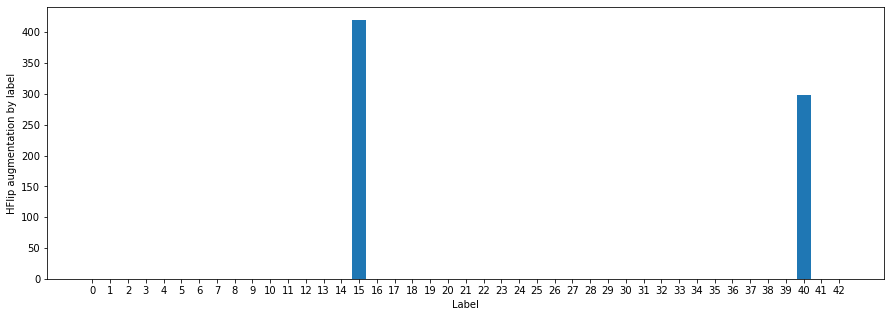

In [24]:
# Vertical Flip Augmentation
 
for label_to_flip in tqdm(FlipV):
    
    X_current = X_train_augmented
    y_current = y_train_augmented
    
    if len(list_of_images_per_label_augmented[label_to_flip]) < threshold:
        
        max_to_close = threshold - len(list_of_images_per_label_augmented[label_to_flip])
        
        max_augmentation = min(max_to_close, len(list_of_images_per_label_augmented[label_to_flip]))
        
        indices = random.choices(list_of_images_per_label_augmented[label_to_flip], k=max_augmentation)
        
        new_imgs = np.zeros((max_augmentation, 32,32,3), dtype='uint8')
        
        new_labels = np.zeros(max_augmentation, dtype='uint8')
        
        for index, indice in enumerate(indices):
                        
            new_image = flip_Vertically(X_train_augmented[indice])
            new_imgs[index] = new_image
            new_labels[index] = label_to_flip
        
        # Update tracking metrics
        X_train_augmented = np.concatenate((X_current, new_imgs[:index,:,:,:]), axis=0)
        y_train_augmented = np.concatenate((y_current, new_labels[:index]), axis=0)
        
        labels = np.unique(y_train_augmented)
        list_of_images_per_label_augmented = []
        for label in sorted(labels):
            list_of_images_per_label_augmented.append([x for x in range(0, len(X_train_augmented)) 
                                                       if y_train_augmented[x] == label])

# print augmentation step statistics
generated= np.zeros(n_classes)
for indice in range(n_classes):
    generated[indice] = len(list_of_images_per_label_augmented[indice]) - len(list_of_images_per_label_augmented_HFlip[indice])

print(' total VFlip augmentation generated: ', int(sum(generated)))

plt.figure(figsize=(15,5))
plt.bar(x=range(n_classes), height=generated, align='center', tick_label = range(n_classes))
plt.xticks(range(n_classes))
plt.xlabel('Label')
plt.ylabel('HFlip augmentation by label')
plt.show()

# to track next augmentation steps
list_of_images_per_label_augmented_VFlip = list_of_images_per_label_augmented

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  3.04it/s]

 total Rotation 90° augmentation generated:  902


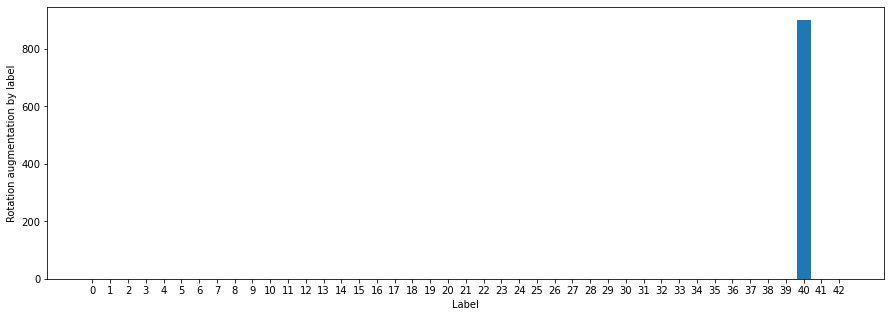

In [25]:
import cv2

# Full Rotation invariance Augmentation
 
for label_to_flip in tqdm(rotate):
    
    X_current = X_train_augmented
    y_current = y_train_augmented
    
    if len(list_of_images_per_label_augmented[label_to_flip]) < threshold:
        
        max_augmentation = threshold - len(list_of_images_per_label_augmented[label_to_flip])
        new_imgs = np.zeros((max_augmentation, 32,32,3), dtype='uint8')
        new_labels = np.zeros(max_augmentation, dtype='uint8')
        index = 0
        
        while index < max_augmentation:
            
            position = index % len(list_of_images_per_label_augmented[label_to_flip])
            
            index_img_to_augment = list_of_images_per_label_augmented[label_to_flip][position]
            new_image = transform_image(X_train_augmented[index_img_to_augment], ang_range = 90, trans_range = 3, brightness=0)
            new_imge = crop_image(new_image)
            
            new_imgs[index] = new_image
            new_labels[index] = label_to_flip

            index+=1
        
        # Update tracking metrics
        X_train_augmented = np.concatenate((X_current, new_imgs[:index,:,:,:]), axis=0)
        y_train_augmented = np.concatenate((y_current, new_labels[:index]), axis=0)
        
        labels = np.unique(y_train_augmented)
        list_of_images_per_label_augmented = []
        for label in sorted(labels):
            list_of_images_per_label_augmented.append([x for x in range(0, len(X_train_augmented)) 
                                                       if y_train_augmented[x] == label])

# print augmentation step statistics
generated= np.zeros(n_classes)
for indice in range(n_classes):
    generated[indice] = len(list_of_images_per_label_augmented[indice]) - len(list_of_images_per_label_augmented_VFlip[indice])

print(' total Rotation 90° augmentation generated: ', int(sum(generated)))

plt.figure(figsize=(15,5))
plt.bar(x=range(n_classes), height=generated, align='center', tick_label = range(n_classes))
plt.xticks(range(n_classes))
plt.xlabel('Label')
plt.ylabel('Rotation augmentation by label')
plt.show()

# to track next augmentation steps
list_of_images_per_label_augmented_rotation = list_of_images_per_label_augmented

  0%|                                                                                           | 0/43 [00:00<?, ?it/s]

total number of images remaining to be generated:  24316


100%|██████████████████████████████████████████████████████████████████████████████████| 43/43 [00:13<00:00,  3.13it/s]


 total final augmentation generated:  24316


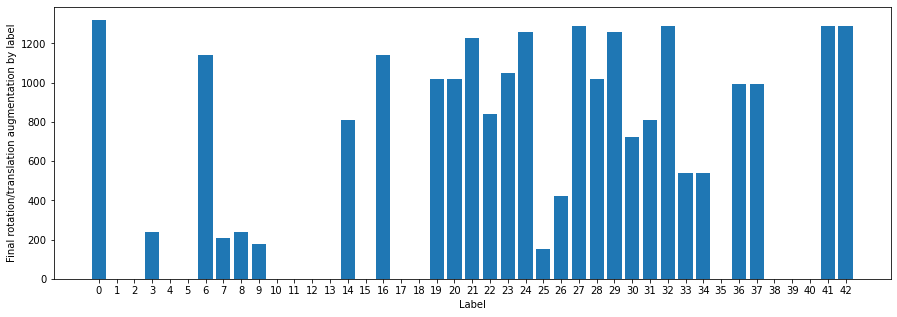

In [26]:
# Complement missing Augmentation with small rotation and small x/y translation

gaps_to_close = np.zeros(n_classes)
for indice in range(n_classes):
    if threshold - len(list_of_images_per_label_augmented[indice]) > 0:
        gaps_to_close[indice] = threshold - len(list_of_images_per_label_augmented[indice])

print("total number of images remaining to be generated: ", int(sum(gaps_to_close)))

 
for label_to_augment, gap_to_close in enumerate(tqdm(gaps_to_close)):
    
    X_current = X_train_augmented
    y_current = y_train_augmented
    
    if gap_to_close > 0:
        
        new_imgs = np.zeros((int(gap_to_close), 32,32,3), dtype='uint8')
        new_labels = np.zeros(int(gap_to_close), dtype='uint8')
        index = 0
        
        while index < gap_to_close:
            
            position = index % len(list_of_images_per_label_augmented[label_to_augment])
            
            index_img_to_augment = list_of_images_per_label_augmented[label_to_augment][position]
            new_image = transform_image(X_train_augmented[index_img_to_augment], ang_range = 15, trans_range = 3, brightness=0)
            new_imge = crop_image(new_image)
            
            new_imgs[index] = new_image
            new_labels[index] = label_to_augment

            index+=1
        
        
        # Update tracking metrics
        X_train_augmented = np.concatenate((X_current, new_imgs[:index,:,:,:]), axis=0)
        y_train_augmented = np.concatenate((y_current, new_labels[:index]), axis=0)
        
        labels = np.unique(y_train_augmented)
        list_of_images_per_label_augmented = []
        for label in sorted(labels):
            list_of_images_per_label_augmented.append([x for x in range(0, len(X_train_augmented)) 
                                                       if y_train_augmented[x] == label])

# print augmentation step statistics
generated= np.zeros(n_classes)
for indice in range(n_classes):
    generated[indice] = len(list_of_images_per_label_augmented[indice]) - len(list_of_images_per_label_augmented_rotation[indice])

print(' total final augmentation generated: ', int(sum(generated)))

plt.figure(figsize=(15,5))
plt.bar(x=range(n_classes), height=generated, align='center', tick_label = range(n_classes))
plt.xticks(range(n_classes))
plt.xlabel('Label')
plt.ylabel('Final rotation/translation augmentation by label')
plt.show()

In [27]:
count_augmented=np.zeros((len(np.unique(y_train_augmented))))

for c in np.unique(y_train_augmented):
    count_augmented[int(c)]=sum(p==c for p in y_train_augmented)

for i in range(len(count_augmented)):
    print('Class n°{} \ttotal number of samples = {}\t percentage dataset: {:.1f} %'.format(i, int(count_augmented[i]), (100*int(count_augmented[i])/len(y_train_augmented))))

Class n°0 	total number of samples = 1500	 percentage dataset: 2.2 %
Class n°1 	total number of samples = 1980	 percentage dataset: 2.9 %
Class n°2 	total number of samples = 2010	 percentage dataset: 3.0 %
Class n°3 	total number of samples = 1500	 percentage dataset: 2.2 %
Class n°4 	total number of samples = 1770	 percentage dataset: 2.6 %
Class n°5 	total number of samples = 1650	 percentage dataset: 2.4 %
Class n°6 	total number of samples = 1500	 percentage dataset: 2.2 %
Class n°7 	total number of samples = 1500	 percentage dataset: 2.2 %
Class n°8 	total number of samples = 1500	 percentage dataset: 2.2 %
Class n°9 	total number of samples = 1500	 percentage dataset: 2.2 %
Class n°10 	total number of samples = 1800	 percentage dataset: 2.7 %
Class n°11 	total number of samples = 1500	 percentage dataset: 2.2 %
Class n°12 	total number of samples = 1890	 percentage dataset: 2.8 %
Class n°13 	total number of samples = 1920	 percentage dataset: 2.8 %
Class n°14 	total number of sa

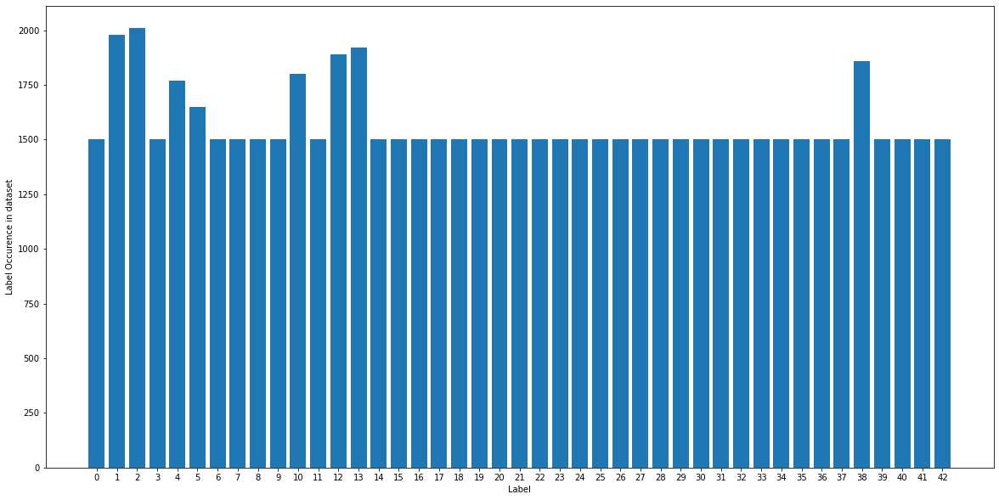

In [28]:
plt.figure(figsize=(20,10))
plt.bar(x=range(n_classes), height=count_augmented, align='center', tick_label = range(n_classes))
plt.xticks(range(n_classes))
plt.xlabel('Label')
plt.ylabel('Label Occurence in dataset')
plt.savefig('post-augmentation.png')
plt.show()

# Distribution of classes is now rebalanced which will help training

In [29]:
# Visualize samples of the augmented dataset
def plot_samples(max_sample, label, samples):
    plt.figure(figsize=(10,5))
    count = 1
    title = sign_names.iloc[label,1]
    print('label n°: ', label,'\t', title)
    for sample in samples:
        plt.subplot(1, max_sample, count)
        plt.imshow(np.array(X_train_augmented[sample], dtype='uint8'))
        count +=1
    plt.show()

label n°:  0 	 Speed limit (20km/h)


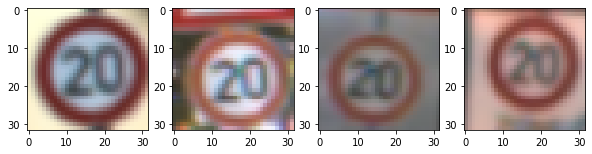

label n°:  1 	 Speed limit (30km/h)


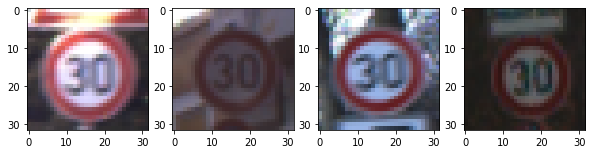

label n°:  2 	 Speed limit (50km/h)


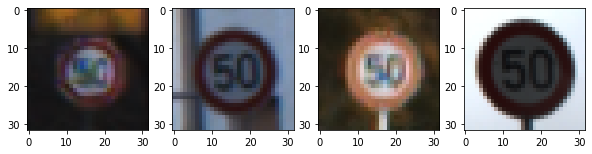

label n°:  3 	 Speed limit (60km/h)


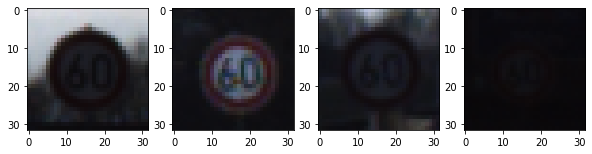

label n°:  4 	 Speed limit (70km/h)


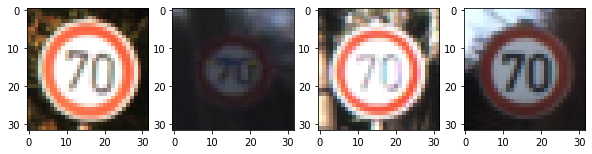

label n°:  5 	 Speed limit (80km/h)


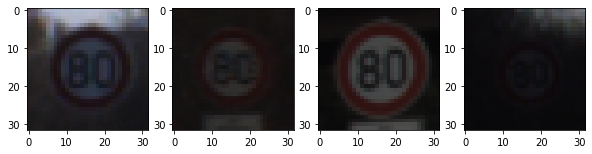

label n°:  6 	 End of speed limit (80km/h)


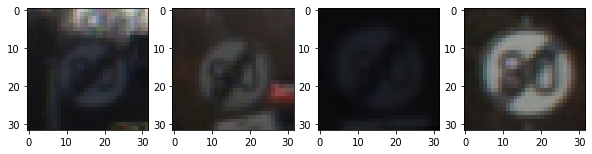

label n°:  7 	 Speed limit (100km/h)


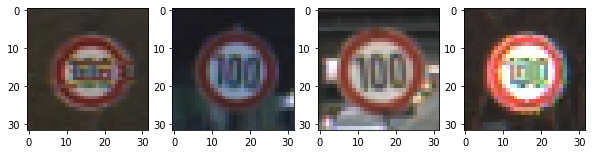

label n°:  8 	 Speed limit (120km/h)


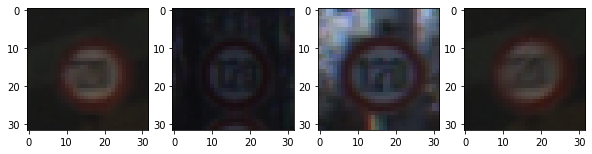

label n°:  9 	 No passing


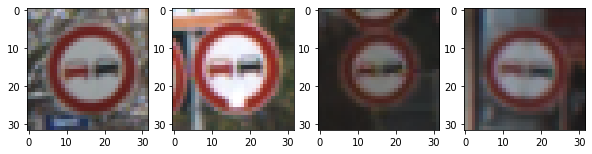

label n°:  10 	 No passing for vehicles over 3.5 metric tons


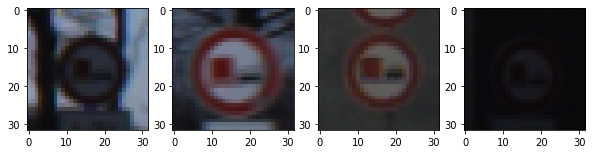

label n°:  11 	 Right-of-way at the next intersection


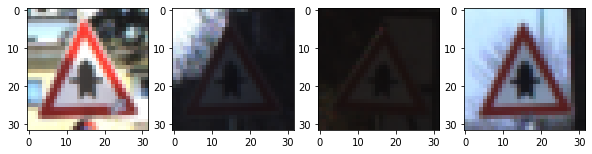

label n°:  12 	 Priority road


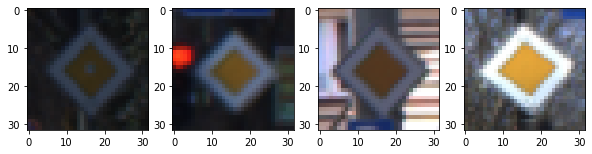

label n°:  13 	 Yield


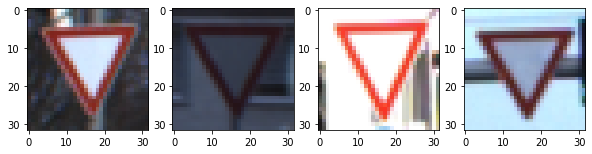

label n°:  14 	 Stop


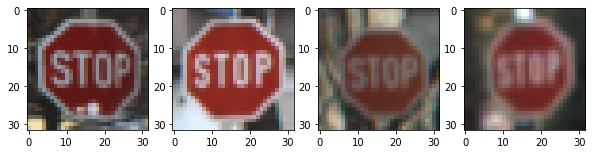

label n°:  15 	 No vehicles


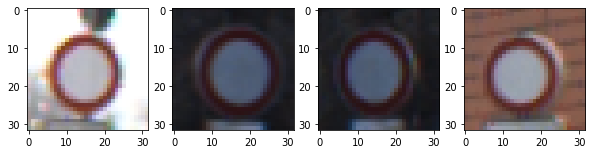

label n°:  16 	 Vehicles over 3.5 metric tons prohibited


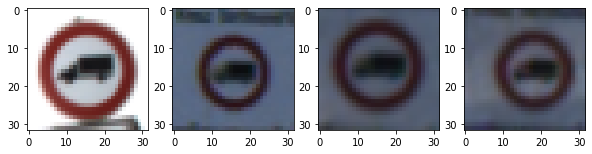

label n°:  17 	 No entry


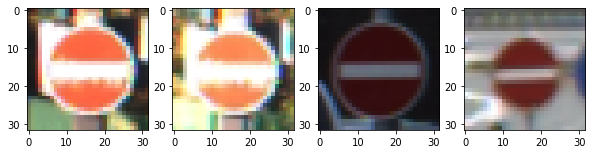

label n°:  18 	 General caution


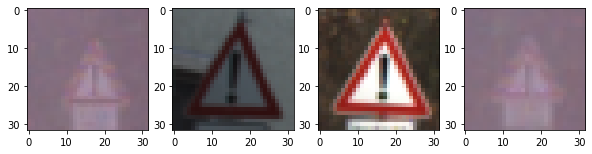

label n°:  19 	 Dangerous curve to the left


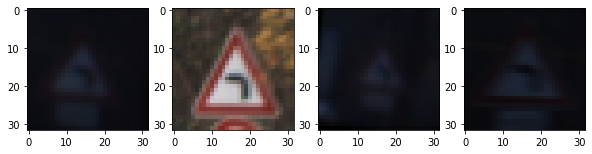

label n°:  20 	 Dangerous curve to the right


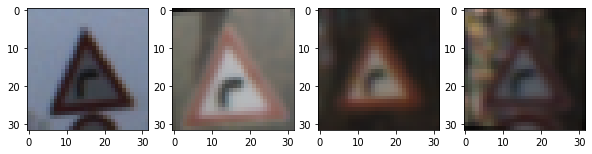

label n°:  21 	 Double curve


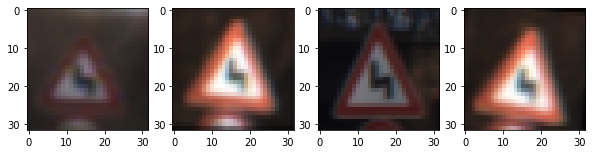

label n°:  22 	 Bumpy road


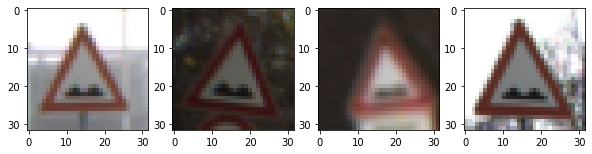

label n°:  23 	 Slippery road


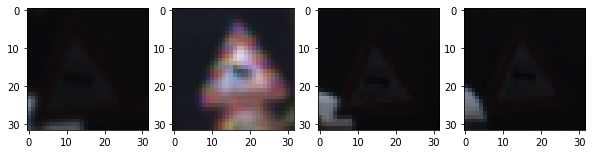

label n°:  24 	 Road narrows on the right


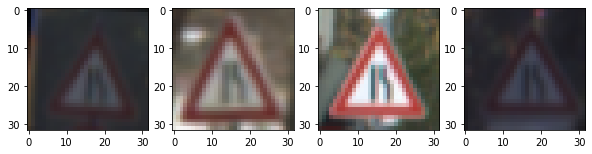

label n°:  25 	 Road work


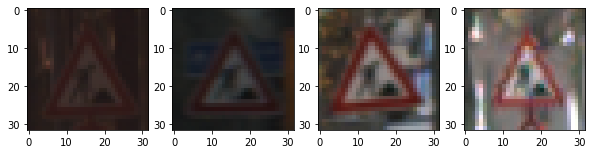

label n°:  26 	 Traffic signals


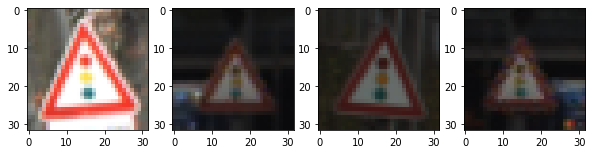

label n°:  27 	 Pedestrians


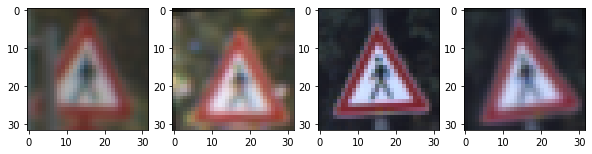

label n°:  28 	 Children crossing


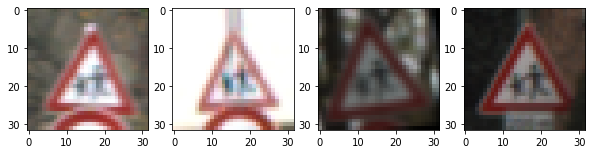

label n°:  29 	 Bicycles crossing


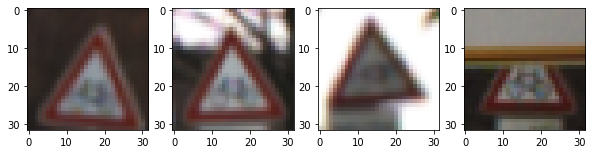

label n°:  30 	 Beware of ice/snow


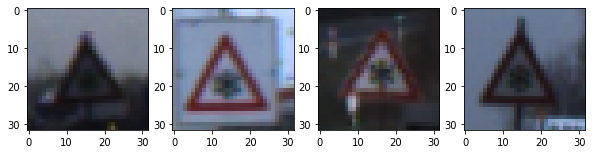

label n°:  31 	 Wild animals crossing


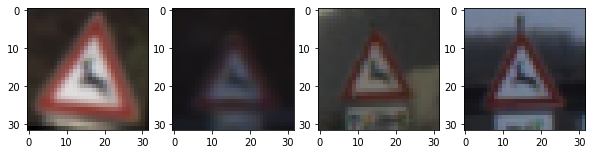

label n°:  32 	 End of all speed and passing limits


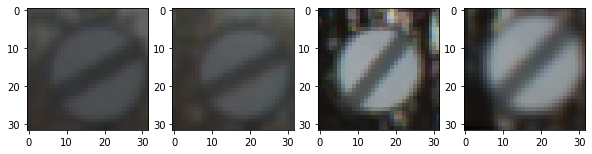

label n°:  33 	 Turn right ahead


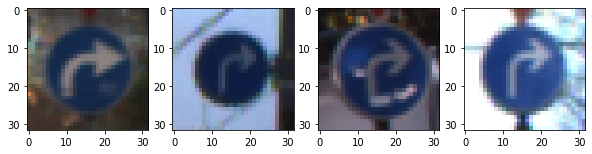

label n°:  34 	 Turn left ahead


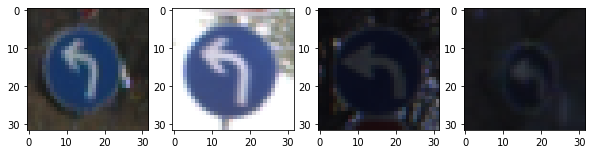

label n°:  35 	 Ahead only


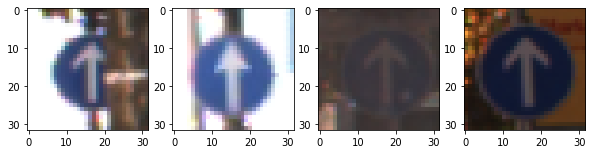

label n°:  36 	 Go straight or right


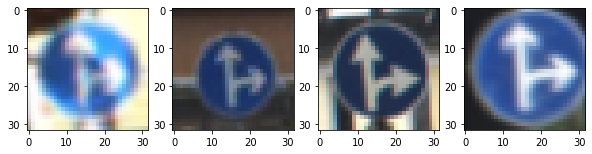

label n°:  37 	 Go straight or left


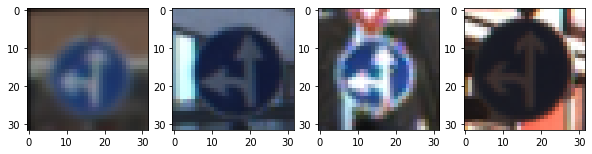

label n°:  38 	 Keep right


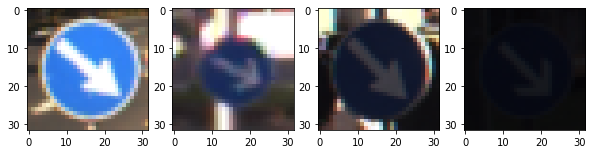

label n°:  39 	 Keep left


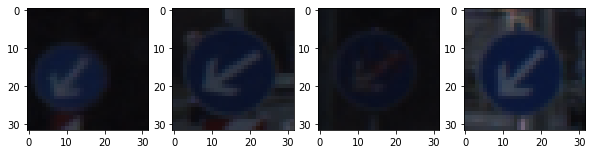

label n°:  40 	 Roundabout mandatory


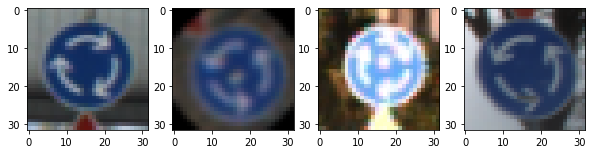

label n°:  41 	 End of no passing


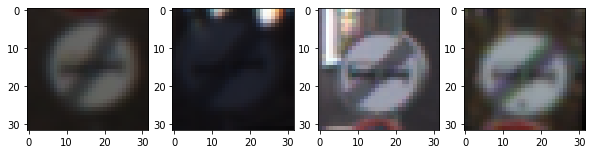

label n°:  42 	 End of no passing by vehicles over 3.5 metric tons


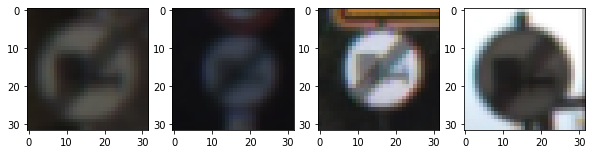

In [34]:
max_sample = 4
for label in range(n_classes):
    pick_samples = 0
    list_sample = []
    while pick_samples < max_sample:
        n = random.choice(list_of_images_per_label_augmented[label])
        if n not in list_sample:
            list_sample.append(n)
            pick_samples += 1
    plot_samples(max_sample, label, list_sample)   

# Save augmented dataset to disk

In [30]:
from numpy import save
# save as npy file
save('X_train_augmented.npy', X_train_augmented)
save('y_train_augmented.npy', y_train_augmented)

In [ ]:
from numpy import load
# load array
X_train_augmented = load('X_train_augmented.npy')
y_train_augmented = load('y_train_augmented.npy')

# NORMALIZATION STEP
-  We saw that some images are very dark . We will perform histogram equalization and use it to improve the contrast of our images. Consider a brighter image, it will have all pixels confined to high values. But a good image will have pixels from all regions of the image. So you need to stretch this histogram to either ends of the histogram and that is what Histogram Equalization does (in simple words). This normally improves the contrast of the image. For that, we need a transformation function which maps the input pixels in brighter region to output pixels in full region. That is what histogram equalization does. if the image was a darker image, after equalization we will get almost the same image as when starting with a brighter one. As a result, this is used as a "reference tool" to make all images with same lighting conditions.
- OpenCV has a function to do this, cv.equalizeHist(). Its input is just grayscale image and output is our histogram equalized image. Adaptive histogram equalization is used. In this, image is divided into small blocks called "tiles" and equalization is performed locally. CLAHE (Contrast Limited Adaptive Histogram Equalization)

## Test of color spaces seeking solution for very dark images

In [31]:
def to_YUV(img):
    img_YUV = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    return img_YUV

In [32]:
def to_LAB(img):
    img_LAB = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    return img_LAB

In [33]:
def to_HLS(img):
    img_HLS = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    return img_HLS

In [34]:
def to_HSV(img):
    img_HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    return img_HSV

In [35]:
def plot_img_samples(max_sample, label, samples):
    plt.figure(figsize=(10,5))
    count = 1
    title = sign_names.iloc[label,1]
    print('label n°: ', label,'\t', title)
    for sample in samples:
        plt.subplot(1, max_sample, count)
        plt.imshow(sample, cmap='gray')
        count +=1
    plt.show()

label n°:  0 	 Speed limit (20km/h)


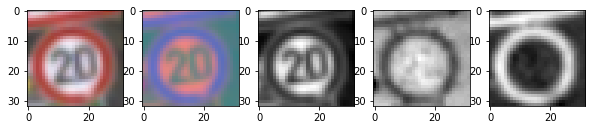

label n°:  1 	 Speed limit (30km/h)


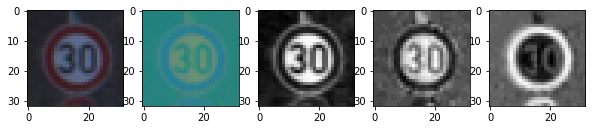

label n°:  2 	 Speed limit (50km/h)


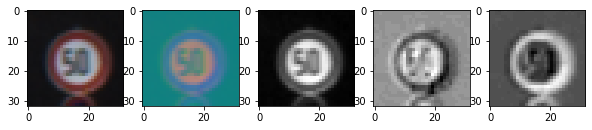

label n°:  3 	 Speed limit (60km/h)


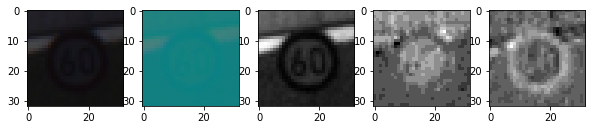

label n°:  4 	 Speed limit (70km/h)


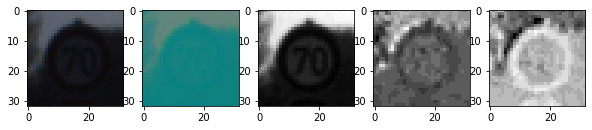

label n°:  5 	 Speed limit (80km/h)


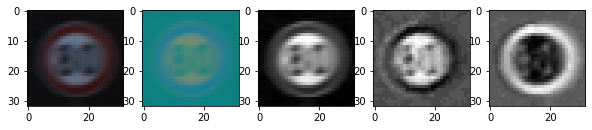

label n°:  6 	 End of speed limit (80km/h)


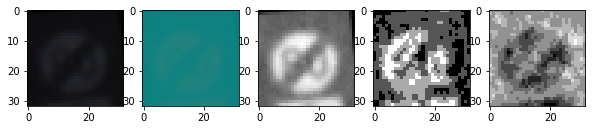

label n°:  7 	 Speed limit (100km/h)


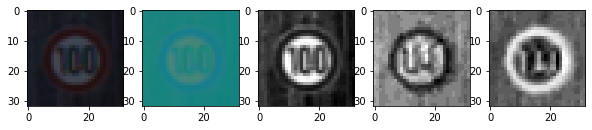

label n°:  8 	 Speed limit (120km/h)


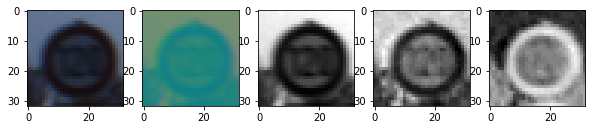

label n°:  9 	 No passing


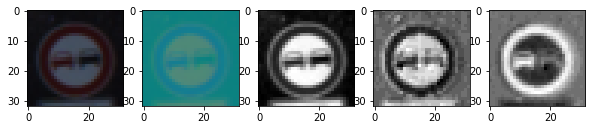

label n°:  10 	 No passing for vehicles over 3.5 metric tons


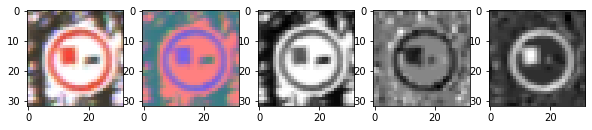

label n°:  11 	 Right-of-way at the next intersection


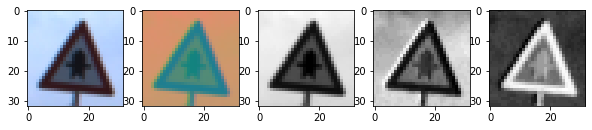

label n°:  12 	 Priority road


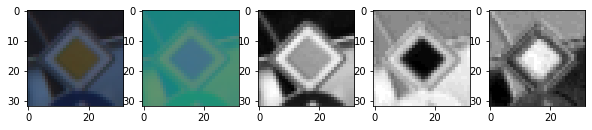

label n°:  13 	 Yield


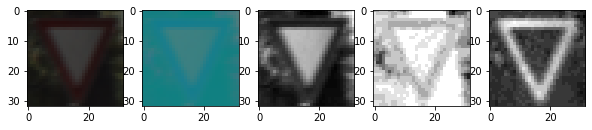

label n°:  14 	 Stop


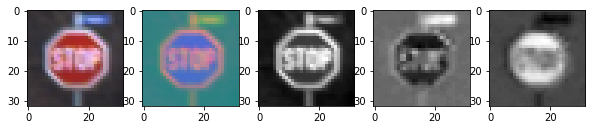

label n°:  15 	 No vehicles


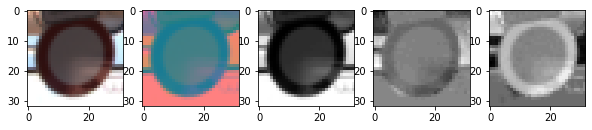

label n°:  16 	 Vehicles over 3.5 metric tons prohibited


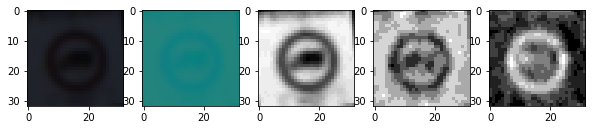

label n°:  17 	 No entry


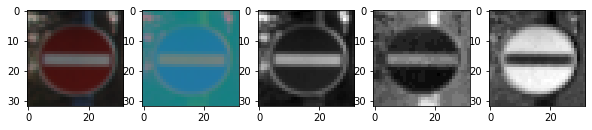

label n°:  18 	 General caution


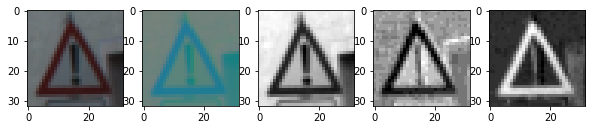

label n°:  19 	 Dangerous curve to the left


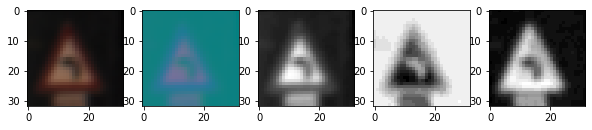

label n°:  20 	 Dangerous curve to the right


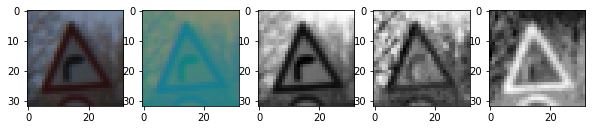

label n°:  21 	 Double curve


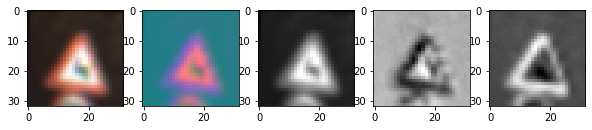

label n°:  22 	 Bumpy road


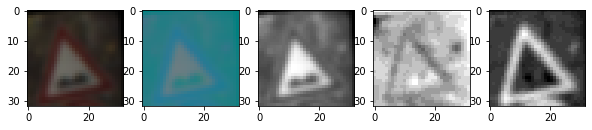

label n°:  23 	 Slippery road


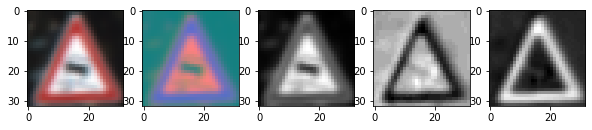

label n°:  24 	 Road narrows on the right


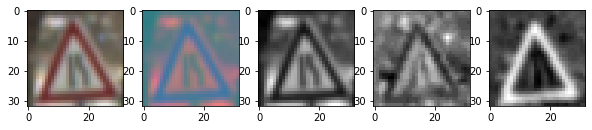

label n°:  25 	 Road work


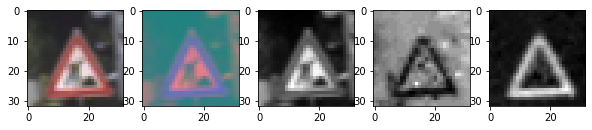

label n°:  26 	 Traffic signals


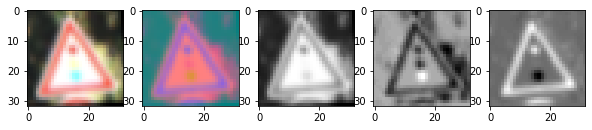

label n°:  27 	 Pedestrians


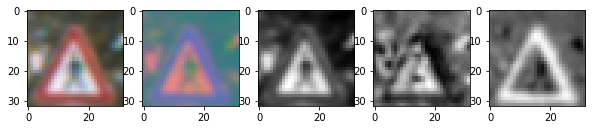

label n°:  28 	 Children crossing


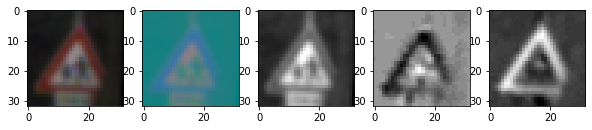

label n°:  29 	 Bicycles crossing


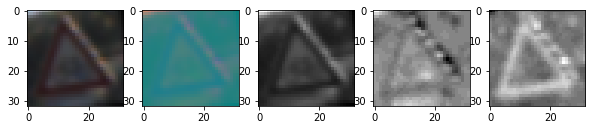

label n°:  30 	 Beware of ice/snow


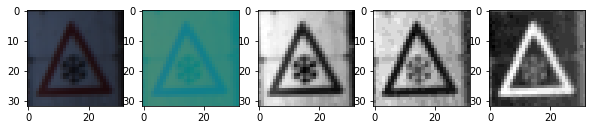

label n°:  31 	 Wild animals crossing


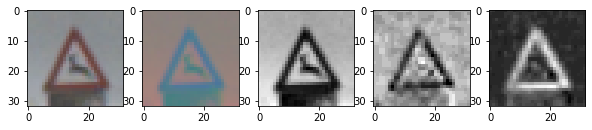

label n°:  32 	 End of all speed and passing limits


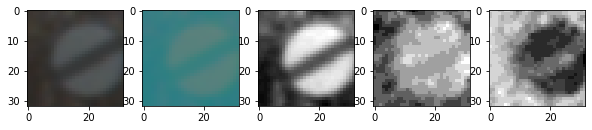

label n°:  33 	 Turn right ahead


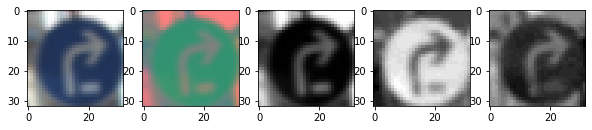

label n°:  34 	 Turn left ahead


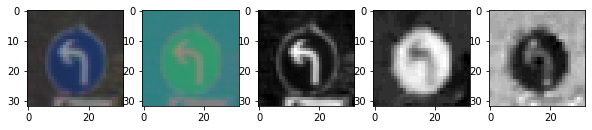

label n°:  35 	 Ahead only


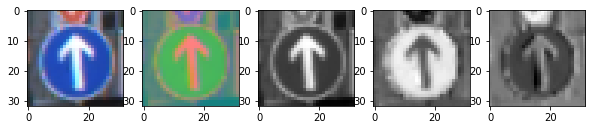

label n°:  36 	 Go straight or right


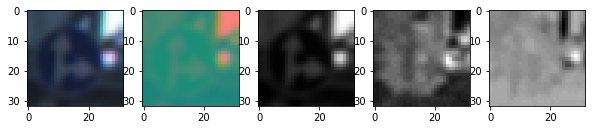

label n°:  37 	 Go straight or left


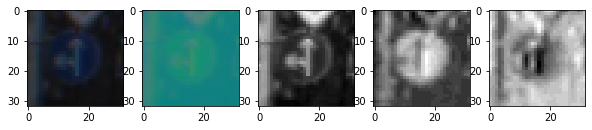

label n°:  38 	 Keep right


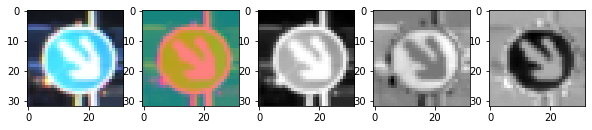

label n°:  39 	 Keep left


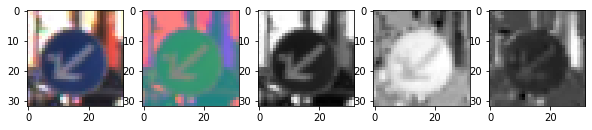

label n°:  40 	 Roundabout mandatory


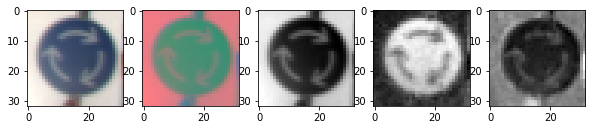

label n°:  41 	 End of no passing


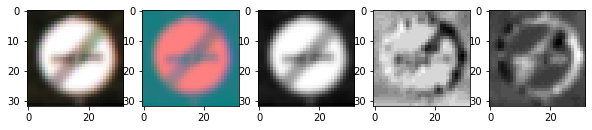

label n°:  42 	 End of no passing by vehicles over 3.5 metric tons


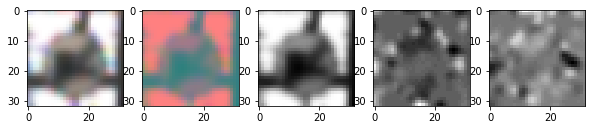

In [36]:
# Test YUV color space
window = 5
for label in range(n_classes):
    n = random.choice(list_of_images_per_label_augmented[label])
    sample = X_train_augmented[n]
    YUV_sample = to_YUV(sample)
    samples = [sample, YUV_sample, YUV_sample[:,:,0], YUV_sample[:,:,1], YUV_sample[:,:,2]]
    plot_img_samples(window, label, samples)

label n°:  0 	 Speed limit (20km/h)


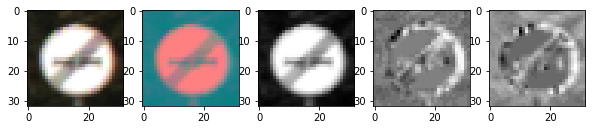

label n°:  1 	 Speed limit (30km/h)


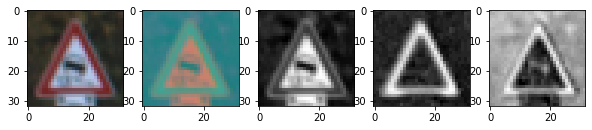

label n°:  2 	 Speed limit (50km/h)


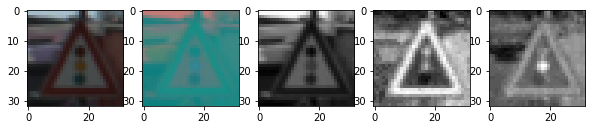

label n°:  3 	 Speed limit (60km/h)


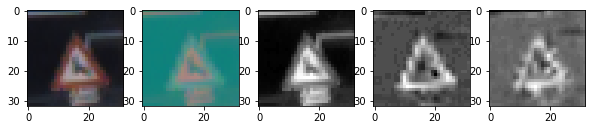

label n°:  4 	 Speed limit (70km/h)


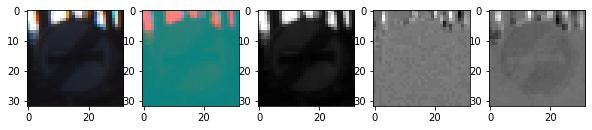

label n°:  5 	 Speed limit (80km/h)


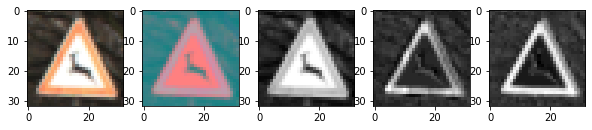

label n°:  6 	 End of speed limit (80km/h)


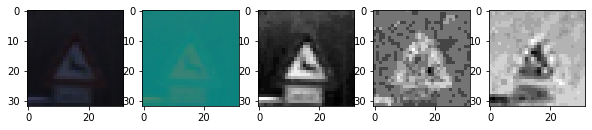

label n°:  7 	 Speed limit (100km/h)


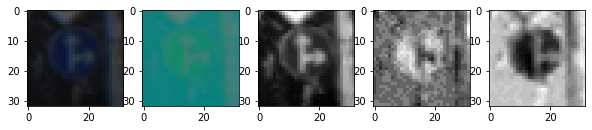

label n°:  8 	 Speed limit (120km/h)


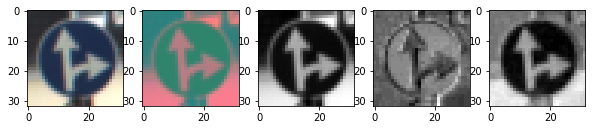

label n°:  9 	 No passing


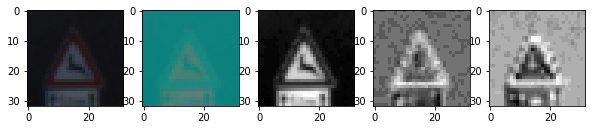

label n°:  10 	 No passing for vehicles over 3.5 metric tons


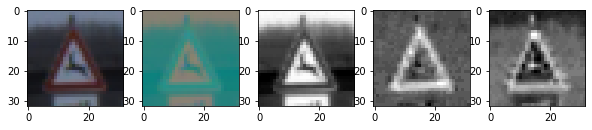

label n°:  11 	 Right-of-way at the next intersection


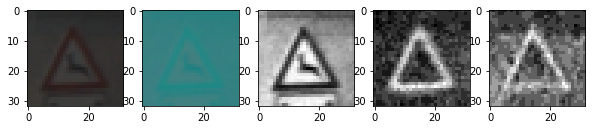

label n°:  12 	 Priority road


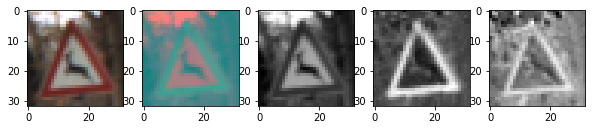

label n°:  13 	 Yield


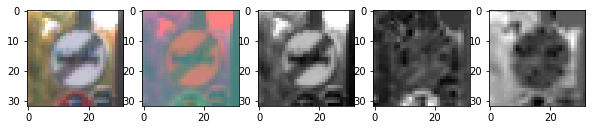

label n°:  14 	 Stop


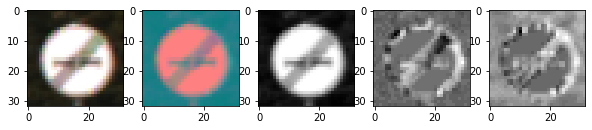

label n°:  15 	 No vehicles


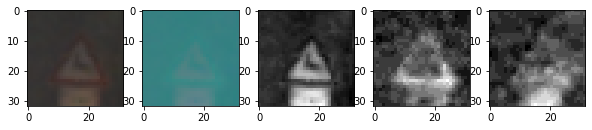

label n°:  16 	 Vehicles over 3.5 metric tons prohibited


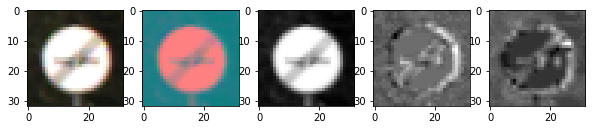

label n°:  17 	 No entry


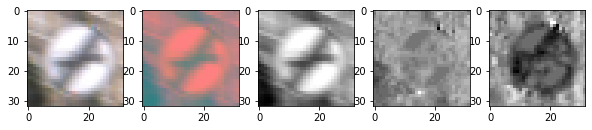

label n°:  18 	 General caution


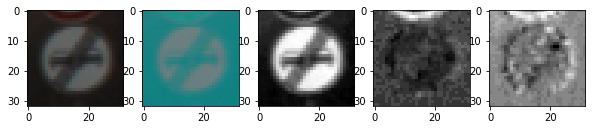

label n°:  19 	 Dangerous curve to the left


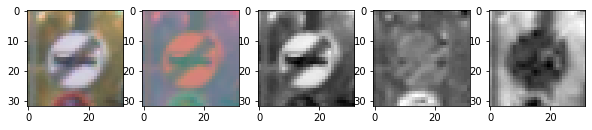

label n°:  20 	 Dangerous curve to the right


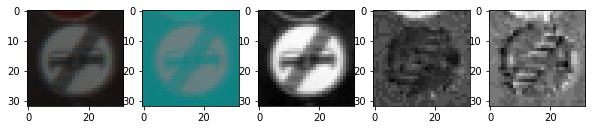

label n°:  21 	 Double curve


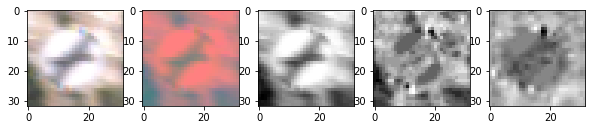

label n°:  22 	 Bumpy road


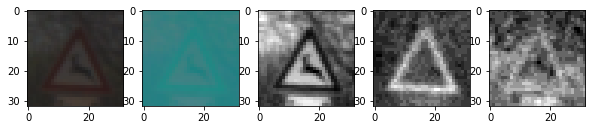

label n°:  23 	 Slippery road


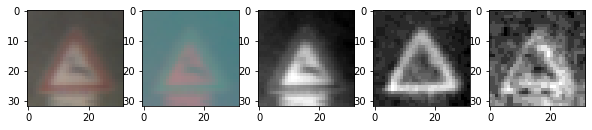

label n°:  24 	 Road narrows on the right


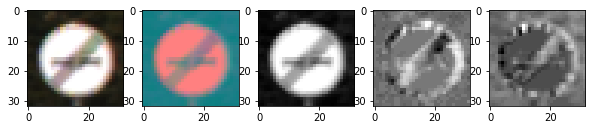

label n°:  25 	 Road work


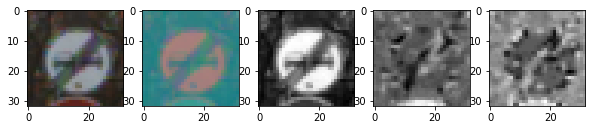

label n°:  26 	 Traffic signals


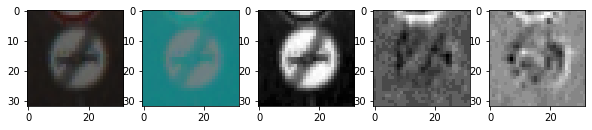

label n°:  27 	 Pedestrians


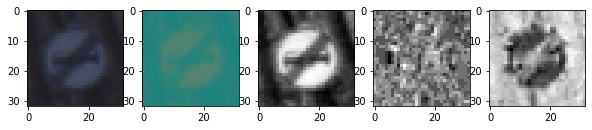

label n°:  28 	 Children crossing


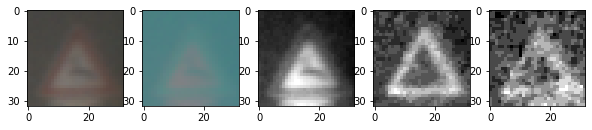

label n°:  29 	 Bicycles crossing


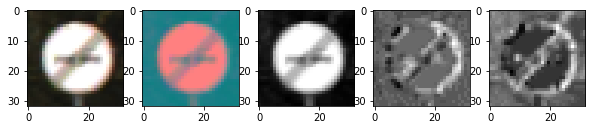

label n°:  30 	 Beware of ice/snow


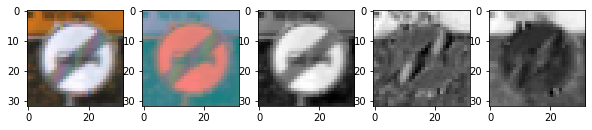

label n°:  31 	 Wild animals crossing


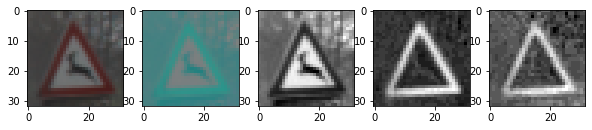

label n°:  32 	 End of all speed and passing limits


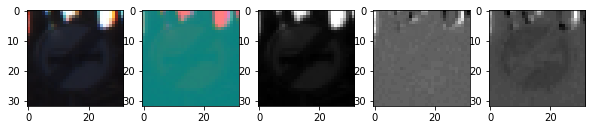

label n°:  33 	 Turn right ahead


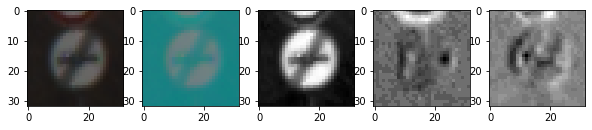

label n°:  34 	 Turn left ahead


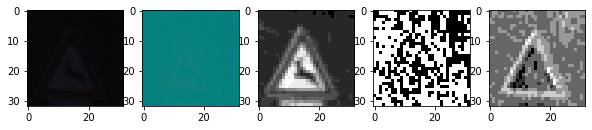

label n°:  35 	 Ahead only


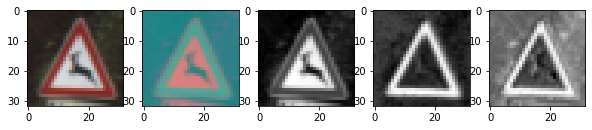

label n°:  36 	 Go straight or right


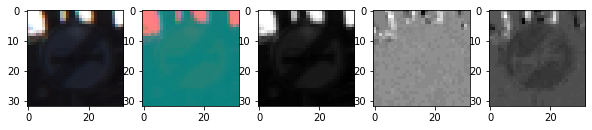

label n°:  37 	 Go straight or left


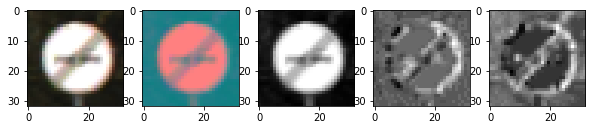

label n°:  38 	 Keep right


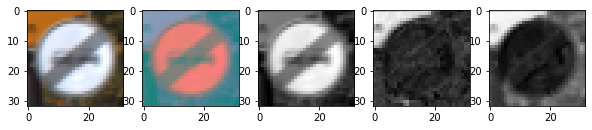

label n°:  39 	 Keep left


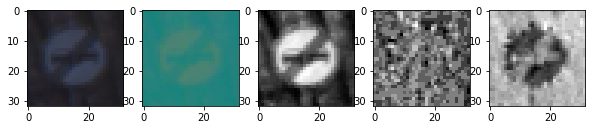

label n°:  40 	 Roundabout mandatory


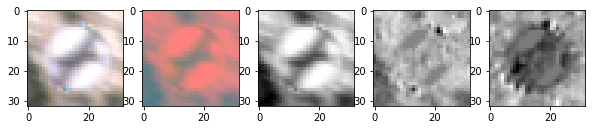

label n°:  41 	 End of no passing


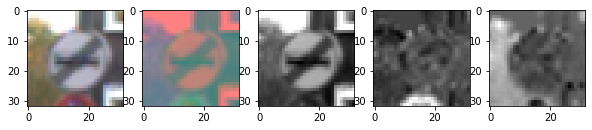

label n°:  42 	 End of no passing by vehicles over 3.5 metric tons


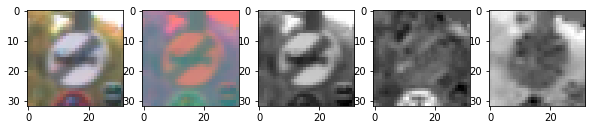

In [37]:
# Test LAB color space
window = 5
for label in range(n_classes):
    n = random.randint(0,len(list_of_images_per_label[label]))
    sample = X_train_augmented[n]
    LAB_sample = to_LAB(sample)
    samples = [sample, LAB_sample, LAB_sample[:,:,0], LAB_sample[:,:,1], LAB_sample[:,:,2]]
    plot_img_samples(window, label, samples)

label n°:  0 	 Speed limit (20km/h)


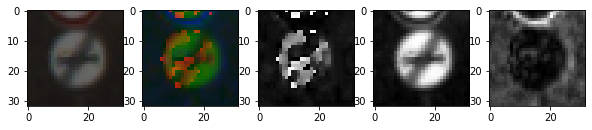

label n°:  1 	 Speed limit (30km/h)


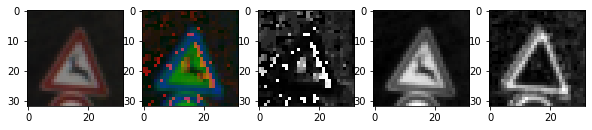

label n°:  2 	 Speed limit (50km/h)


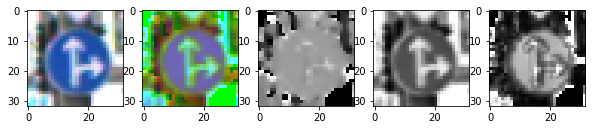

label n°:  3 	 Speed limit (60km/h)


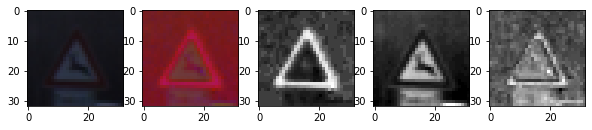

label n°:  4 	 Speed limit (70km/h)


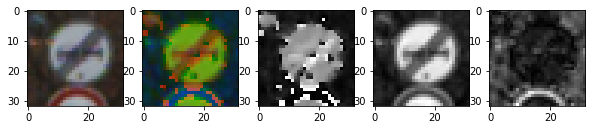

label n°:  5 	 Speed limit (80km/h)


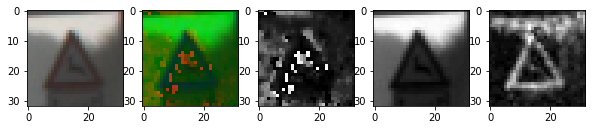

label n°:  6 	 End of speed limit (80km/h)


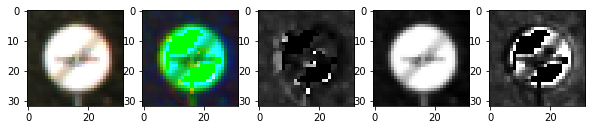

label n°:  7 	 Speed limit (100km/h)


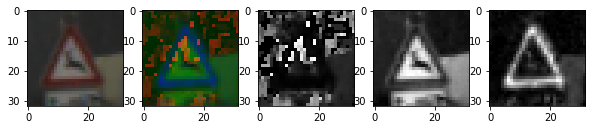

label n°:  8 	 Speed limit (120km/h)


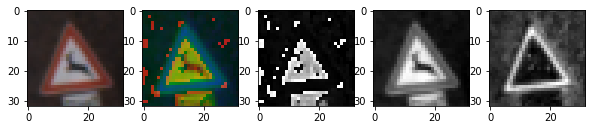

label n°:  9 	 No passing


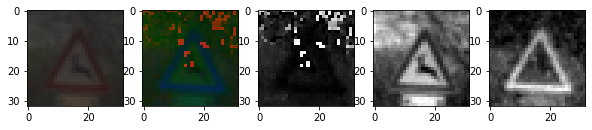

label n°:  10 	 No passing for vehicles over 3.5 metric tons


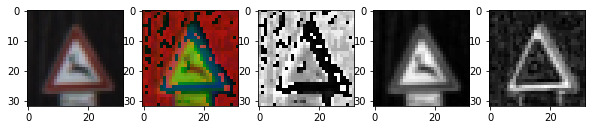

label n°:  11 	 Right-of-way at the next intersection


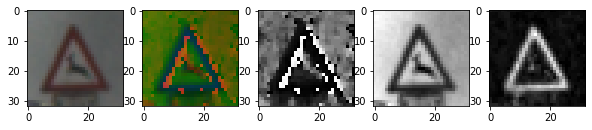

label n°:  12 	 Priority road


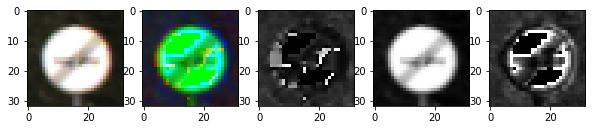

label n°:  13 	 Yield


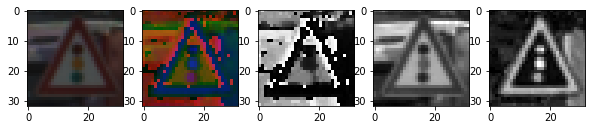

label n°:  14 	 Stop


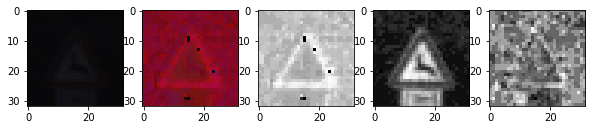

label n°:  15 	 No vehicles


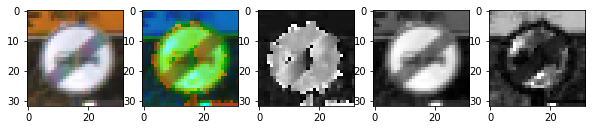

label n°:  16 	 Vehicles over 3.5 metric tons prohibited


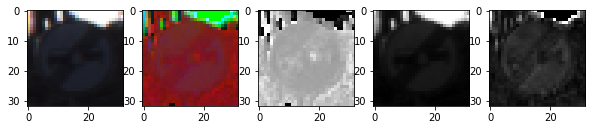

label n°:  17 	 No entry


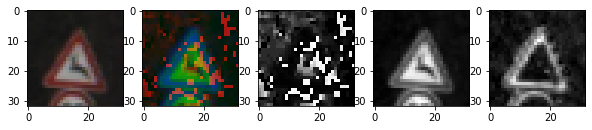

label n°:  18 	 General caution


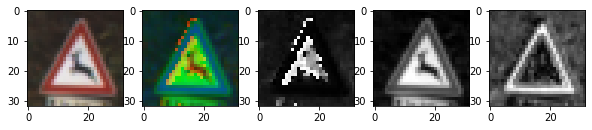

label n°:  19 	 Dangerous curve to the left


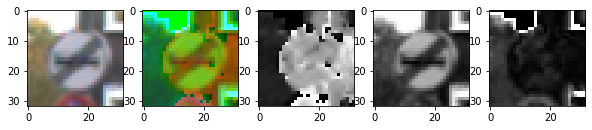

label n°:  20 	 Dangerous curve to the right


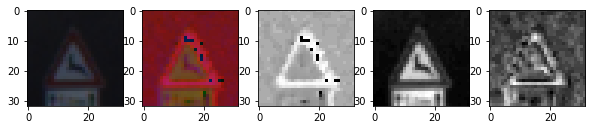

label n°:  21 	 Double curve


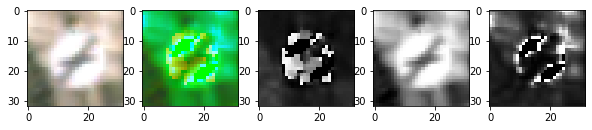

label n°:  22 	 Bumpy road


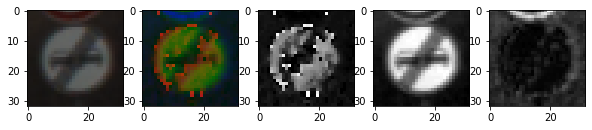

label n°:  23 	 Slippery road


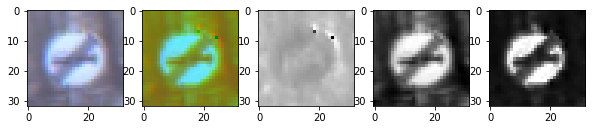

label n°:  24 	 Road narrows on the right


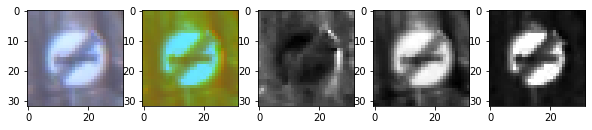

label n°:  25 	 Road work


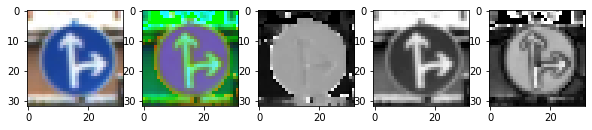

label n°:  26 	 Traffic signals


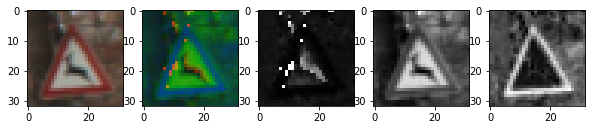

label n°:  27 	 Pedestrians


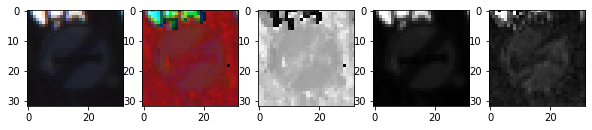

label n°:  28 	 Children crossing


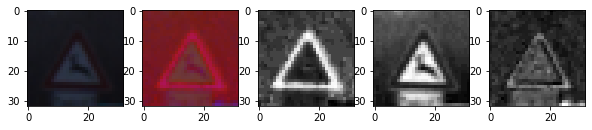

label n°:  29 	 Bicycles crossing


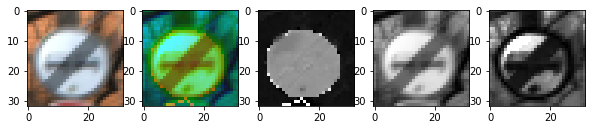

label n°:  30 	 Beware of ice/snow


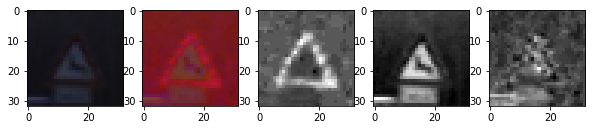

label n°:  31 	 Wild animals crossing


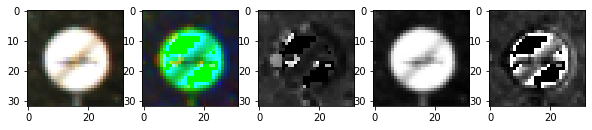

label n°:  32 	 End of all speed and passing limits


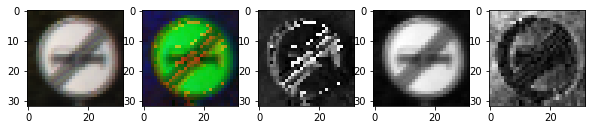

label n°:  33 	 Turn right ahead


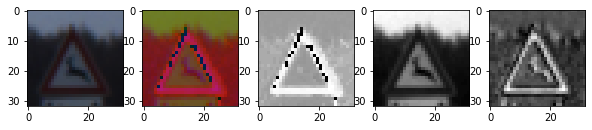

label n°:  34 	 Turn left ahead


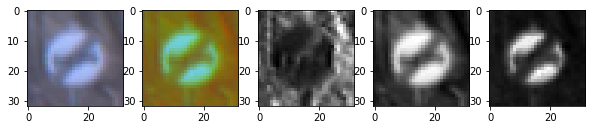

label n°:  35 	 Ahead only


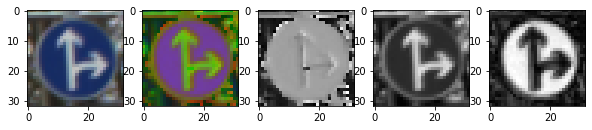

label n°:  36 	 Go straight or right


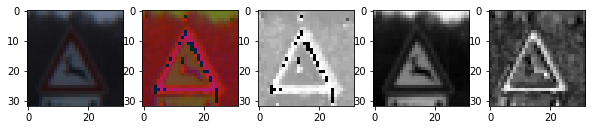

label n°:  37 	 Go straight or left


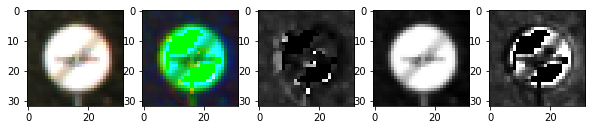

label n°:  38 	 Keep right


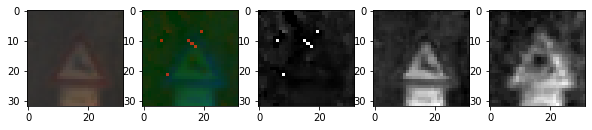

label n°:  39 	 Keep left


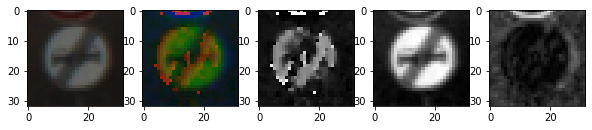

label n°:  40 	 Roundabout mandatory


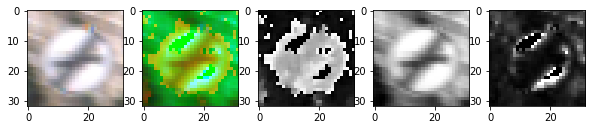

label n°:  41 	 End of no passing


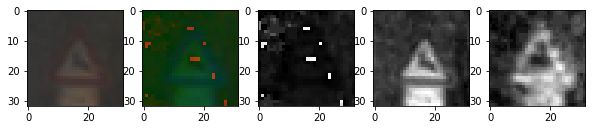

label n°:  42 	 End of no passing by vehicles over 3.5 metric tons


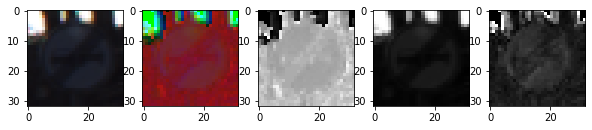

In [148]:
# Test HLS color space
for label in range(n_classes):
    n = random.randint(0,len(list_of_images_per_label[label]))
    sample = X_train_augmented[n]
    HLS_sample = to_HLS(sample)
    samples = [sample, HLS_sample, HLS_sample[:,:,0], HLS_sample[:,:,1], HLS_sample[:,:,2]]
    plot_img_samples(window, label, samples)

label n°:  0 	 Speed limit (20km/h)


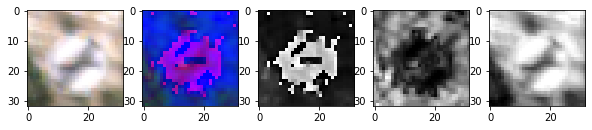

label n°:  1 	 Speed limit (30km/h)


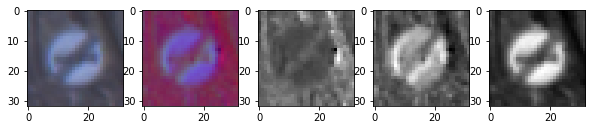

label n°:  2 	 Speed limit (50km/h)


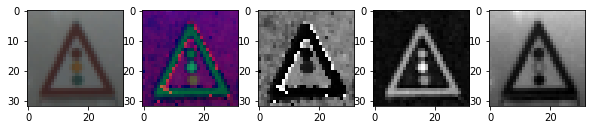

label n°:  3 	 Speed limit (60km/h)


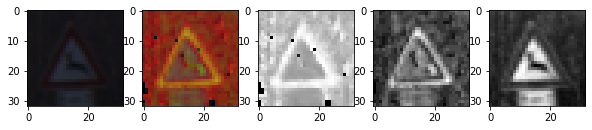

label n°:  4 	 Speed limit (70km/h)


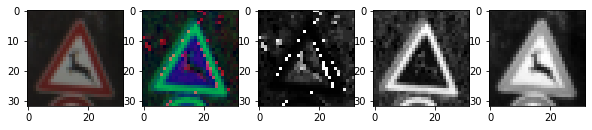

label n°:  5 	 Speed limit (80km/h)


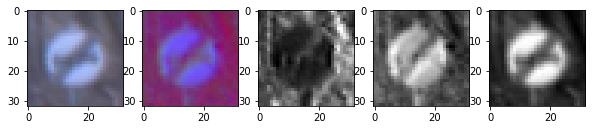

label n°:  6 	 End of speed limit (80km/h)


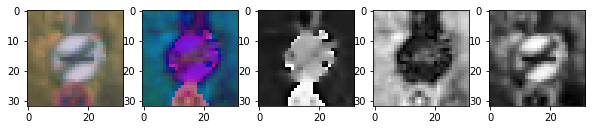

label n°:  7 	 Speed limit (100km/h)


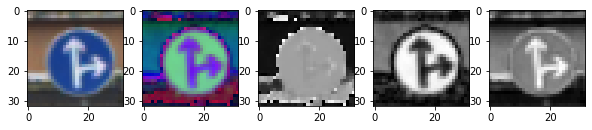

label n°:  8 	 Speed limit (120km/h)


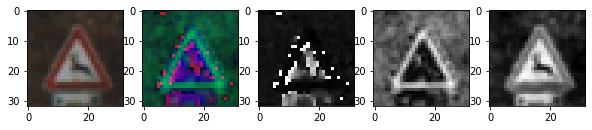

label n°:  9 	 No passing


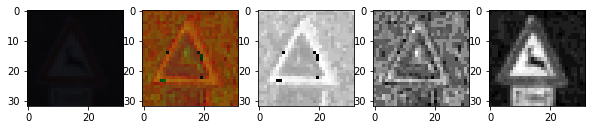

label n°:  10 	 No passing for vehicles over 3.5 metric tons


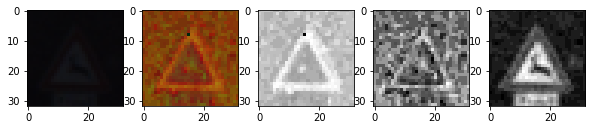

label n°:  11 	 Right-of-way at the next intersection


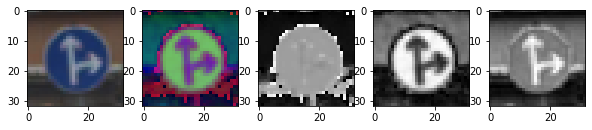

label n°:  12 	 Priority road


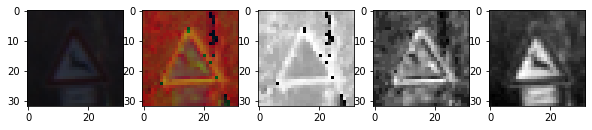

label n°:  13 	 Yield


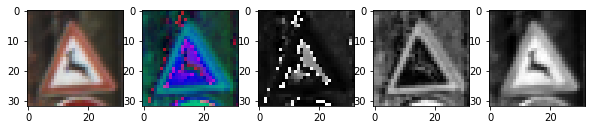

label n°:  14 	 Stop


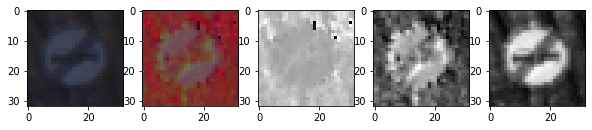

label n°:  15 	 No vehicles


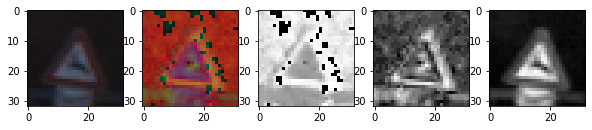

label n°:  16 	 Vehicles over 3.5 metric tons prohibited


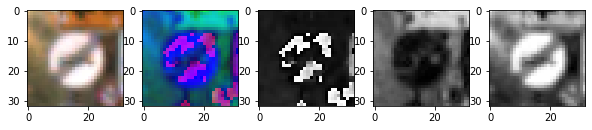

label n°:  17 	 No entry


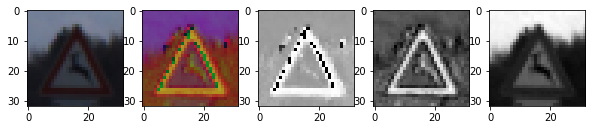

label n°:  18 	 General caution


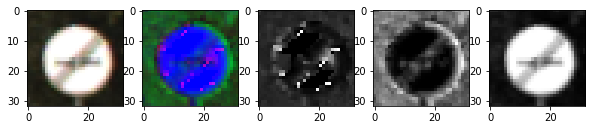

label n°:  19 	 Dangerous curve to the left


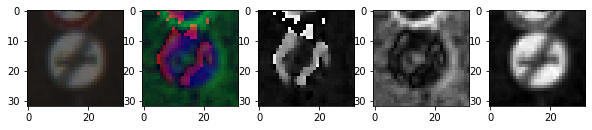

label n°:  20 	 Dangerous curve to the right


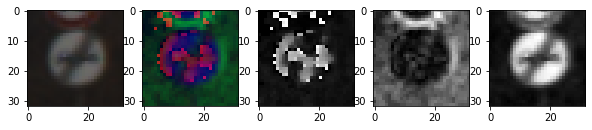

label n°:  21 	 Double curve


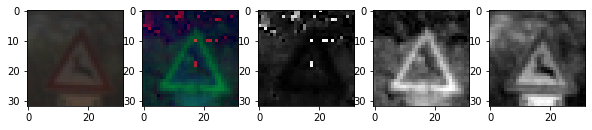

label n°:  22 	 Bumpy road


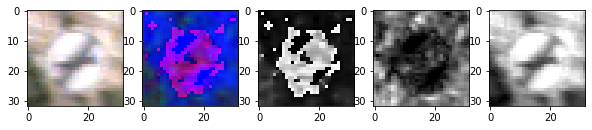

label n°:  23 	 Slippery road


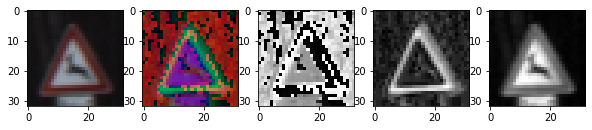

label n°:  24 	 Road narrows on the right


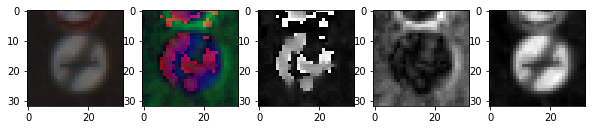

label n°:  25 	 Road work


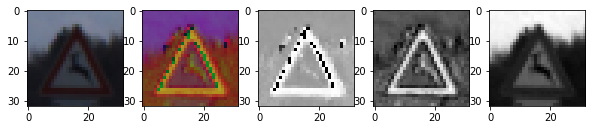

label n°:  26 	 Traffic signals


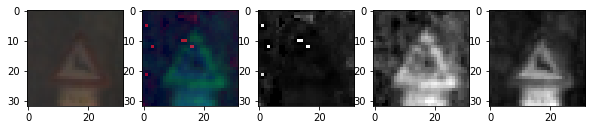

label n°:  27 	 Pedestrians


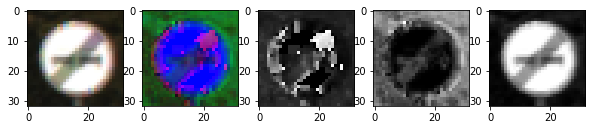

label n°:  28 	 Children crossing


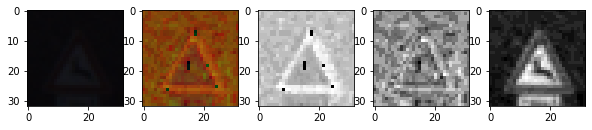

label n°:  29 	 Bicycles crossing


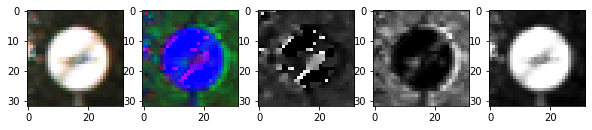

label n°:  30 	 Beware of ice/snow


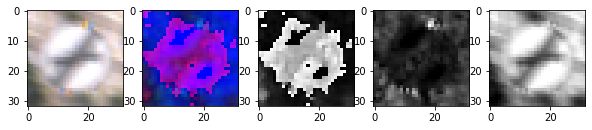

label n°:  31 	 Wild animals crossing


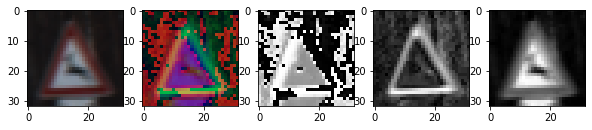

label n°:  32 	 End of all speed and passing limits


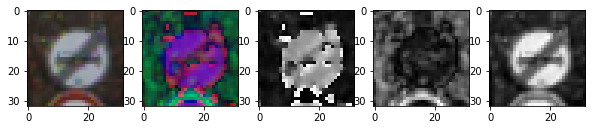

label n°:  33 	 Turn right ahead


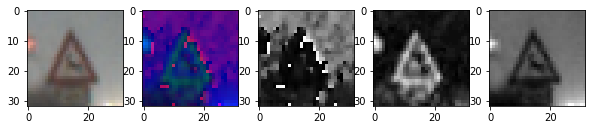

label n°:  34 	 Turn left ahead


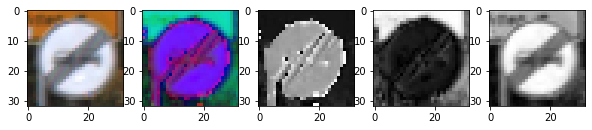

label n°:  35 	 Ahead only


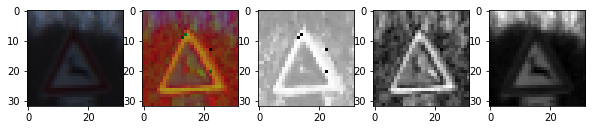

label n°:  36 	 Go straight or right


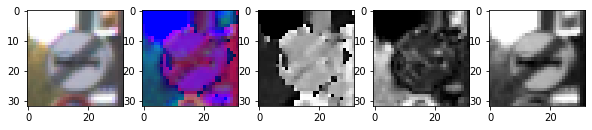

label n°:  37 	 Go straight or left


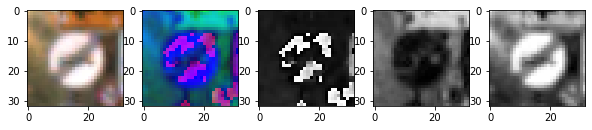

label n°:  38 	 Keep right


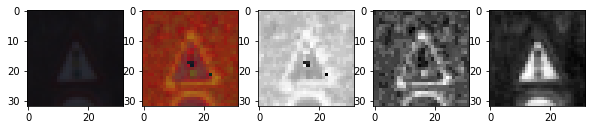

label n°:  39 	 Keep left


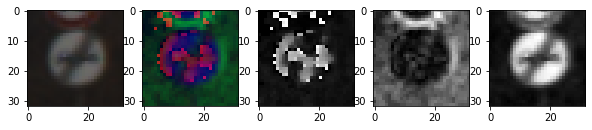

label n°:  40 	 Roundabout mandatory


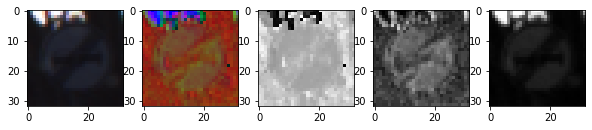

label n°:  41 	 End of no passing


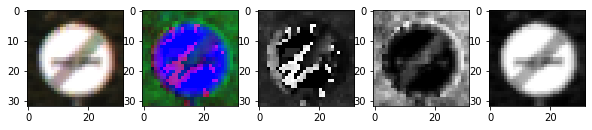

label n°:  42 	 End of no passing by vehicles over 3.5 metric tons


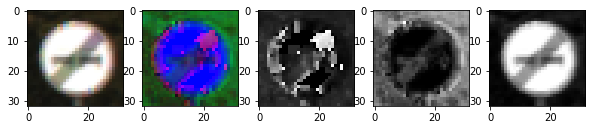

In [149]:
# Test HSV color space
for label in range(n_classes):
    n = random.randint(0,len(list_of_images_per_label[label]))
    sample = X_train_augmented[n]
    HSV_sample = to_HSV(sample)
    samples = [sample, HSV_sample, HSV_sample[:,:,0], HSV_sample[:,:,1], HSV_sample[:,:,2]]
    plot_img_samples(window, label, samples)

## Only L channel of LAB color space allows to manage variation in brightness. Channels in HLS and HSV are deteriorated by noise and poor image quality
## L channel looks like a good option for preprocessing during training

In [38]:
def Set_to_LAB(img_set):
    LAB_imgs = []
    for img in img_set:
        img_LAB = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        LAB_imgs.append(img_LAB)
    return LAB_imgs

In [39]:
# Convert RGB image dataset to LAB and collect L channel
X_train_LAB = Set_to_LAB(X_train_augmented)
print(X_train_LAB[0].shape, X_train_LAB[0].min(),X_train_LAB[0].max(), X_train_LAB[0].dtype)

(32, 32, 3) 19 144 uint8


In [40]:
import cv2
# create a CLAHE object (Arguments are optional).
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4,4))

In [41]:
#Perform histogram equalization using CLAHE algorithm on RGB->YUV->RGB images
def clahe_equalize_LAB(img_set):
  clahe_LAB_img_set = []
  clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4,4))
  for img in img_set:
    y, u, v = cv2.split(cv2.cvtColor(np.array(img,dtype='uint8'), cv2.COLOR_RGB2LAB))
    y = clahe.apply(y)
    img = cv2.merge((y,u,v))
    img = cv2.cvtColor(img, cv2.COLOR_LAB2RGB)
    clahe_LAB_img_set.append(img)
  return clahe_LAB_img_set

In [42]:
X_train_LAB_CLAHE = clahe_equalize_LAB(X_train_augmented)

label n°:  0 	 Speed limit (20km/h)


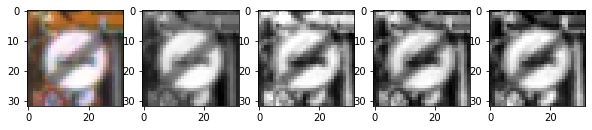

label n°:  1 	 Speed limit (30km/h)


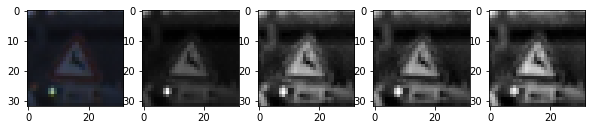

label n°:  2 	 Speed limit (50km/h)


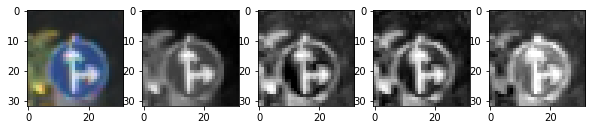

label n°:  3 	 Speed limit (60km/h)


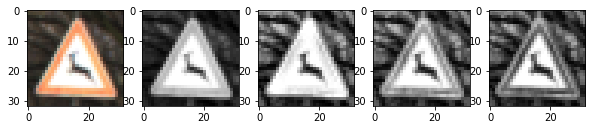

label n°:  4 	 Speed limit (70km/h)


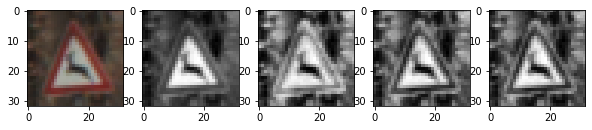

label n°:  5 	 Speed limit (80km/h)


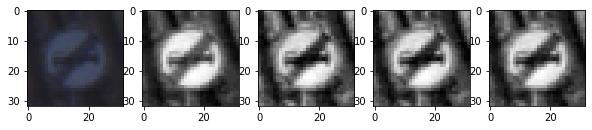

label n°:  6 	 End of speed limit (80km/h)


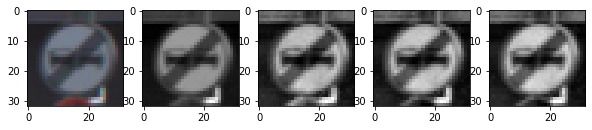

label n°:  7 	 Speed limit (100km/h)


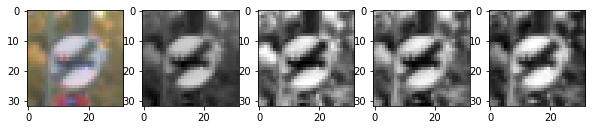

label n°:  8 	 Speed limit (120km/h)


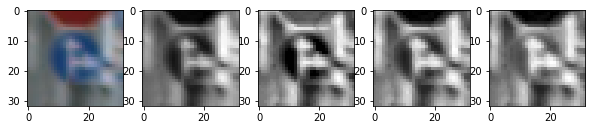

label n°:  9 	 No passing


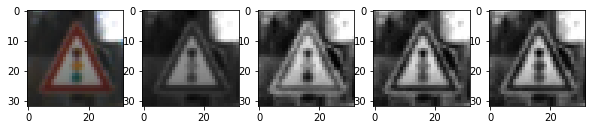

label n°:  10 	 No passing for vehicles over 3.5 metric tons


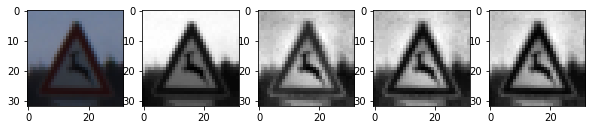

label n°:  11 	 Right-of-way at the next intersection


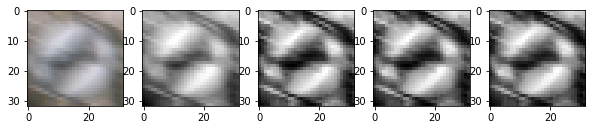

label n°:  12 	 Priority road


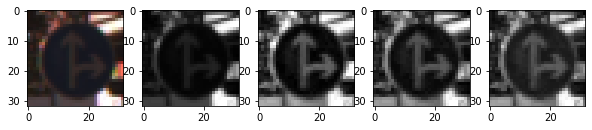

label n°:  13 	 Yield


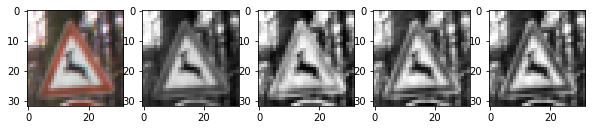

label n°:  14 	 Stop


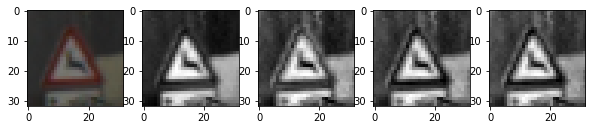

label n°:  15 	 No vehicles


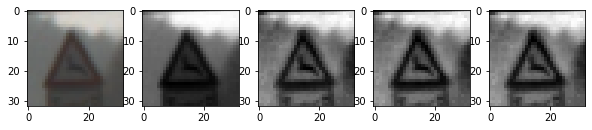

label n°:  16 	 Vehicles over 3.5 metric tons prohibited


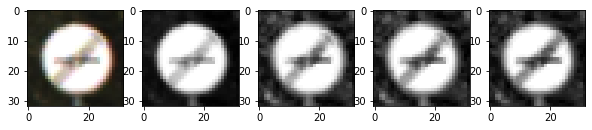

label n°:  17 	 No entry


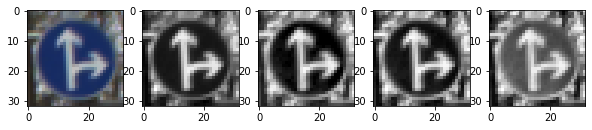

label n°:  18 	 General caution


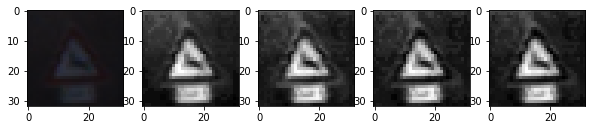

label n°:  19 	 Dangerous curve to the left


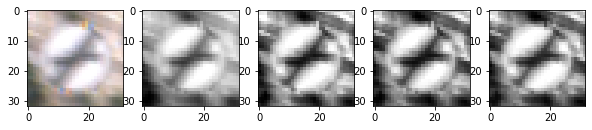

label n°:  20 	 Dangerous curve to the right


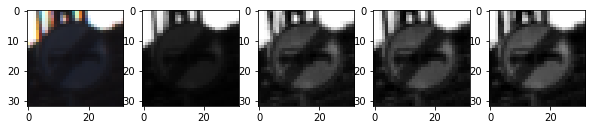

label n°:  21 	 Double curve


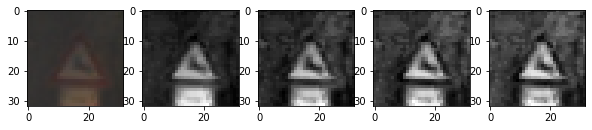

label n°:  22 	 Bumpy road


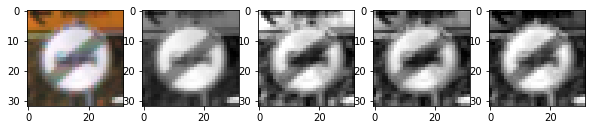

label n°:  23 	 Slippery road


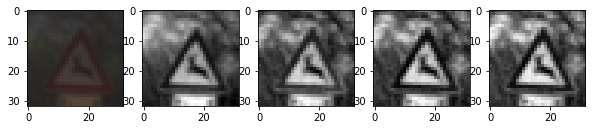

label n°:  24 	 Road narrows on the right


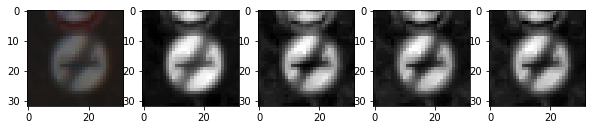

label n°:  25 	 Road work


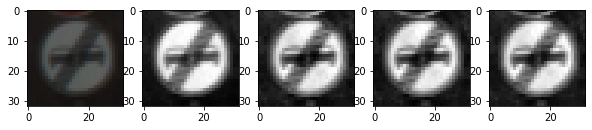

label n°:  26 	 Traffic signals


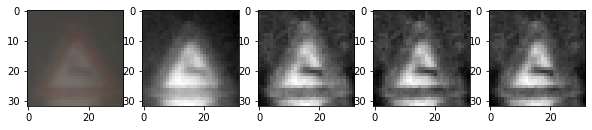

label n°:  27 	 Pedestrians


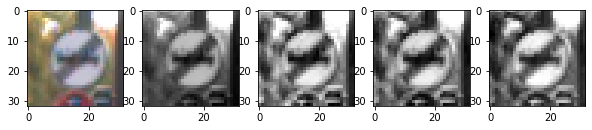

label n°:  28 	 Children crossing


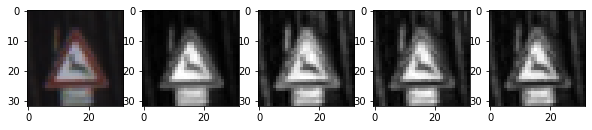

label n°:  29 	 Bicycles crossing


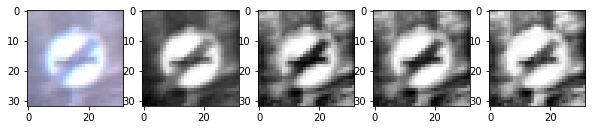

label n°:  30 	 Beware of ice/snow


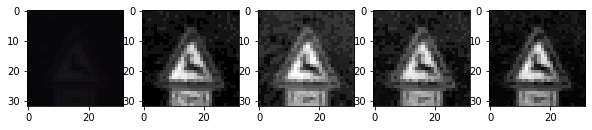

label n°:  31 	 Wild animals crossing


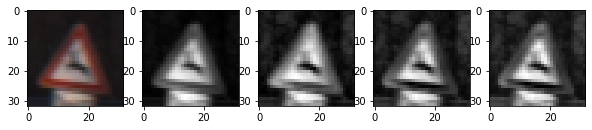

label n°:  32 	 End of all speed and passing limits


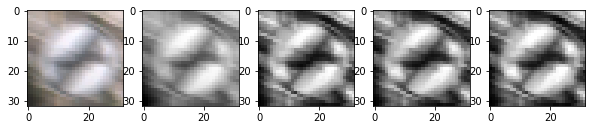

label n°:  33 	 Turn right ahead


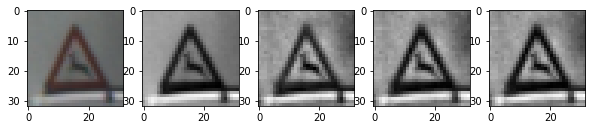

label n°:  34 	 Turn left ahead


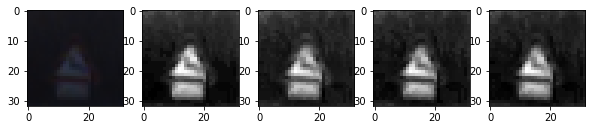

label n°:  35 	 Ahead only


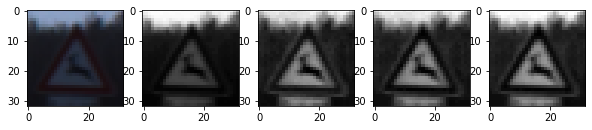

label n°:  36 	 Go straight or right


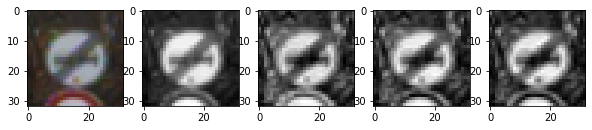

label n°:  37 	 Go straight or left


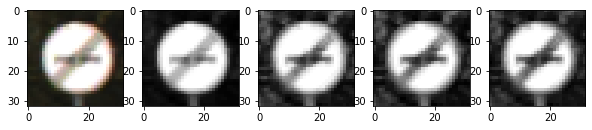

label n°:  38 	 Keep right


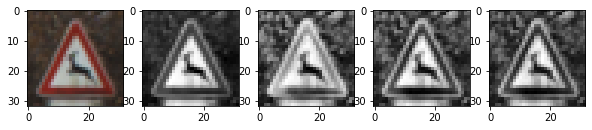

label n°:  39 	 Keep left


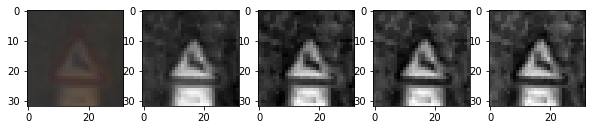

label n°:  40 	 Roundabout mandatory


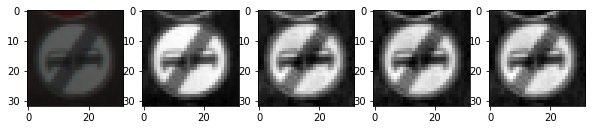

label n°:  41 	 End of no passing


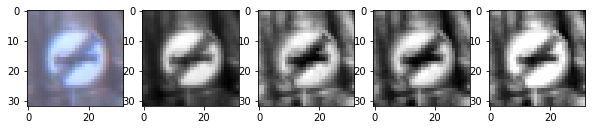

label n°:  42 	 End of no passing by vehicles over 3.5 metric tons


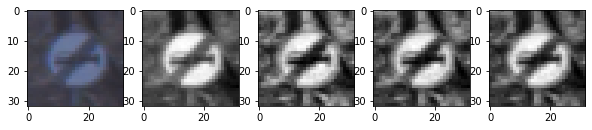

In [43]:
# Test LAB color space
window = 5
for label in range(n_classes):
    n = random.randint(0,len(list_of_images_per_label[label]))
    sample = X_train_LAB_CLAHE[n]
    samples = [X_train_augmented[n], to_LAB(X_train_augmented[n])[:,:,0], sample[:,:,0], sample[:,:,1], sample[:,:,2]]
    plot_img_samples(window, label, samples)

## Looks like we get a small contrast improvement applying CLAHE normalization to L channel

### Other pre_processing transformations
- grayscale
- CLAHE histogram normalization applied to grayscale and RGB images
- Combined 4D images consolidating CLAHE RBG and grayscale images

In [44]:
#Perform histogram equalization using CLAHE algorithm on RGB->YUV->RGB images
def clahe_equalize_RGB(img_set):
    clahe_RGB_img_set = []
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4,4))
    for img in img_set:
        y, u, v = cv2.split(cv2.cvtColor(np.array(img,dtype='uint8'), cv2.COLOR_RGB2YUV))
        y = clahe.apply(y)
        img = cv2.merge((y,u,v))
        img = cv2.cvtColor(img, cv2.COLOR_YUV2RGB)
        clahe_RGB_img_set.append(img)
    return clahe_RGB_img_set

#Merge RGB and gray channels to create image set of depth 4
def merge_channels(img_gray_set, img_RGB_set):
    merge_set = []
    assert(len(img_RGB_set) == len(img_gray_set))
    for img1, img2 in zip(img_gray_set, img_RGB_set):
        img = cv2.merge((np.array(img1, dtype='uint8'), np.array(img2, dtype='uint8')))
        merge_set.append(img)
    return merge_set

#Normalize image set using mean/std of entire image set
def normalize(img_set, mean, std):
    norm_img_set = []
    for img in tqdm(img_set, total = len(img_set)):
        norm_img_set.append((np.array(img, dtype='uint8') - mean)/std)
    return norm_img_set

In [45]:
# Convert to grayscale and apply CLAHE hist normalization

X_train_gray = np.zeros((len(X_train_augmented), 32, 32, 1), dtype=np.uint8)
#X_train_gray = np.zeros((len(X_train_augmented), 32, 32), dtype='uint8')

for index, image in enumerate(tqdm(X_train_augmented)):
    image_gray = cv2.cvtColor(np.array(image, dtype='uint8'), cv2.COLOR_RGB2GRAY)
    img_normalized = np.expand_dims(clahe.apply(image_gray), axis=2)
    #img_normalized = clahe.apply(image_gray)
    X_train_gray[index] = img_normalized   
    

100%|█████████████████████████████████████████████████████████████████████████| 67380/67380 [00:02<00:00, 32519.38it/s]


In [46]:
print(X_train_gray.shape, X_train_gray[0].min(),X_train_gray[0].max())

(67380, 32, 32, 1) 20 206


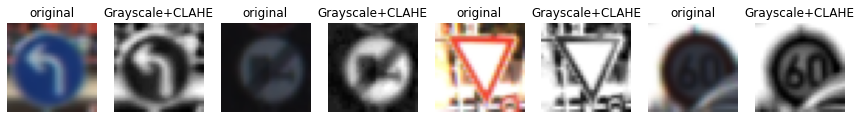

In [47]:
# Let's vizualize GRAYSCALE CLAHE images
sample = 4
plt.figure(figsize=(15,20))
for index in range(sample):
    plt.subplot(1, 2*sample, 2*index+1)
    n = random.randrange(0, len(X_train_augmented))
    title = 'label n°' + str(int(y_train_augmented[n]))
    plt.title('original')
    plt.axis('off')
    plt.imshow(np.array(X_train_augmented[n], dtype='uint8'))

    plt.subplot(1, 2*sample, 2*(index+1))
    title = 'label n°' + str(int(y_train_augmented[n]))
    plt.title('Grayscale+CLAHE')
    plt.axis('off')
    # img.squeeze() to remove the extra channel added during grayscale normalization step
    plt.imshow(np.array(X_train_gray[n].squeeze(), dtype='uint8'), cmap='gray')   
plt.show()

In [48]:
# Convert RGB image dataset to YUV, apply CLAHE histogram normalization and back to RGB

X_train_RGB_clahe = clahe_equalize_RGB(X_train_augmented)
print(X_train_RGB_clahe[0].shape, X_train_RGB_clahe[0].min(),X_train_RGB_clahe[0].max())

(32, 32, 3) 15 207


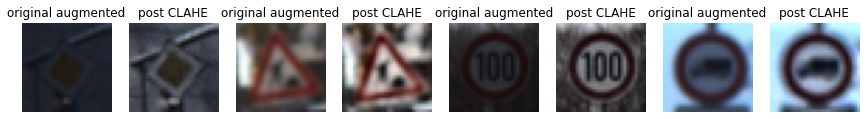

In [49]:
# Let's vizualize RGB CLAHE images
sample = 4
plt.figure(figsize=(15,20))
for index in range(sample):
    plt.subplot(1, 2*sample, 2*index+1)
    n = random.randrange(0, len(X_train_augmented))
    title = 'label n°' + str(int(y_train_augmented[n]))
    plt.title('original augmented')
    plt.axis('off')
    plt.imshow(np.array(X_train_augmented[n], dtype='uint8'))

    plt.subplot(1, 2*sample, 2*(index+1))
    title = 'label n°' + str(int(y_train_augmented[n]))
    plt.title('post CLAHE')
    plt.axis('off')
    plt.imshow(np.array(X_train_RGB_clahe[n], dtype='uint8'))
plt.show()

In [50]:
X_train_merged = merge_channels(X_train_gray, X_train_RGB_clahe)
print(X_train_merged[0].shape, X_train_merged[0].min(),X_train_merged[0].max())

(32, 32, 4) 15 207


In [51]:
# Normalize mean and std
mean = np.mean(X_train_merged)
std = np.std(X_train_merged)
print( "Dataset mean: {0:.2f}\t std: {1:.2f}".format(mean, std))

Dataset mean: 102.28	 std: 65.07


In [52]:
X_train_Normalized = normalize(X_train_merged, mean, std)
print(X_train_Normalized[0].shape, X_train_Normalized[0].min(), X_train_Normalized[0].max())

100%|█████████████████████████████████████████████████████████████████████████| 67380/67380 [00:01<00:00, 38002.69it/s]

(32, 32, 4) -1.3413262400513688 1.609339578094845


In [53]:
# Min-Max scaling to achieved range [O,1]
def scale(img):
  a = img.min()
  b = img.max()
  scaled = (img - a) / (b - a)
  return scaled

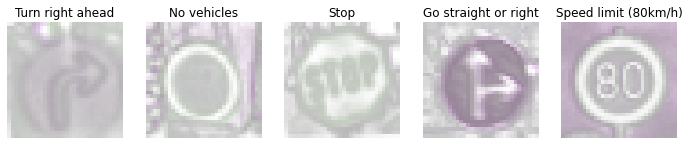

In [56]:
from PIL import Image
# Let's vizualize the RGB+GRAY CLAHE 4D images
sample = 5
plt.figure(figsize=(12,20))
for index in range(sample):
  plt.subplot(1, sample, index+1)
  n = random.randrange(0, len(X_train_Normalized))
  title = sign_names.iloc[int(y_train_augmented[n]),1]
  plt.title(title)
  plt.axis('off')
  img = scale(X_train_Normalized[n])
  #img = Image.fromarray(np.array(X_train_Normalized[n], dtype='uint8'), mode='RGBA')
  #plt.imshow(np.array(X_train_Normalized[n], dtype = 'uint8'))
  #plt.imshow(X_train_Normalized[n].squeeze(), cmap='gray')
  plt.imshow(img, cmap='gray')
plt.show()

Index: 42847
Image Label: 40 - Roundabout mandatory


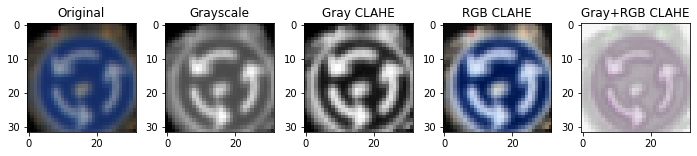

In [58]:
# try index = 32548, 32034, 4077  # relevant serie
index = random.randrange(0, len(X_train_Normalized))
print("Index:", index)
plt.figure(figsize=(12,2))
plt.subplot(1,5,1)
plt.title('Original')
plt.imshow(np.array(X_train_augmented[index], dtype='uint8'))
plt.subplot(1,5,2)
plt.title('Grayscale')
plt.imshow(cv2.cvtColor(np.array(X_train_augmented[index], dtype='uint8'), cv2.COLOR_RGB2GRAY), cmap = 'gray')
plt.subplot(1,5,3)
plt.title('Gray CLAHE')
plt.imshow(X_train_gray[index].squeeze(), cmap = 'gray')
plt.subplot(1,5,4)
plt.title('RGB CLAHE')
plt.imshow(X_train_RGB_clahe[index])
plt.subplot(1,5,5)
plt.title('Gray+RGB CLAHE')
plt.imshow(scale(X_train_Normalized[index]))  # cmap = 'gray'
plt.savefig('./image-processing.png')
print('Image Label:', int(y_train_augmented[index]), "-", sign_names.iloc[int(y_train_augmented[index]),1])

### For Training we will use:
- X_train_Normalized which combines the Grayscale Clahe and the RGB Clahe augmented images
- y_train_augmented

Alternatives:
- use RGB CLAHE augmented images (X_train_RGB_clahe)

or

- use X_train_augmented and leave the model learn the necessary image processing

We need to apply CLAHE to validation and test sets

## CREATE VALIDATION SETs
- grayscale post CLAHE
- RGB post CLAHE
- L channel post CLAHE
- Normalized 4D images (RGB + Gray both post Clahe)

In [59]:
# Convert to grayscale and apply CLAHE hist normalization
X_val_gray = np.zeros((len(X_valid), 32, 32, 1), dtype=np.uint8)
for index, image in enumerate(tqdm(X_valid)):
    image_gray = cv2.cvtColor(np.array(image, dtype='uint8'), cv2.COLOR_RGB2GRAY)
    img_normalized = np.expand_dims(clahe.apply(image_gray), axis=2)
    X_val_gray[index] = img_normalized   

100%|███████████████████████████████████████████████████████████████████████████| 4410/4410 [00:00<00:00, 32674.40it/s]


In [60]:
# Create Validation set RGB CLAHE
X_val_RGB_clahe = clahe_equalize_RGB(X_valid)

In [61]:
# Create Validation set RGB+GRAY CLAHE 4D Normalized images
X_val_merged = merge_channels(X_val_gray, X_val_RGB_clahe)
# Normalize mean and std
mean = np.mean(X_val_merged)
std = np.std(X_val_merged)
print( "Dataset mean: {0:.2f}\t std: {1:.2f}".format(mean, std))
X_val_Normalized = normalize(X_val_merged, mean, std)
print(X_val_Normalized[0].shape, X_val_Normalized[0].min(), X_val_Normalized[0].max())

100%|███████████████████████████████████████████████████████████████████████████| 4410/4410 [00:00<00:00, 25794.58it/s]

Dataset mean: 101.49	 std: 67.66
(32, 32, 4) -1.3521897037803272 1.2047240926460905


In [62]:
# Create Validation set LAB images
X_val_LAB_CLAHE = clahe_equalize_LAB(X_valid)
print(X_val_LAB_CLAHE[0].shape, X_val_LAB_CLAHE[0].min(), X_val_LAB_CLAHE[0].max(), X_val_LAB_CLAHE[0].dtype)

(32, 32, 3) 10 188 uint8


----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play! 

With the LeNet-5 solution from the lecture, you should expect a validation set accuracy of about 0.89. To meet specifications, the validation set accuracy will need to be at least 0.93. It is possible to get an even higher accuracy, but 0.93 is the minimum for a successful project submission. 

There are various aspects to consider when thinking about this problem:

- Neural network architecture (is the network over or underfitting?)
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

### Pre-process the Data Set (normalization, grayscale, etc.)

Minimally, the image data should be normalized so that the data has mean zero and equal variance. For image data, `(pixel - 128)/ 128` is a quick way to approximately normalize the data and can be used in this project. 

Other pre-processing steps are optional. You can try different techniques to see if it improves performance. 

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project.

In [63]:
# current range
# image scale from 0. to 1. expected by pretrained model
print('image scale: \tMin: ', X_train.min(), '\tMax: ', X_train.max())      

image scale: 	Min:  0 	Max:  255


In [64]:
max255=[]
max128=[]
for i in range(n_train):
    if X_train[i].max()<=128:
        max128.append(i)
        #X_train_normalized[i] = X_train[i]/128.
    else:
        max255.append(i)
        #X_train_normalized[i] = X_train[i]/255.
        
print('images [0-128]: ', len(max128), 'images [0-255]: ', len(max255))

images [0-128]:  7929 images [0-255]:  26870


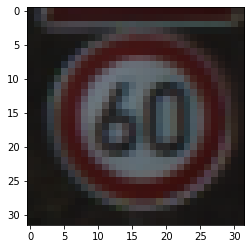

In [65]:
plt.imshow(X_train[max128[1000]])
plt.show()

# Define DATALOADER
data stored in memory with:
- X_train, y_train : images and label n°
- same for validation and test

## shuffle arrays in unison

method #1
- from sklearn.model_selection import train_test_split
- X, _, Y, _ = train_test_split(X,Y, test_size=0.0)            # setting test size to 0 will not split but just shuffle

method #2
- def unison_shuffled_copies(a, b):
    - assert len(a) == len(b)
    - p = numpy.random.permutation(len(a))
    - return a[p], b[p]
    
method #3
- randomize = np.arange(len(x))
- np.random.shuffle(randomize)
- x = x[randomize]
- y = y[randomize]

method #4
- X = np.array([[1., 0.], [2., 1.], [0., 0.]])
- y = np.array([0, 1, 2])
- from sklearn.utils import shuffle
- X, y = shuffle(X, y)




In [66]:
### Preprocess the data here. It is required to normalize the data. Other preprocessing steps could include
### converting to grayscale, etc.
### Feel free to use as many code cells as needed.

In [67]:
from torchvision import transforms
from PIL import Image
import warnings
import torch

def gen_batch_function(mode):
  """
  Generate function to create batches of training data
  :param data_folder: Path to folder that contains all the datasets
  :param image_shape: Tuple - Shape of image
  :return:
  """
    
  if mode == 'train':
      pass
  elif mode == 'validation':
      pass
  else:
      warnings.warn('Incorrect mode selected, please select either ''train'' or ''validation''')
    
    
  # TRANSFORMS Converts a PIL Image or numpy.ndarray (H x W x C) in the range [0, 255] to a torch.FloatTensor 
  # of shape (C x H x W) in the range [0.0, 1.0] if PIL Image or if the numpy.ndarray has dtype = np.uint8
    
  # transforms.normalize expects a TENSOR => position after ToTensor(). ToTensor normalizes to [0,1]
    
  transform_train = transforms.Compose([transforms.ToTensor() ])

  transform_validation = transforms.Compose([transforms.ToTensor() ])

  transform_test = transforms.Compose([transforms.ToTensor() ])

  transform_label = transforms.Compose([transforms.ToTensor()])


  def get_batches_fn(x,y, batch_size): ## x, y must be numpy.array() NOT type List
    """
    Create batches of training data
    :param batch_size: Batch Size
    :return: Batches of training data
    """

    # Shuffle training data
    randomize = np.arange(len(x))
    np.random.shuffle(randomize)
    x = x[randomize]
    y = y[randomize]

    num_channels = x.shape[-1]
    
    num_batches = len(y) // batch_size   # number of full batches available to the generator

    # Loop through batches and grab images, yielding each batch
    for batch_i in range(0, num_batches * batch_size, batch_size):
      
      images = torch.zeros([batch_size, num_channels, 32, 32])
      labels = torch.zeros([batch_size, n_classes])
      
      for index, img in enumerate(x[batch_i:batch_i+batch_size]):
        
        #Load image 
        #image = Image.fromarray(img)          # Attention: image format W,H and Image type (not numpy)
        image = np.copy(img)
        # Convert to tensor
        #####label = transform_label(y[index]) can't use as expects Image/ndarray with 2/3 dimensions when y is None
        label = torch.from_numpy(np.array(y[batch_i + index])) # CrossEntropyLoss expects a 1D tensor with class n° for each item in batch
        ##label = one_hot_tensor(y[index])  CrossEntropyLoss expects a 1D tensor with class n° for each item in batch
                
        if mode =='train':
          
          image = transform_train(image)    # Tensor shape 3 x H x W as expected by pretrained models

        else:

          image = transform_validation(image)
            
        # store images and labels in array
        images[index,:,:,:] = image
        labels[index,y[batch_i + index]] = label

    yield images, labels
    
  return get_batches_fn

### Create train and Validation batch generators

In [68]:
# Let's reconfigure our input data so that it is numpy.array
print( type(X_train), X_train.dtype, type(X_train_Normalized), X_train_Normalized[0].dtype)
print(type(y_train), type(y_train_augmented))

<class 'numpy.ndarray'> uint8 <class 'list'> float64
<class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [69]:
# Convert augmented data back to numpy array if these data come as a list
if type(X_train_augmented)!= type(X_train):
  X_train_augmented = np.array(X_train_augmented, dtype='uint8')

print( 'X_train type and dimensions: ', type(X_train), X_train.shape, X_train.dtype)
print( 'post-processed X_train_Normalized type and dimensions: ', type(X_train_augmented), X_train_augmented.shape, X_train_augmented.dtype)

X_train type and dimensions:  <class 'numpy.ndarray'> (34799, 32, 32, 3) uint8
post-processed X_train_Normalized type and dimensions:  <class 'numpy.ndarray'> (67380, 32, 32, 3) uint8


In [70]:
# Convert augmented data back to numpy array if these data come as a list
if type(X_train_Normalized)!= type(X_train):
  X_train_Normalized = np.array(X_train_Normalized, dtype='float64') # float because normalized to [-1:+1] (need clipping)

print( 'X_train type and dimensions: ', type(X_train), X_train.shape, X_train.dtype)
print( 'post-processed X_train_Normalized type and dimensions: ', type(X_train_Normalized), X_train_Normalized.shape, X_train_Normalized.dtype)

X_train type and dimensions:  <class 'numpy.ndarray'> (34799, 32, 32, 3) uint8
post-processed X_train_Normalized type and dimensions:  <class 'numpy.ndarray'> (67380, 32, 32, 4) float64


In [71]:
# Convert augmented data back to numpy array if these data come as a list
if type(X_val_Normalized)!= type(X_valid):
  X_val_Normalized = np.array(X_val_Normalized, dtype='float64')       # float because normalized to [-1:+1] (need clipping)

print( 'X_val type and dimensions: ', type(X_valid), X_valid.shape, X_valid.dtype)
print( 'post-processed X_val_Normalized type and dimensions: ', type(X_val_Normalized), X_val_Normalized.shape, X_val_Normalized.dtype)

X_val type and dimensions:  <class 'numpy.ndarray'> (4410, 32, 32, 3) uint8
post-processed X_val_Normalized type and dimensions:  <class 'numpy.ndarray'> (4410, 32, 32, 4) float64


In [72]:
# Convert augmented data back to numpy array if these data come as a list
if type(X_train_LAB_CLAHE)!= type(X_train):
    X_train_LAB_CLAHE = np.array(X_train_LAB_CLAHE, dtype='uint8') 
print( 'X_train type and dimensions: ', type(X_train), X_train.shape, X_train.dtype)
print( 'post-processed X_train_LAB_CLAHE type and dimensions: ', type(X_train_LAB_CLAHE), X_train_LAB_CLAHE.shape, X_train_LAB_CLAHE.dtype)

X_train type and dimensions:  <class 'numpy.ndarray'> (34799, 32, 32, 3) uint8
post-processed X_train_LAB_CLAHE type and dimensions:  <class 'numpy.ndarray'> (67380, 32, 32, 3) uint8


In [73]:
# Convert augmented data back to numpy array if these data come as a list
if type(X_val_LAB_CLAHE)!= type(X_valid):
  X_val_LAB_CLAHE = np.array(X_val_LAB_CLAHE, dtype='uint8')

print( 'X_val type and dimensions: ', type(X_valid), X_valid.shape, X_valid.dtype)
print( 'post-processed X_val_LAB type and dimensions: ', type(X_val_LAB_CLAHE), X_val_LAB_CLAHE.shape, X_val_LAB_CLAHE.dtype)

X_val type and dimensions:  <class 'numpy.ndarray'> (4410, 32, 32, 3) uint8
post-processed X_val_LAB type and dimensions:  <class 'numpy.ndarray'> (4410, 32, 32, 3) uint8


In [74]:
# Convert augmented data back to numpy array if these data come as a list
if type(X_train_gray)!= type(X_train):
  X_train_gray = np.array(X_train_gray, dtype='uint8')

print( 'X_train type and dimensions: ', type(X_train), X_train.shape, X_train.dtype)
print( 'post-processed X_train_gray type and dimensions: ', type(X_train_gray), X_train_gray.shape, X_train_gray.dtype)

X_train type and dimensions:  <class 'numpy.ndarray'> (34799, 32, 32, 3) uint8
post-processed X_train_gray type and dimensions:  <class 'numpy.ndarray'> (67380, 32, 32, 1) uint8


In [75]:
# Convert augmented data back to numpy array if these data come as a list
if type(X_train_RGB_clahe)!= type(X_train):
  X_train_RGB_clahe = np.array(X_train_RGB_clahe, dtype='uint8')

print( 'X_train type and dimensions: ', type(X_train), X_train.shape, X_train.dtype)
print( 'post-processed X_train_gray type and dimensions: ', type(X_train_RGB_clahe), X_train_RGB_clahe.shape, X_train_RGB_clahe.dtype)

X_train type and dimensions:  <class 'numpy.ndarray'> (34799, 32, 32, 3) uint8
post-processed X_train_gray type and dimensions:  <class 'numpy.ndarray'> (67380, 32, 32, 3) uint8


In [76]:
# Convert augmented data back to numpy array if these data come as a list
if type(X_val_RGB_clahe)!= type(X_valid):
  X_val_RGB_clahe = np.array(X_val_RGB_clahe, dtype='uint8')      
print( 'X_val type and dimensions: ', type(X_valid), X_valid.shape, X_valid.dtype)
print( 'post-processed X_val_Normalized type and dimensions: ', type(X_val_RGB_clahe), X_val_RGB_clahe.shape, X_val_RGB_clahe.dtype)

X_val type and dimensions:  <class 'numpy.ndarray'> (4410, 32, 32, 3) uint8
post-processed X_val_Normalized type and dimensions:  <class 'numpy.ndarray'> (4410, 32, 32, 3) uint8


## Define dataloader depending on the target dataset for training

In [77]:
batch_size = 256

train_generator = gen_batch_function( 'train')
validation_generator = gen_batch_function( 'validation')

#Define training Dataset HERE
images, labels = next(train_generator(X_train_RGB_clahe, y_train_augmented, batch_size))

print(images.shape, labels.shape)

torch.Size([256, 3, 32, 32]) torch.Size([256, 43])


### Model Architecture

In [78]:
# Check for a GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if not torch.cuda.is_available():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(torch.cuda.get_device_name(0)))

Default GPU Device: GeForce RTX 2060


In [79]:
class Flatten(torch.nn.Module):
    def forward(self, x):
        batch_size = x.shape[0]
        return x.view(batch_size, -1)

In [112]:
### Define your architecture here.
### Feel free to use as many code cells as needed.
#!pip install torchsummary
import torchvision.models as models
from torchsummary import summary
import torch.nn as nn
import torch.optim as optim
from collections import OrderedDict
    
# instantiate the CNN
model = nn.Sequential(OrderedDict([
    ('conv1', nn.Conv2d(in_channels = 3, out_channels = 16, kernel_size=3, stride=1, padding=1)),
    #('bn1',   nn.BatchNorm2d(8)),
    ('relu1', nn.ReLU()),
    ('pool1', nn.MaxPool2d(kernel_size = 2, stride = 2, padding = 0)),
    
    ('conv2', nn.Conv2d(16,32, kernel_size=3, stride=1, padding=1)),
    #('bn2',   nn.BatchNorm2d(16)),
    ('relu2', nn.ReLU()),
    ('pool2', nn.MaxPool2d(kernel_size = 2, stride = 2, padding = 0)),
    
    ('conv3', nn.Conv2d(32,64, kernel_size=3, stride=1, padding=1)),
    #('bn3',   nn.BatchNorm2d(32)),
    ('relu3', nn.ReLU()),
    ('pool3', nn.MaxPool2d(kernel_size = 2, stride = 2, padding = 0)),
    
    #('conv4', nn.Conv2d(64,128, kernel_size=3, stride=1, padding=1)),
    #('bn4',   nn.BatchNorm2d(256)),
    #('relu4', nn.ReLU()),
    #('pool4', nn.MaxPool2d(kernel_size = 2, stride = 2, padding = 0)),
    
    ('Flatten', Flatten()),   ##### for older Pytorch versions without nn.Flatten()
    
    ('dropout3', nn.Dropout(0.5)),

    ('dense1', nn.Linear(4 * 4 * 64, 256)),
    ('relu5',  nn.ReLU()),
    ('dropout4', nn.Dropout(0.5)),
    
    ('dense2', nn.Linear(256, 128)),
    ('relu6',  nn.ReLU()),
    ('dropout3', nn.Dropout(0.5)),
    
    ('dense3', nn.Linear(128, n_classes))
                                                ]))

if not torch.cuda.is_available():
    summary(model, (3, 32, 32))
else:
    print(model)

# PyTorch will initialize layers automatically by default (will call Kaiming He init function - good if ReLu after layer),
# however Pytorch cannot predict which activation function you will use after each layer which can suggest to initialize yourself
    
def init_weights(m):                                    
    if type(m) == nn.Linear:
        torch.nn.init.xavier_uniform_(m.weight)
        m.bias.data.fill_(0.01)
    if type(m) == nn.Conv2d:
        torch.nn.init.xavier_uniform_(m.weight)

model.apply(init_weights)      # Pytorch default initialization KaiMing He

# move model to GPU if CUDA is available
if torch.cuda.is_available():
    model = model.cuda()

Sequential(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1): ReLU()
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2): ReLU()
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3): ReLU()
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Flatten): Flatten()
  (dropout3): Dropout(p=0.5, inplace=False)
  (dense1): Linear(in_features=1024, out_features=256, bias=True)
  (relu5): ReLU()
  (dropout4): Dropout(p=0.5, inplace=False)
  (dense2): Linear(in_features=256, out_features=128, bias=True)
  (relu6): ReLU()
  (dense3): Linear(in_features=128, out_features=43, bias=True)
)


In [113]:
def count_parameters(m):
    return sum(p.numel() for p in m.parameters() if p.requires_grad)

print('total number of trainable parameters for the model = %d' %(count_parameters(model)))

total number of trainable parameters for the model = 324427


In [114]:
summary(model, (3, 32, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]             448
              ReLU-2           [-1, 16, 32, 32]               0
         MaxPool2d-3           [-1, 16, 16, 16]               0
            Conv2d-4           [-1, 32, 16, 16]           4,640
              ReLU-5           [-1, 32, 16, 16]               0
         MaxPool2d-6             [-1, 32, 8, 8]               0
            Conv2d-7             [-1, 64, 8, 8]          18,496
              ReLU-8             [-1, 64, 8, 8]               0
         MaxPool2d-9             [-1, 64, 4, 4]               0
          Flatten-10                 [-1, 1024]               0
          Dropout-11                 [-1, 1024]               0
           Linear-12                  [-1, 256]         262,400
             ReLU-13                  [-1, 256]               0
          Dropout-14                  [

### Train, Validate and Test the Model

A validation set can be used to assess how well the model is performing. A low accuracy on the training and validation
sets imply underfitting. A high accuracy on the training set but low accuracy on the validation set implies overfitting.

In [130]:
### Train your model here.
### Calculate and report the accuracy on the training and validation set.
### Once a final model architecture is selected, 
### the accuracy on the test set should be calculated and reported as well.
### Feel free to use as many code cells as needed.

import torch.optim as optim

### loss function
criterion = nn.CrossEntropyLoss().cuda() if torch.cuda.is_available() else nn.CrossEntropyLoss()   # combines a softmax

### Optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0005)


n_epochs = 10
batch_size = 256
print_every = 264
save_path = './models'

In [129]:
import math

# Set the total number of training steps per epoch.
train_total_step = math.ceil(len(y_train_augmented) / batch_size)
print('number of training steps per batch: ', train_total_step)


# Set the total number of validation steps per epoch.
validation_total_step = math.ceil(len(y_valid) / batch_size)
print('number of validation steps per batch: ', validation_total_step)

number of training steps per batch:  264
number of validation steps per batch:  18


In [88]:
import sys

def train(n_epochs, model, optimizer, criterion, train_features, train_labels, val_features, val_labels, file_name):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf
    running_train = []
    running_val = []
    
    start_time = time.time()
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        train_running_loss = 0
        
        validation_loss = 0.0
        val_running_loss = 0
        
        previous_time = time.time()
        
        ###################
        # train the model #
        ###################

        for i_step in range(1, train_total_step+1):
            
            # Obtain the batch.
            images, targets = next(iter(train_generator(train_features, train_labels, batch_size)))

            # move to GPU
            images = images.to(device)
            targets = targets.to(device)
            
            # Zero the gradients.
            optimizer.zero_grad()
            
            ## find the loss and update the model parameters accordingly
            outputs = model(images) 
            
            outputs = outputs.view(batch_size, -1)
            targets = targets.squeeze().view(batch_size, -1)

            train_loss = criterion(outputs, torch.argmax(targets, dim=1))
            
            train_loss.backward()
            
            optimizer.step()
            
            train_running_loss += train_loss.item()* images.shape[0]
            
            # Get training statistics.
            current_time = time.time()
            stats = 'Epoch [%d/%d] Step [%d/%d]\t Loss: %.4f\t avg_Loss: %.4f\t exec_time: %d s\t train_time:\t %d h %d m' % (epoch, n_epochs, i_step, train_total_step, train_loss.item(), train_running_loss/(i_step*batch_size),
                    (current_time - previous_time), (current_time-start_time)//3600, (current_time-start_time)//60-((current_time-start_time)//3600)*60)
            
            # Print training statistics (on same line).
            print('\r' + stats, end="")
            sys.stdout.flush()

            # Print training statistics (on different line).
            if i_step % print_every == 0:
                print('\r' + stats)
        
        ######################    
        # validate the model #
        ######################
        model.eval()
        
        for i_step in range(1, validation_total_step+1):
            # Obtain the batch.
            images, targets = next(iter(validation_generator(val_features, val_labels, batch_size)))

            # move to GPU
            images = images.to(device)
            targets = targets.to(device)
            
            ## update the average validation loss
            with torch.no_grad():
                
                outputs = model(images)
                
                outputs = outputs.view(batch_size, -1)
                targets = targets.squeeze().view(batch_size, -1)

                validation_loss = criterion(outputs, torch.argmax(targets, dim=1))
                val_running_loss += validation_loss.item()*images.shape[0]
        
        model.train()
        
        stats = 'Epoch [%d/%d]\t avg_train Loss: %.4f\t\t\t avg_validation Loss: %.4f ' % (epoch, n_epochs, train_running_loss/(train_total_step*batch_size), val_running_loss/(validation_total_step*batch_size))
            
        # Print validation statistics (on new line).
        print(stats)
        sys.stdout.flush()
        
        running_train.append(train_running_loss/(train_total_step*batch_size))
        running_val.append(val_running_loss/(validation_total_step*batch_size))
        
        ## save the model if validation loss has decreased
        if val_running_loss < valid_loss_min:
            valid_loss_min = val_running_loss
            save_file = os.path.join(save_path, file_name)
            torch.save(model.state_dict(), save_file)
            print('improved model saved to disk')
            
    # return trained model
    return model, running_train, running_val

In [131]:
import time

# train the model
#from workspace_utils import active_session

#with active_session():
    
model, running_train, running_val = train(n_epochs, model, optimizer, criterion, X_train_RGB_clahe,
                                          y_train_augmented, X_valid, y_valid, 'saved_trafficSign_model_Xaugmented-refine.pt')

Epoch [1/10] Step [264/264]	 Loss: 0.0020	 avg_Loss: 0.0152	 exec_time: 958 s	 train_time:	 0 h 15 m
Epoch [1/10]	 avg_train Loss: 0.0152			 avg_validation Loss: 0.6641 
improved model saved to disk
Epoch [2/10] Step [264/264]	 Loss: 0.1135	 avg_Loss: 0.1562	 exec_time: 937 s	 train_time:	 0 h 31 m
Epoch [2/10]	 avg_train Loss: 0.1562			 avg_validation Loss: 0.4942 
improved model saved to disk
Epoch [3/10] Step [264/264]	 Loss: 0.0485	 avg_Loss: 0.1076	 exec_time: 932 s	 train_time:	 0 h 47 m
Epoch [3/10]	 avg_train Loss: 0.1076			 avg_validation Loss: 0.6200 
Epoch [4/10] Step [264/264]	 Loss: 0.1497	 avg_Loss: 0.0961	 exec_time: 926 s	 train_time:	 1 h 2 mm
Epoch [4/10]	 avg_train Loss: 0.0961			 avg_validation Loss: 0.6019 
Epoch [5/10] Step [264/264]	 Loss: 0.0795	 avg_Loss: 0.0867	 exec_time: 927 s	 train_time:	 1 h 18 m
Epoch [5/10]	 avg_train Loss: 0.0867			 avg_validation Loss: 0.4834 
improved model saved to disk
Epoch [6/10] Step [264/264]	 Loss: 0.0700	 avg_Loss: 0.0785	 ex

KeyboardInterrupt: 

In [132]:
# Display loss curves
plt.plot(np.arange(1, n_epochs+1,1), running_train, label='average train loss')
plt.plot(np.arange(1, n_epochs+1,1), running_val, label='average validation loss')
plt.xlabel('epochs')
plt.ylabel('running losses')
plt.legend(loc='upper right')
plt.show()

NameError: name 'running_train' is not defined

---

## Step 3: Test a Model on New Images

To give yourself more insight into how your model is working, download at least five pictures of German traffic signs from the web and use your model to predict the traffic sign type.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Load and Output the Images

In [141]:
# LOAD BEST MODEL
## load the best saved model parameters (by your path name)
if torch.cuda.is_available():
    model.load_state_dict(torch.load('models/saved_trafficSign_model_Xaugmented-30.pt'))
else:
    model.load_state_dict(torch.load('models/saved_trafficSign_model_Xaugmented.pt', map_location=torch.device('cpu')))

### Test Dataloader

In [134]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.

import cv2

def gen_batch_function_test(image_shape = (32,32)):
    
    transform_test = transforms.Compose([transforms.ToTensor(),
                                          ])

    def get_batches_fn(batch_size):
        
        image_shape = (32,32)
        testing_file = './data/test.p'
        with open(testing_file, mode='rb') as f:
            test = pickle.load(f)
        X_test, y_test = test['features'], test['labels']
        
        randomize = np.arange(len(X_test))
        np.random.shuffle(randomize)
        x = X_test[randomize]
        y = y_test[randomize]
        
        #### Preprocessing: Normalize test set here
        # apply CLAHE hist normalization
        #x_RGB_clahe = np.zeros((len(x), 32, 32, 3), dtype=np.uint8)
        
        # Apply CLAHE hist normalization to RGB img
        #x = np.array(clahe_equalize_RGB(x), dtype='uint8')
        
        #### END pre-processing

        num_batches = len(x) // batch_size
        
        # Loop through batches and grab images, yielding each batch
        for batch_i in range(0, num_batches * batch_size, batch_size):
            
            images = torch.zeros([batch_size,3, 32, 32])
        
            for index, img in enumerate(x[batch_i:batch_i+batch_size]):
            
                # Re-size to image_shape target : image of target shape H x W x 3 - label is H x W target shape
                # Attention: cv2 takes in inversed tuple shape W x H
                #img = cv2.resize(img, (image_shape[1], image_shape[0]))
                
                #Load image 
                image = np.copy(img)          # Attention: image format W,H and Image type (not numpy)

                # Convert to tensor
                image = transform_test(image)               ### Tensor shape 3 x H x W as expected by pretrained models
                
                # store images in array
                images[index,:,:,:] = image
                

            yield images, x[batch_i:batch_i+batch_size], y[batch_i:batch_i+batch_size]
            
    return get_batches_fn

In [135]:
def clip(img):
    a = img.min()
    b = img.max()
    clipped_img = (img - a)/ (b - a)
    return clipped_img

In [136]:
def plot_test_samples(images, original_images, true_labels):
    plt.figure(figsize=(10,5))
    num_img = len(true_labels)
    for i in range(num_img):
        print('true class: ', sign_names.iloc[true_labels[i],1])
        plt.subplot(1, 2, 1)
        img = images[i].detach().cpu().numpy()
        print(img.shape)
        img = img.transpose((1, 2, 0))
        img = clip(img)
        plt.imshow(img)
        plt.title('preprocessed test image')
        
        plt.subplot(1, 2, 2)
        plt.imshow(original_images[i])
        plt.title('original test image')
        
        plt.show()

In [137]:
test_generator = gen_batch_function_test()
batch_size = 1
images, original_images, true_labels = next(test_generator(batch_size))
print(images.shape, original_images.shape, true_labels.shape)

torch.Size([1, 3, 32, 32]) (1, 32, 32, 3) (1,)


true class:  Priority road
(3, 32, 32)


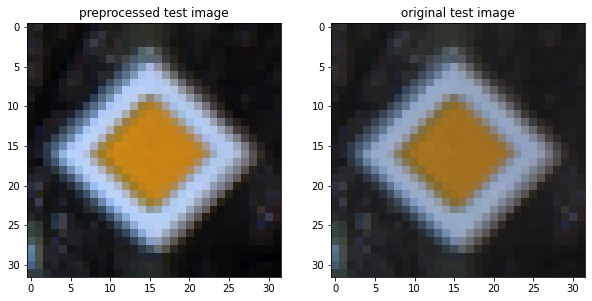

In [138]:
plot_test_samples(images, original_images, true_labels)

### Predict the Sign Type for Each Image

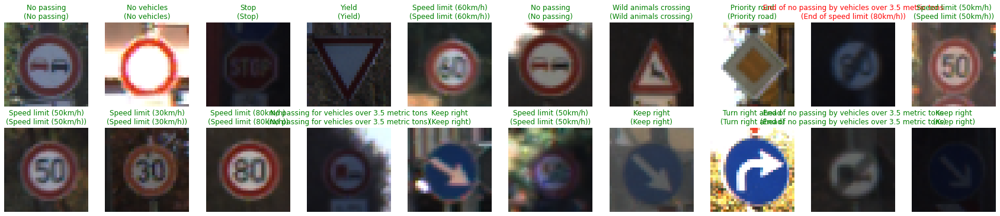

In [142]:
### Run the predictions here and use the model to output the prediction for each image.
### Make sure to pre-process the images with the same pre-processing pipeline used earlier.
### Feel free to use as many code cells as needed.

model.eval()
batch_size = 20

# obtain one batch of test images
images, original_images, true_labels = next(test_generator(batch_size))

images = images.to(device)

# Get sample outputs
with torch.no_grad():
    outputs = model(images)  # batchsize x n_classes
    outputs = torch.nn.functional.softmax(outputs, dim=1)
    
    # convert output probabilities to predicted class
    _, pred_tensor = torch.max(outputs, dim=1)

    pred_label = np.squeeze(pred_tensor.numpy()) if not torch.cuda.is_available() else np.squeeze(pred_tensor.cpu().numpy())
   
    # Display
    fig = plt.figure(figsize=(30, 6))
    for idx in np.arange(batch_size):
        ax = fig.add_subplot(2, int(batch_size/2), idx+1, xticks=[], yticks=[])
        plt.imshow(original_images[idx])
       
        # convert predicted class to text label
        true_label = sign_names.iloc[true_labels[idx],1]
        predicted_label = sign_names.iloc[int(pred_label[idx]),1]    
        
        ax.set_title("{}\n({})".format(predicted_label, true_label),
                      color=("green" if predicted_label==true_label else "red"))
        plt.axis('off')
    plt.show()

### Analyze Performance

In [143]:
### Calculate the accuracy for these 5 new images. 
### For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate on these new images.

# track test loss
test_loss = 0.0
class_correct = list(0. for i in range(n_classes))
class_total = list(0. for i in range(n_classes))

model.eval()

# iterate over test data
for images, original_images, true_labels in test_generator(batch_size):
    
    # move tensors to GPU if CUDA is available
    images = images.to(device)
    true_labels = torch.from_numpy(true_labels).long().to(device)
    
    # forward pass: compute predicted outputs by passing inputs to the model
    outputs = model(images)
    
    # calculate the batch loss
    loss = criterion(outputs, true_labels)
    
    # update test loss 
    test_loss += loss.item()*images.size(0)
    
    # convert output probabilities to predicted class
    outputs = torch.nn.functional.softmax(outputs, dim=1)
    _, preds = torch.max(outputs, dim=1)
    
    # compare predictions to true label
    correct_tensor = preds.eq(true_labels.view_as(preds))    # equivalent to tensor.view(preds.size())
    correct = np.squeeze(correct_tensor.numpy()) if not torch.cuda.is_available() else np.squeeze(correct_tensor.cpu().numpy())
    
    # calculate test accuracy for each object class
    for i in range(batch_size):
        label = true_labels[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

# average test loss
num_batches = len(X_test) // batch_size
test_loss = test_loss/(batch_size * num_batches)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(n_classes):
    if class_total[i] > 0:
        
        print('Test Accuracy of {}:'.format(sign_names.iloc[i,1]).ljust(70,' '),
              ' {:.0f}%'.format(100 * class_correct[i] / class_total[i]).ljust(8,' '), 
              '({:.0f}/{:.0f})'.format(np.sum(class_correct[i]), np.sum(class_total[i])))
    else:
        print('Test Accuracy of {}: N/A (no training examples)'.format(sign_names.iloc[i,1]))

print('\nTest Accuracy (Overall):\t {:.0f}%'.format(100. * np.sum(class_correct) / np.sum(class_total)).expandtabs(71),
      '\t({:.0f}/{:.0f})'.format(np.sum(class_correct), np.sum(class_total)).expandtabs(4))

Test Loss: 0.509611

Test Accuracy of Speed limit (20km/h):                                  0%      (0/60)
Test Accuracy of Speed limit (30km/h):                                  98%     (704/720)
Test Accuracy of Speed limit (50km/h):                                  94%     (701/748)
Test Accuracy of Speed limit (60km/h):                                  93%     (417/450)
Test Accuracy of Speed limit (70km/h):                                  92%     (608/659)
Test Accuracy of Speed limit (80km/h):                                  92%     (580/629)
Test Accuracy of End of speed limit (80km/h):                           82%     (123/150)
Test Accuracy of Speed limit (100km/h):                                 85%     (382/450)
Test Accuracy of Speed limit (120km/h):                                 97%     (435/449)
Test Accuracy of No passing:                                            100%    (478/480)
Test Accuracy of No passing for vehicles over 3.5 metric tons:          98%     (6

### Test on real images from the internet

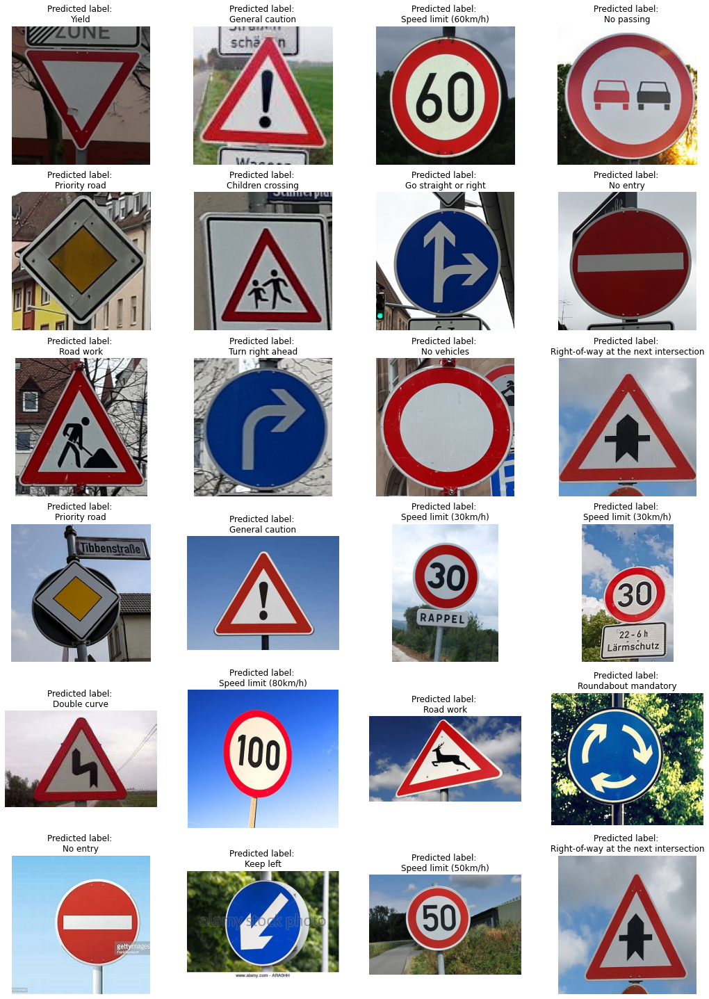

In [167]:
from glob import glob
from skimage.transform import resize
from imageio import imread

batch_size = 1
model.eval()
my_files = np.array(glob("images/*"))

plt.figure(figsize=(18,30))
num_lines = len(my_files)//4 + 1
with torch.no_grad():
    for j, filepath in enumerate(my_files):
        image = imread(filepath)
        img = cv2.resize(image, (32,32))
        #img = clahe_equalize_LAB([img])
        img = np.array(img, dtype='uint8')
        img = np.expand_dims(img, axis=0)

        img = img.transpose((0,3,1,2))
        
        img = torch.from_numpy(img).float()
        
        img = img.to(device)
        
        # Use with 1 channel images
        # output = model(img[:,0,:,:].view(1,1,32,32))
        
        # to use with 3-channel images
        img = img.view(batch_size,3,32,32)
        output = model(img)
        
        output = output.squeeze()
        pred = torch.nn.functional.softmax(output, dim=0)
       
        pred = torch.argmax(pred).item()

        label = sign_names.iloc[int(pred),1]
        plt.subplot(num_lines, 4, j + 1)
        plt.axis('off')
        plt.title('Predicted label: ' + '\n'+label)
        plt.imshow(image)

    plt.show()

### Output Top 5 Softmax Probabilities For Each Image Found on the Web

For each of the new images, print out the model's softmax probabilities to show the **certainty** of the model's predictions (limit the output to the top 5 probabilities for each image). [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. 

The example below demonstrates how tf.nn.top_k can be used to find the top k predictions for each image.

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example. The values in the array represent predictions. The array contains softmax probabilities for five candidate images with six possible classes. `tf.nn.top_k` is used to choose the three classes with the highest probability:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

C:\Users\lveys\anaconda3\envs\torch_py37\lib\site-packages\ipykernel_launcher.py:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


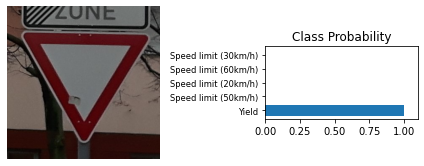

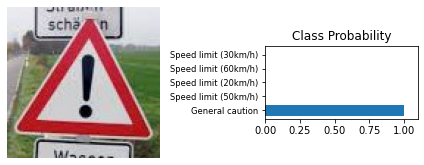

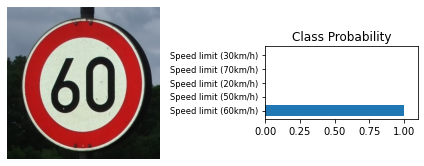

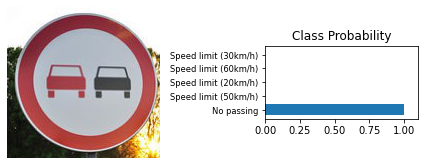

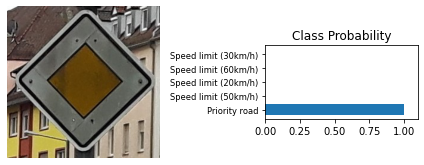

...

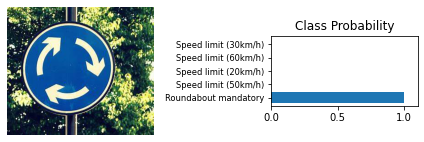

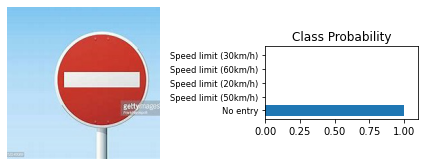

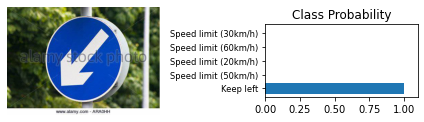

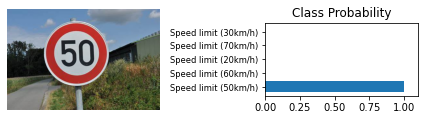

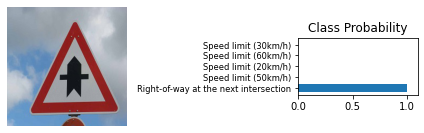

In [231]:
### Print out the top five softmax probabilities for the predictions on the German traffic sign images found on the web. 
### Feel free to use as many code cells as needed.

k=5
batch_size = 1
model.eval()
my_files = []
for file_name in os.listdir('images/'):
    my_files.append('./images/' + file_name)

with torch.no_grad():
    
    for filepath in my_files:
        
        image = imread(filepath)
        img = cv2.resize(image, (32,32))
        #img = clahe_equalize_LAB([img])
        img = np.array(img, dtype='uint8')
        img = np.expand_dims(img, axis=0)

        img = img.transpose((0,3,1,2))
        
        img = torch.from_numpy(img).float()
        
        img = img.to(device)
        
        # Use with 1 channel images
        # output = model(img[:,0,:,:].view(1,1,32,32))
        
        # to use with 3-channel images
        img = img.view(batch_size,3,32,32)
        output = model(img)
        
        output = output.squeeze()
        pred = torch.nn.functional.softmax(output, dim=0)
       
        # Select the top k probabilities
        values, indices = torch.topk(pred, k, largest=True, sorted=True)   
        
        # Display results for each image
        fig, (ax1, ax2) = plt.subplots(figsize=(6,9), ncols=2)
        
        ax1.imshow(image)
        ax1.axis('off')
        
        ax2.barh(np.arange(k), values.cpu())
        ax2.set_aspect(0.1)
        ax2.set_yticks(np.arange(k))
        ax2.set_yticklabels([sign_names.iloc[int(n),1] for n in indices], size='small');
        ax2.set_title('Class Probability')
        ax2.set_xlim(0, 1.1)
        
        plt.tight_layout()
        
    plt.show()
    plt.close('all')

---

## Step 4 (Optional): Visualize the Neural Network's State with Test Images

 This Section is not required to complete but acts as an additional excersise for understaning the output of a neural network's weights. While neural networks can be a great learning device they are often referred to as a black box. We can understand what the weights of a neural network look like better by plotting their feature maps. After successfully training your neural network you can see what it's feature maps look like by plotting the output of the network's weight layers in response to a test stimuli image. From these plotted feature maps, it's possible to see what characteristics of an image the network finds interesting. For a sign, maybe the inner network feature maps react with high activation to the sign's boundary outline or to the contrast in the sign's painted symbol.

 Provided for you below is the function code that allows you to get the visualization output of any tensorflow weight layer you want. The inputs to the function should be a stimuli image, one used during training or a new one you provided, and then the tensorflow variable name that represents the layer's state during the training process, for instance if you wanted to see what the [LeNet lab's](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) feature maps looked like for it's second convolutional layer you could enter conv2 as the tf_activation variable.

For an example of what feature map outputs look like, check out NVIDIA's results in their paper [End-to-End Deep Learning for Self-Driving Cars](https://devblogs.nvidia.com/parallelforall/deep-learning-self-driving-cars/) in the section Visualization of internal CNN State. NVIDIA was able to show that their network's inner weights had high activations to road boundary lines by comparing feature maps from an image with a clear path to one without. Try experimenting with a similar test to show that your trained network's weights are looking for interesting features, whether it's looking at differences in feature maps from images with or without a sign, or even what feature maps look like in a trained network vs a completely untrained one on the same sign image.

<figure>
 <img src="visualize_cnn.png" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above)</p> 
 </figcaption>
</figure>
 <p></p> 


In [ ]:
### Visualize your network's feature maps here.
### Feel free to use as many code cells as needed.

# image_input: the test image being fed into the network to produce the feature maps
# tf_activation: should be a tf variable name used during your training procedure that represents the calculated state of a specific weight layer
# activation_min/max: can be used to view the activation contrast in more detail, by default matplot sets min and max to the actual min and max values of the output
# plt_num: used to plot out multiple different weight feature map sets on the same block, just extend the plt number for each new feature map entry


In [244]:
layers = [module for module in model.modules() if type(module) != nn.Sequential]
layers

[Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
 ReLU(),
 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
 Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
 ReLU(),
 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
 Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
 ReLU(),
 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
 Flatten(),
 Dropout(p=0.5, inplace=False),
 Linear(in_features=1024, out_features=256, bias=True),
 ReLU(),
 Dropout(p=0.5, inplace=False),
 Linear(in_features=256, out_features=128, bias=True),
 ReLU(),
 Linear(in_features=128, out_features=43, bias=True)]

In [242]:
def outputfeatureMap(image, model, activation_min=-1, activation_max=-1 ,plt_num=1):
    
    layers = [module for module in model.modules() if type(module) != nn.Sequential]
    
    weights = layers[0].weight.data  # shape Conv1_output_feature_depth x 1 x kernel_size x kernel_size)
    
    featuremaps = weights.shape[0]
    
    activation = weights.cpu().numpy()
    
    plt.figure(plt_num, figsize=(15,15))
    
    for featuremap in range(featuremaps):
        plt.subplot(6,8, featuremap+1) # sets the number of feature maps to show on each row and column
        plt.title('FeatureMap ' + str(featuremap)) # displays the feature map number
        if activation_min != -1 & activation_max != -1:
            plt.imshow(activation[featuremap][0], interpolation="nearest", vmin =activation_min, vmax=activation_max, cmap="gray")
        
        elif activation_max != -1:
            plt.imshow(activation[featuremap][0], interpolation="nearest", vmax=activation_max, cmap="gray")
        
        elif activation_min !=-1:
            plt.imshow(activation[featuremap][0], interpolation="nearest", vmin=activation_min, cmap="gray")
        
        else:
            plt.imshow(activation[featuremap][0], interpolation="nearest", cmap="gray")

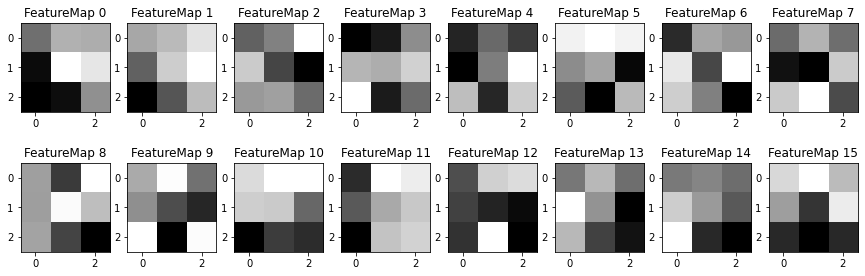

In [245]:
# Display the weights of the model's first Conv layer. Output has 16 feature maps => 16 weigths
outputfeatureMap(img, model)

In [481]:
def activatedFeatureMap(image, model, mode):  # mode = 1 display weights and image activation once convolved side-by-side
                                              # mode = 2 display only the activated maps 
    
    layers = [module for module in model.modules() if type(module) != nn.Sequential]
    
    weights = layers[0].weight.data  # shape Conv1_output_feature_depth x 1 x kernel_size x kernel_size)
    
    featuresmaps = weights.shape[0]  # number of feature maps in Conv output (ie number of features out)
    
    weight = weights.cpu().numpy()
    
    if mode ==1:
        print('Conv2D layer1 filter weights and corresponding feature maps after activation :')
        plt.figure(figsize=(15,8))
        columns = 4 * 2
        rows = int(featuresmaps//4)

        for i in range(columns * rows):
        
            plt.subplot(rows, columns, i+1)
        
            if i%2 == 0 :
            
                plt.imshow(weight[int(i/2)][0], interpolation="nearest", cmap = 'gray')
                plt.axis('off')
            
            else:
            
                c = cv2.filter2D(img, -1, kernel = weight[int((i-1)/2)][0])
          
                plt.imshow(c, cmap = 'gray')
                plt.axis('off')
        
        plt.show()   
        
    if mode ==2:
        print('feature maps after activation of Conv2D layer n°1 :')
        plt.figure(figsize=(20,5))
        columns = 4 * 2
        rows = int(featuresmaps//8)
        
        for i in range(columns * rows):
        
            plt.subplot(rows, columns, i+1)
            c = cv2.filter2D(img, -1, kernel = weight[int((i-1)/2)][0])
            plt.imshow(c, cmap = 'gray')
            plt.axis('off')
        
        plt.show()   

feature maps after activation of Conv2D layer n°1 :


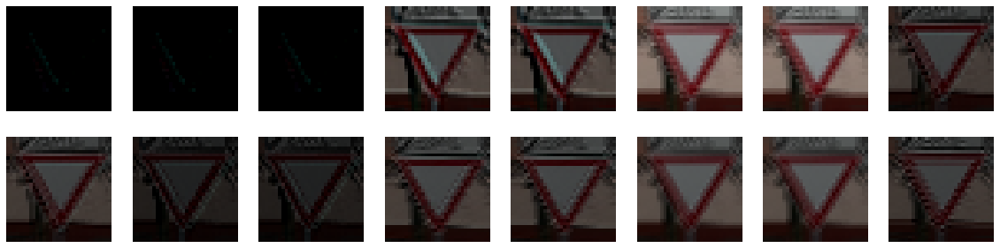

feature maps after activation of Conv2D layer n°1 :


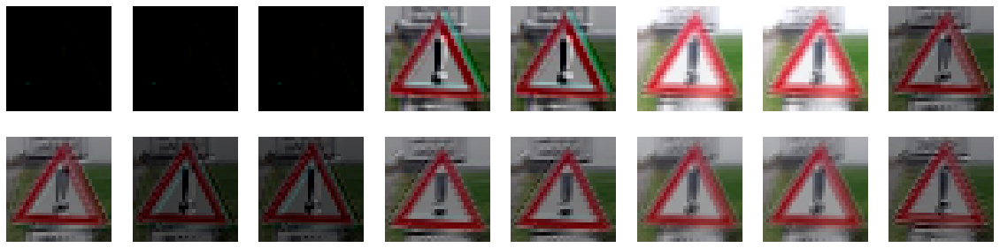

feature maps after activation of Conv2D layer n°1 :


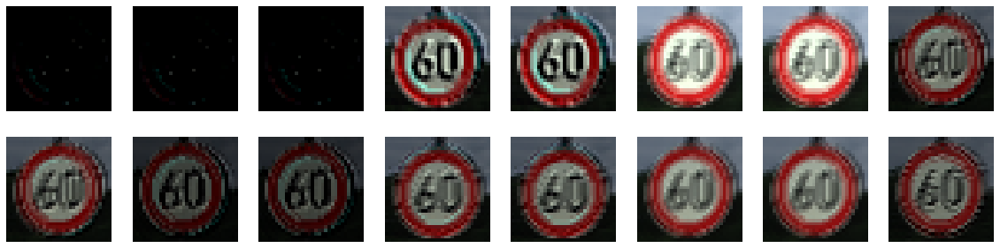

feature maps after activation of Conv2D layer n°1 :


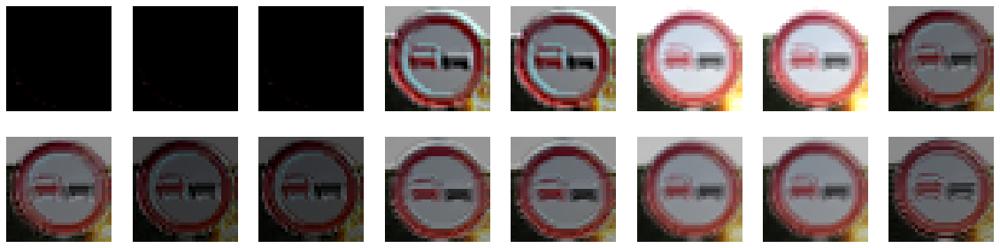

feature maps after activation of Conv2D layer n°1 :


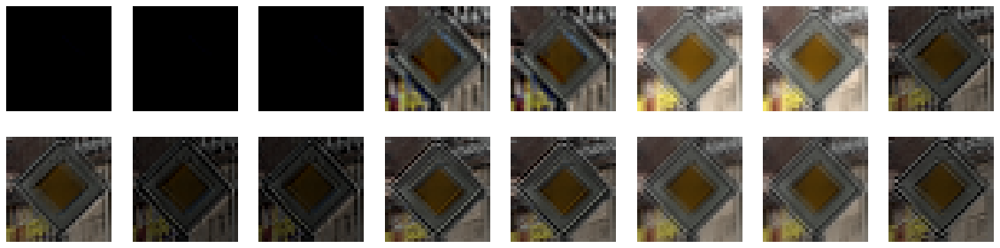

feature maps after activation of Conv2D layer n°1 :


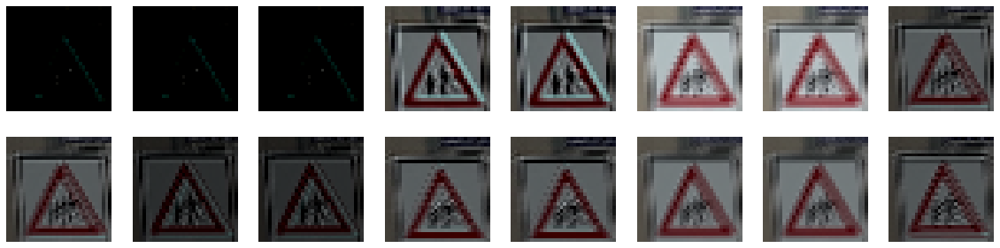

feature maps after activation of Conv2D layer n°1 :


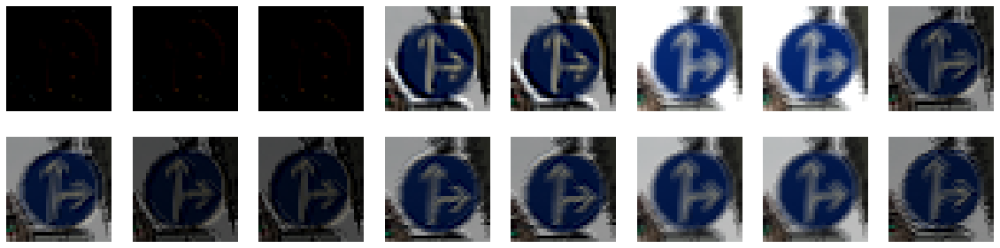

feature maps after activation of Conv2D layer n°1 :


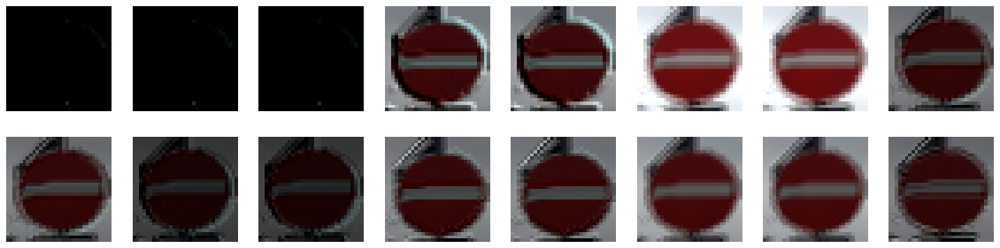

feature maps after activation of Conv2D layer n°1 :


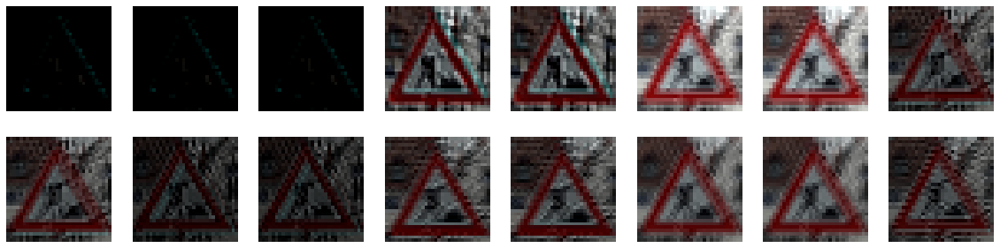

feature maps after activation of Conv2D layer n°1 :


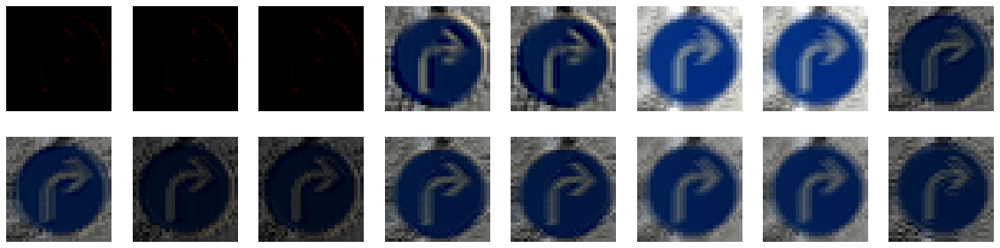

feature maps after activation of Conv2D layer n°1 :


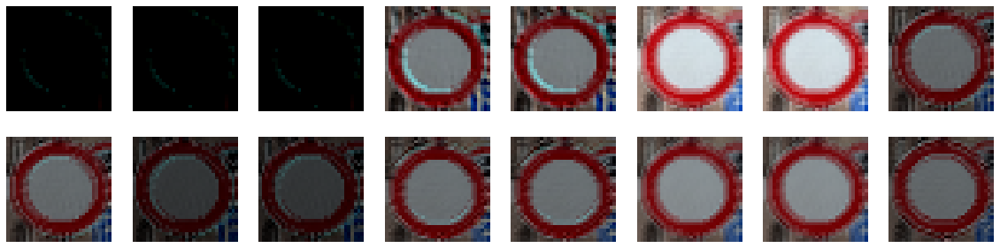

feature maps after activation of Conv2D layer n°1 :


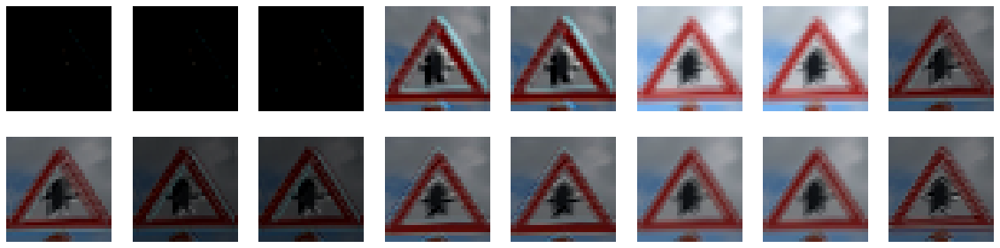

feature maps after activation of Conv2D layer n°1 :


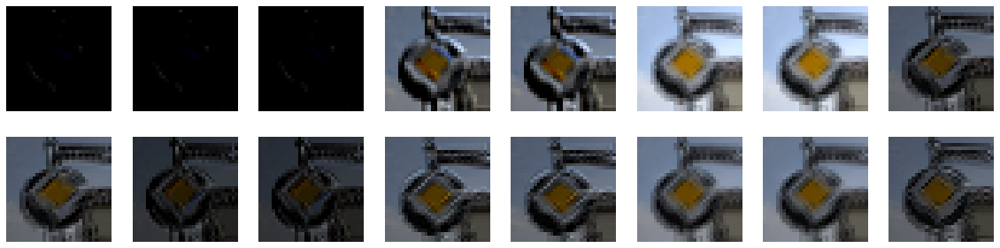

feature maps after activation of Conv2D layer n°1 :


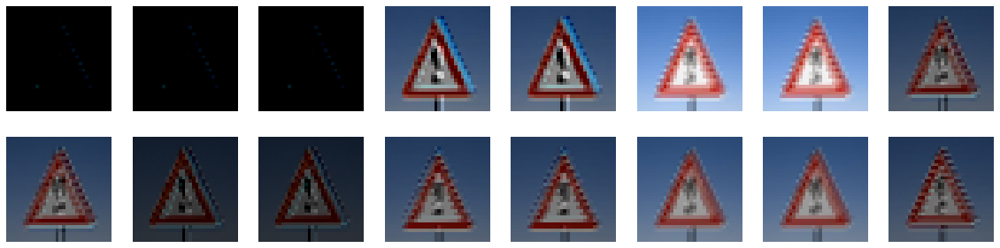

feature maps after activation of Conv2D layer n°1 :


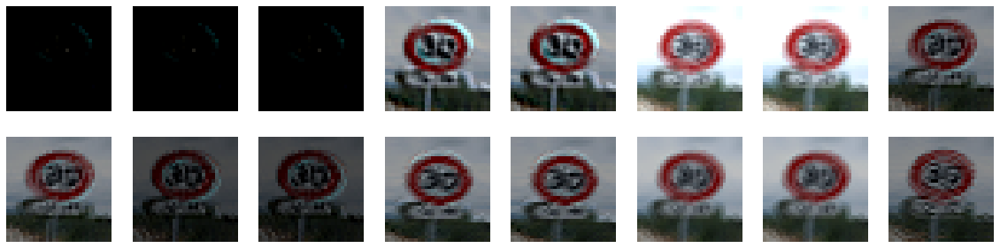

feature maps after activation of Conv2D layer n°1 :


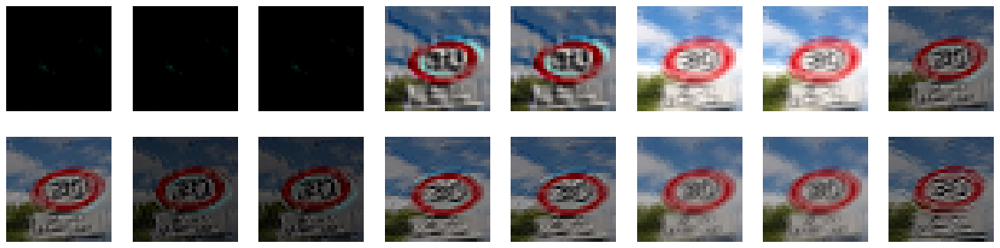

feature maps after activation of Conv2D layer n°1 :


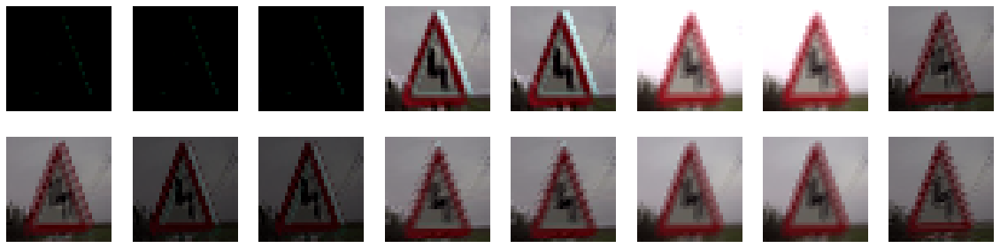

feature maps after activation of Conv2D layer n°1 :


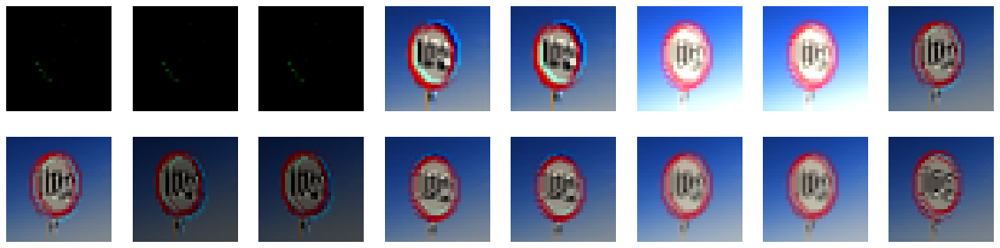

feature maps after activation of Conv2D layer n°1 :


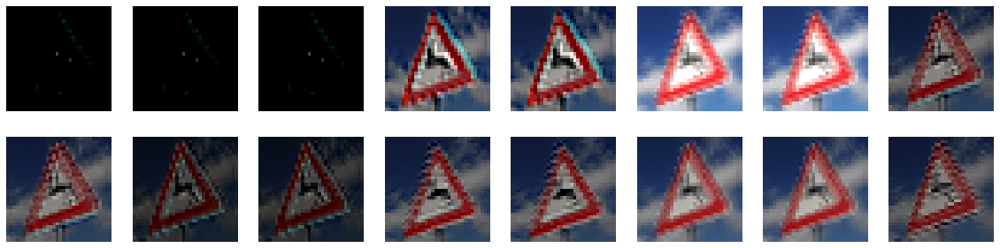

feature maps after activation of Conv2D layer n°1 :


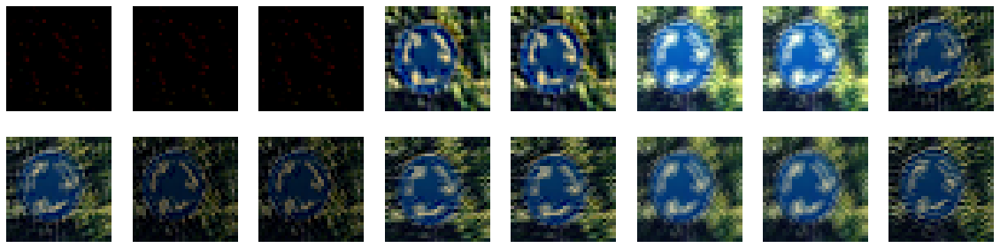

feature maps after activation of Conv2D layer n°1 :


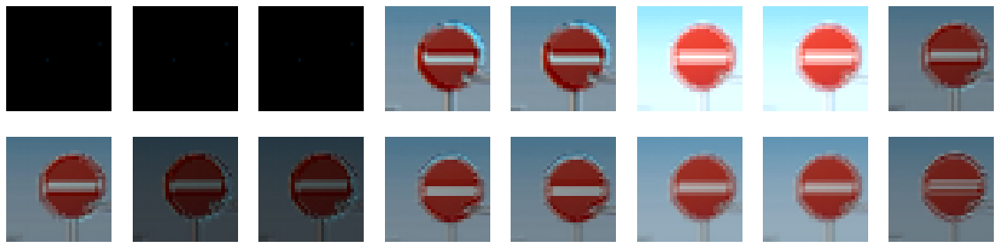

feature maps after activation of Conv2D layer n°1 :


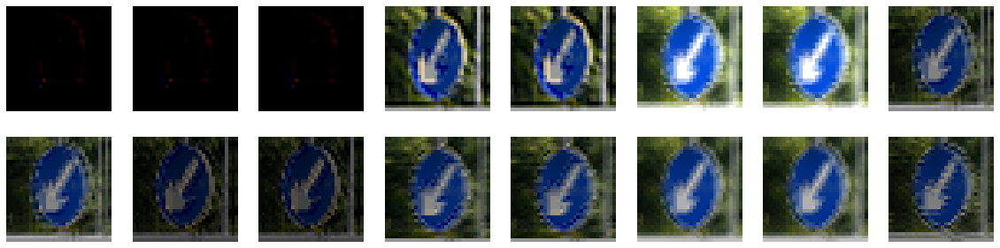

feature maps after activation of Conv2D layer n°1 :


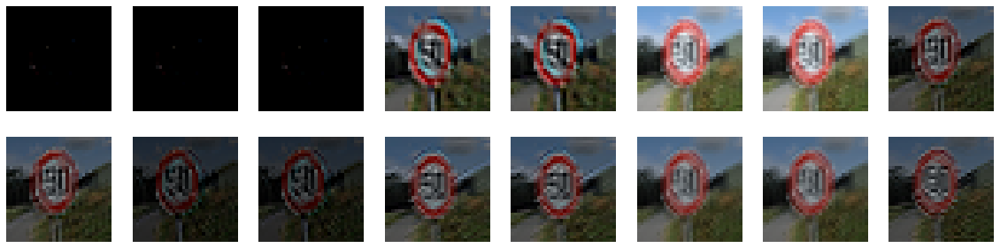

feature maps after activation of Conv2D layer n°1 :


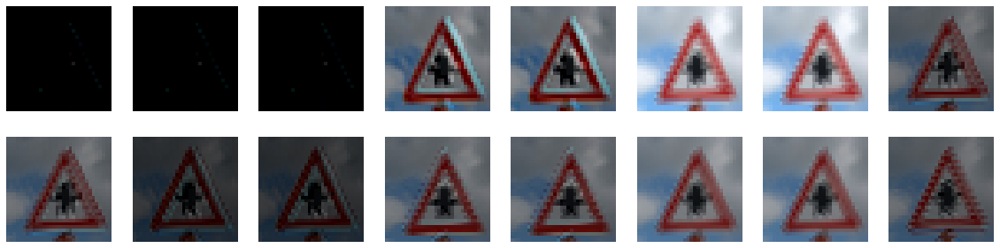

In [482]:
# Display the activation of the model's first Conv layer based on one image. Output has 16 feature maps => 16 weigths
my_files = []
for file_name in os.listdir('images/'):
    my_files.append('./images/' + file_name)

batch_size = 1

with torch.no_grad():
    
    for filepath in my_files:
        
        image = imread(filepath)
        img = cv2.resize(image, (32,32))
        
        # Display the activation with 2 modes:
        # mode = 1 display weights and image activation once convolved side-by-side
        # mode = 2 display only the activated maps 
        
        activatedFeatureMap(img, model, mode = 2)

In [ ]:
def one_hot_tensor(label):
    #indices = torch.randint(0,n_classes, size=(1,))
    #one_hot = torch.nn.functional.one_hot(indices, n_classes)         # produces size=(1,n) type LongTensor (integers)
    one_hot = torch.zeros((1, n_classes)).type(torch.LongTensor)       # size=(1,n_classes) type LongTensor (integers)
    one_hot[:,label] = 1
    return one_hot